Import relevant packages and libraries


In [2]:
# Import packages
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams

from statsmodels.tsa.stattools import adfuller
%pip install pmdarima --quiet
import pmdarima as pm


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


Import Dataset and Clean Data

In [3]:
# import dataset
data = pd.read_csv("../shelter_neighbourhood_features_pca.csv")

In [4]:
### CLEAN DATA ###

# # extract Toronto only shelters:
data = data[data["LOCATION_CITY"] == "Toronto"]

# # drop columns that are not useful
data = data.drop(columns=["_id",
                          "ORGANIZATION_ID", 
                          "ORGANIZATION_NAME", 
                          "SHELTER_ID", 
                          "SHELTER_GROUP", 
                          "LOCATION_ID", 
                          "LOCATION_ADDRESS", 
                          "LOCATION_POSTAL_CODE", 
                          "LOCATION_CITY", 
                          "LOCATION_PROVINCE", 
                          "PROGRAM_ID", 
                          "PROGRAM_NAME", 
                          "SECTOR", 
                          "PROGRAM_MODEL",
                          "OVERNIGHT_SERVICE_TYPE", 
                          "PROGRAM_AREA",
                          "OVERNIGHT_SERVICE_TYPE",
                          "CAPACITY_TYPE",
                          "CAPACITY_ACTUAL_BED",
                          "CAPACITY_FUNDING_BED",
                          "OCCUPIED_BEDS",
                          "UNOCCUPIED_BEDS",
                          "UNAVAILABLE_BEDS",
                          "CAPACITY_ACTUAL_ROOM",
                          "CAPACITY_FUNDING_ROOM",
                          "OCCUPIED_ROOMS",
                          "UNOCCUPIED_ROOMS",
                          "UNAVAILABLE_ROOMS",
                          "OCCUPANCY_RATE_BEDS",
                          "OCCUPANCY_RATE_ROOMS", 
                          "LAT",
                          "LON",
                          "Neighbourhood Number"])



In [5]:
# set the OCCUPANCY DATE as index
data = data.set_index(["OCCUPANCY_DATE"])

# convert to OCCUPANCY DATE to datetime format
data.index = pd.to_datetime(data.index)
# data = data.set_index(["OCCUPANCY_DATE"])

# aggregate the service user count
data1= data.groupby(["Neighbourhood", data.index]).agg({'SERVICE_USER_COUNT': 'sum'}).reset_index()

Separate into training data and testing data


In [6]:
# data_exo  - the exogenous variables
data_exo = data.drop(columns=["LOCATION_NAME",
                          "SERVICE_USER_COUNT"])

In [7]:
# add in the pca variables 
data1_exo = pd.merge(data1, data_exo, on=['OCCUPANCY_DATE', 'Neighbourhood'], how='left')
data1_exo = data1_exo.drop_duplicates()

In [8]:
# set index as date-time
data1_exo = data1_exo.set_index(["OCCUPANCY_DATE"])

In [9]:
# extract training data
train1 = data1_exo[data1_exo.index < pd.to_datetime('2023-01-01')]
test1 = data1_exo[data1_exo.index >= pd.to_datetime('2023-01-01')]

FUNCTIONS

In [53]:
# Subset Neighbourhood specific data from each of data, test data and train data.
# PARAMETERS: 
#   data - all time series data
#   test - data to be used to test the model
#   train - the training data
#   neighbourhood - the neighbourhood to subset

def subsetNeighbourhood(data, test, train, neighbourhood):
    data = data
    neighbourhood = neighbourhood
    test = test
    train = train

    dataN = data[data["Neighbourhood"] == neighbourhood]
    testN = test[test["Neighbourhood"] == neighbourhood]
    trainN = train[train["Neighbourhood"] == neighbourhood]

    return dataN, testN, trainN

In [67]:
# Plot the timeseries data

def plotData(dataN, testN, trainN):
    # # plot train 
    # plt.figure(figsize=(15,7))
    # plt.title("Plot of service user counts")
    # plt.xlabel('Date')
    # plt.ylabel('Service user count')
    # plt.plot(trainN["SERVICE_USER_COUNT"])
    # plt.plot()
    # plt.axvline(x=pd.to_datetime("2022-01-01"), color="red", linestyle="--")
    # plt.show()

    # # plot test
    # plt.figure(figsize=(15,7))
    # plt.title("Plot of service user counts")
    # plt.xlabel('Date')
    # plt.ylabel('Service user count')
    # plt.plot(testN["SERVICE_USER_COUNT"])
    # plt.plot()

    # plt.show()

    # plot all  
    plt.figure(figsize=(15,7))
    plt.title("Plot of service user counts")
    plt.xlabel('Date')
    plt.ylabel('Service user count')
    plt.plot(dataN["SERVICE_USER_COUNT"])
    plt.plot()
    plt.axvline(x=pd.to_datetime("2022-01-01"), color="red", linestyle="--")
    plt.axvline(x=pd.to_datetime("2023-01-01"), color="red", linestyle="--")
    plt.show()

In [154]:
# Train the timeseries model on the training data
# Parameters:
#   trainN - the training time series data

def timeseriesModel(trainN):
    # SARIMAX_model = pm.auto_arima(trainN[['SERVICE_USER_COUNT']], 
    #                 #   exogenous=data_Annex.iloc[:, 2:],
    #                 start_p=1, 
    #                 start_q=1,
    #                 test='adf',
    #                 max_p=3, 
    #                 max_q=3, 
    #                 max_d=2,
    #                 m=365,
    #                 seasonal=True,
    #                 # d=None, 
    #                 start_P = 1,
    #                 max_P = 3,
    #                 D=1,
    #                 error_action='ignore',  
    #                 suppress_warnings=False, 
    #                 stepwise=True,
    #                 n_jobs= -1,
    #                 stationary= True,
    #                 trace=True,
    #                 transparams = True,
    #                 scoring='mse')

    SARIMAX_model = pm.auto_arima(trainN[['SERVICE_USER_COUNT']], 
                                exogenous=trainN.iloc[:, 2:],
                                start_p=1, start_q=1,
                                test='adf',
                                max_p=3, max_q=3, m=12,
                                start_P=0, seasonal=True,
                                d=None, D=1, 
                                trace=False,
                                error_action='ignore',  
                                suppress_warnings=True, 
                                stepwise=True,
                                n_jobs=-1,
                                scoring="mse")
    
    print(SARIMAX_model)
    return SARIMAX_model

In [155]:
# Plot the time series model's predicted values and the actual data
def plotTimeseries(SARIMAX_model, dataN, trainN, testN):
    # Forecast
    df = trainN
    all = dataN
    n_periods = 365

    # get indices for new dataframe
    forecast_df = pd.DataFrame({"day_index":pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D').day},
                    index = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D'))

    # get predictions and confidence intervals
    fitted, confint = SARIMAX_model.predict(n_periods=n_periods, 
                                            return_conf_int=True,
                                            exogenous=forecast_df.iloc[:, 2:]
                                            )
    index_of_fc = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D')

    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
    plt.figure(figsize=(15,7))
    plt.plot(all['SERVICE_USER_COUNT'], color='#1f76b4')
    plt.plot(fitted_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                    lower_series, 
                    upper_series, 
                    color='k', alpha=.15)
    plt.axvline(x=pd.to_datetime("2022-01-01"), color="red", linestyle="--")
    plt.axvline(x=pd.to_datetime("2023-01-01"), color="red", linestyle="--")
    plt.title("SARIMAX - Forecast of Service Users")
    plt.show()

    return fitted_series, lower_series, upper_series

In [156]:
# Calculate the MSE
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

def calcEval(test, forecast):
    mse = mean_squared_error(test, forecast[0:len(test),])
    print("MSE: ", mse)
    rmse = np.sqrt(mse)
    print("RMSE: ", rmse)
    mae = mean_absolute_error(test, forecast[0:len(test),])
    print("MAE: ", mae)

    return mse, rmse, mae

ANALYSIS OF DATA AND PLOTS

University


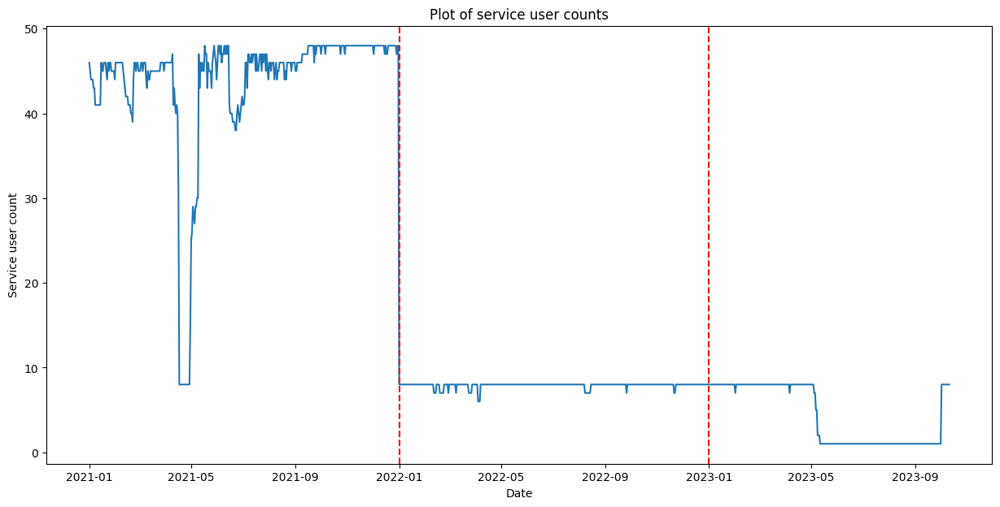

High Park-Swansea


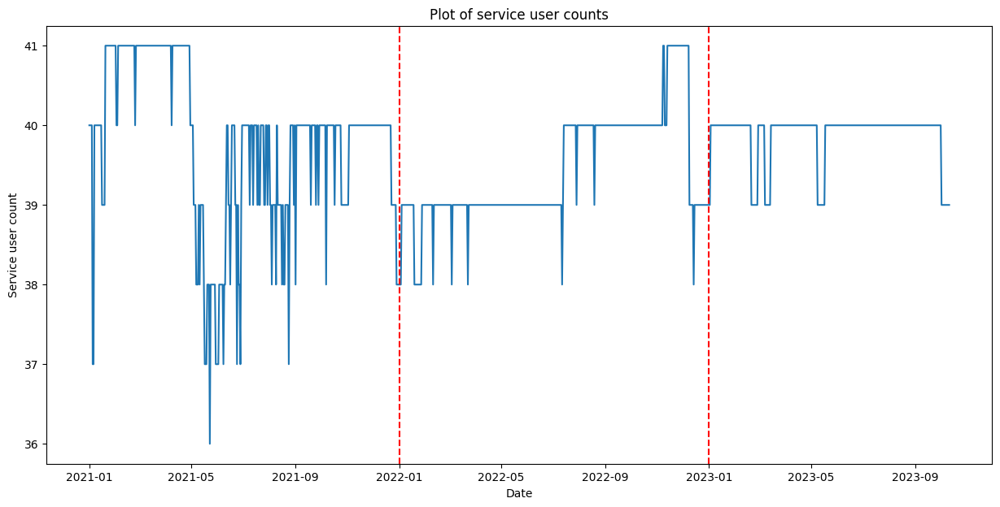

Junction-Wallace Emerson


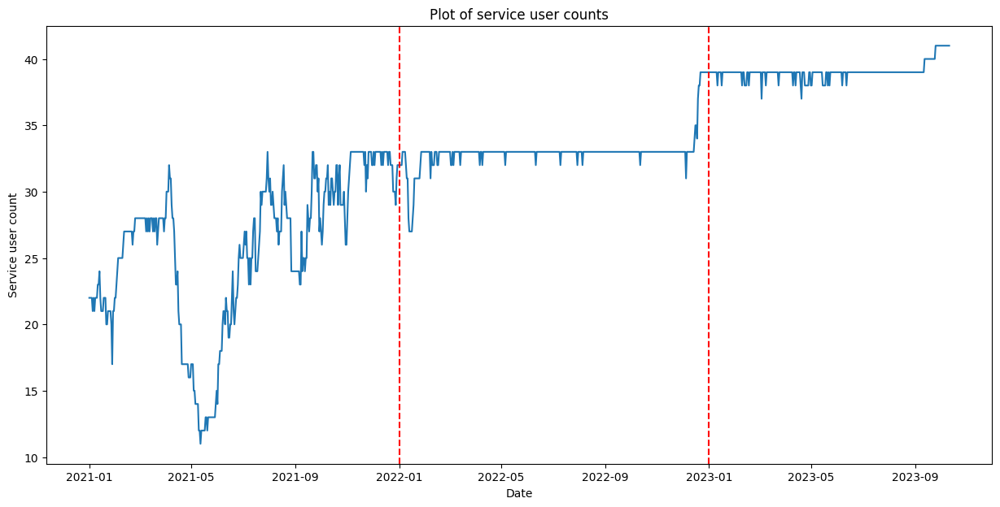

Dovercourt Village


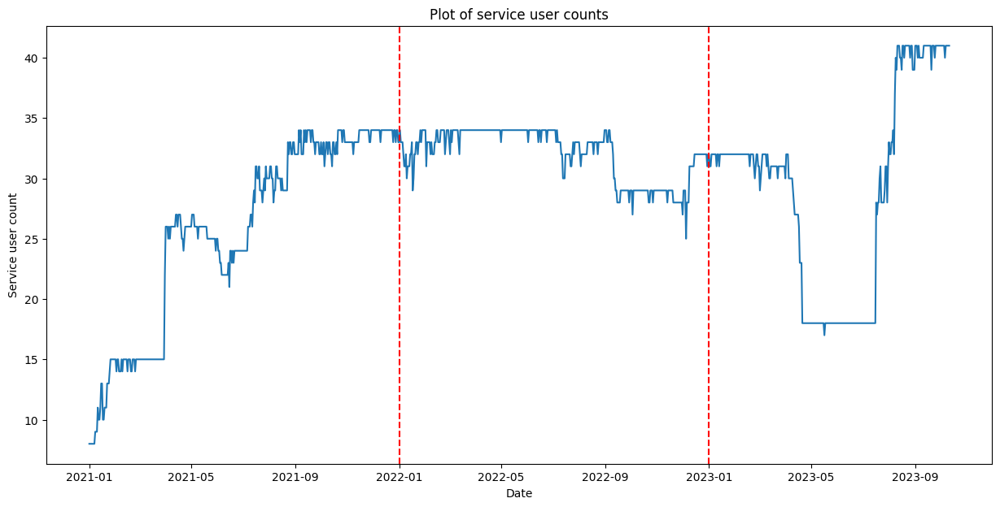

Annex


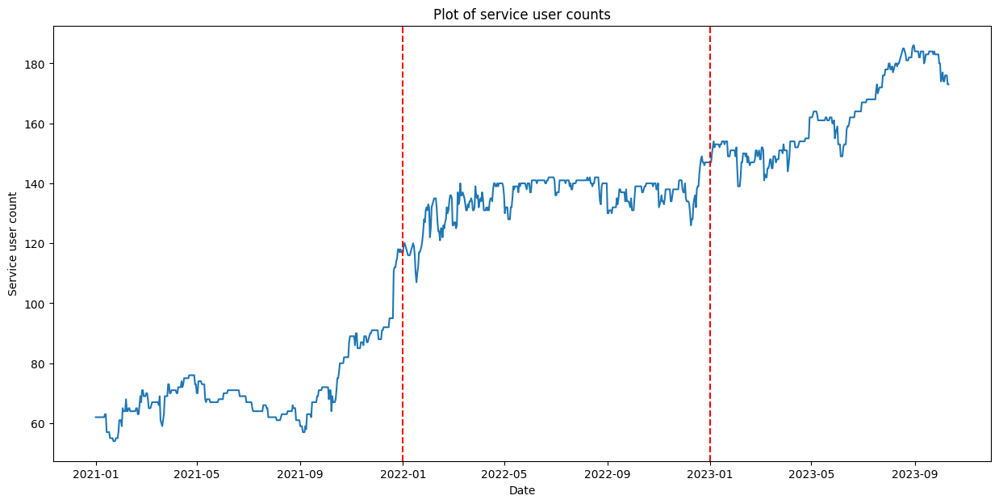

Bendale-Glen Andrew


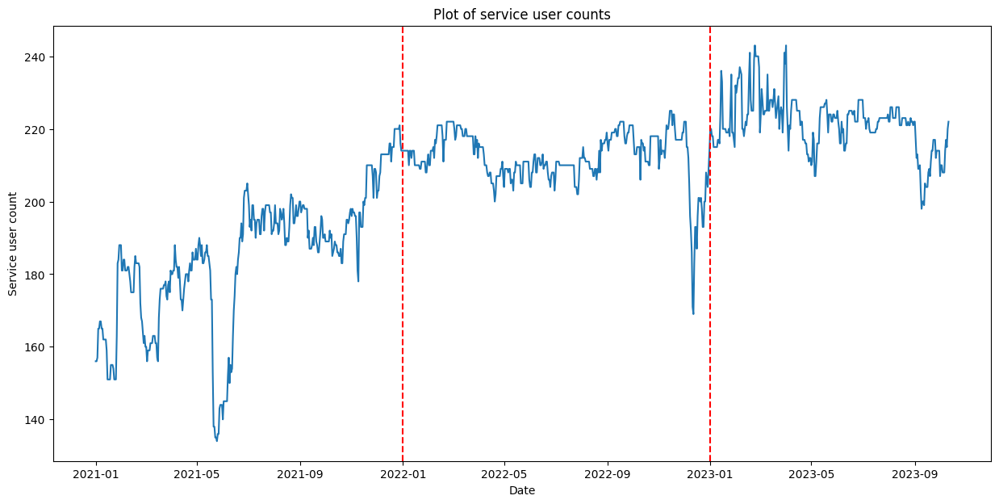

Regent Park


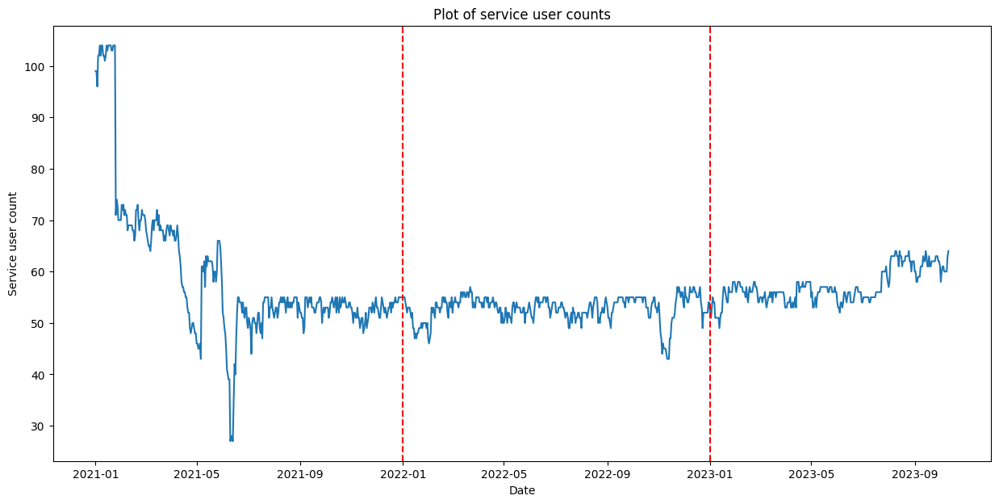

North Toronto


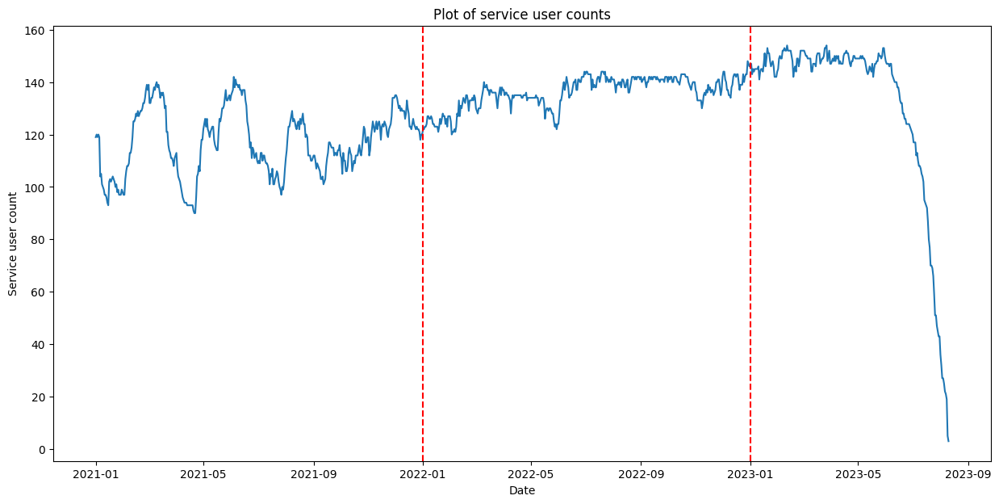

West Hill


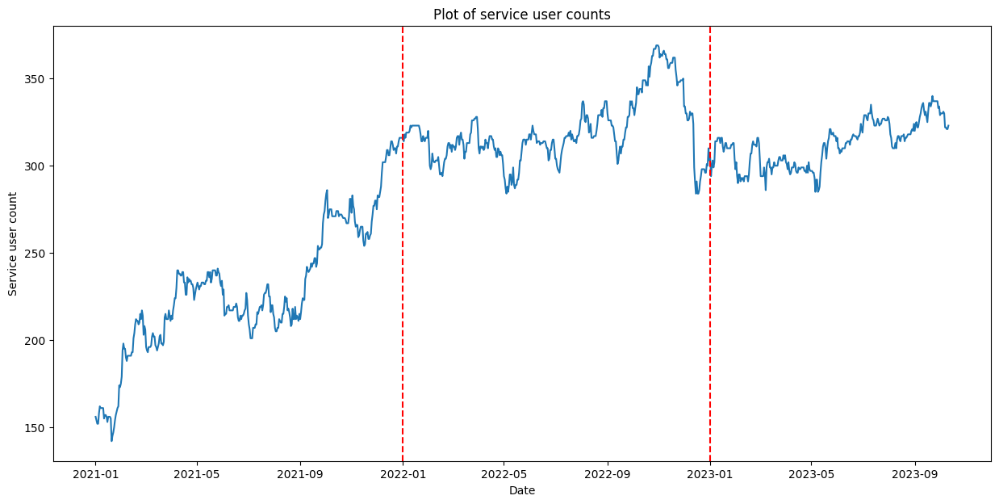

West Queen West


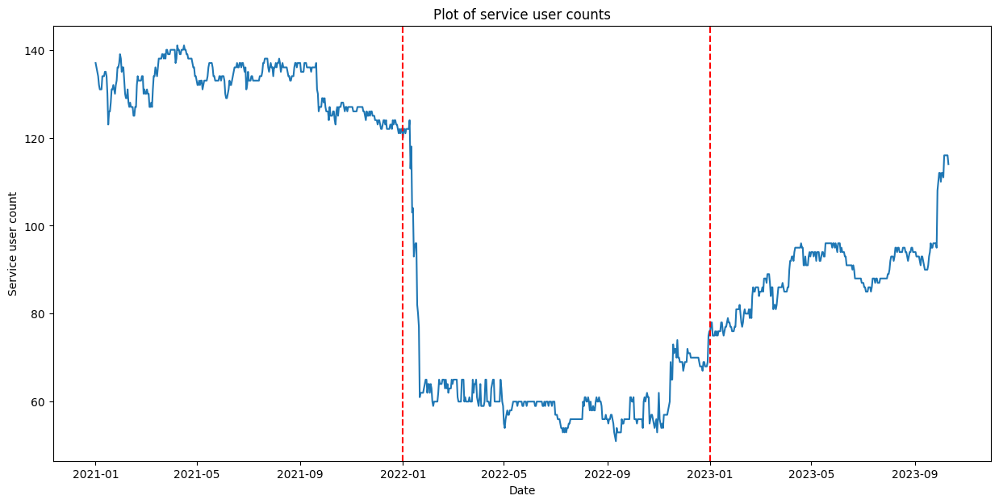

Moss Park


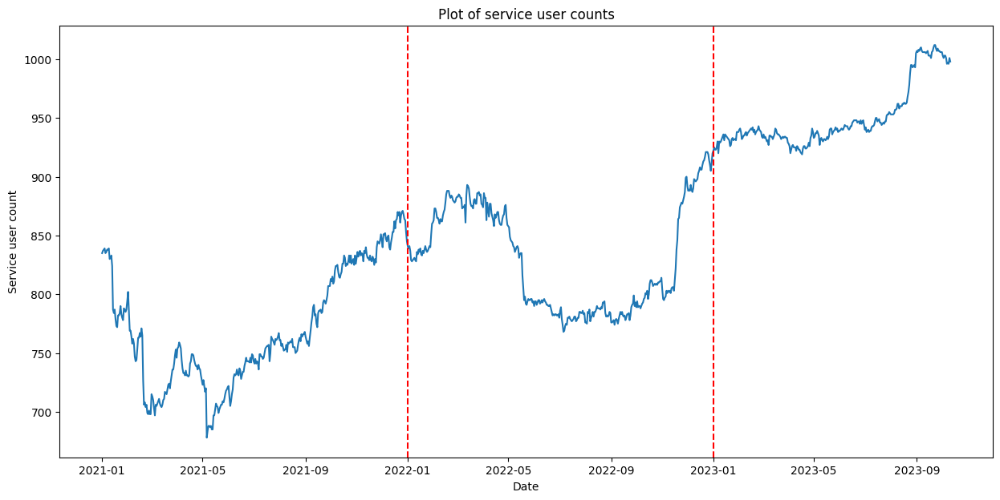

Scarborough Village


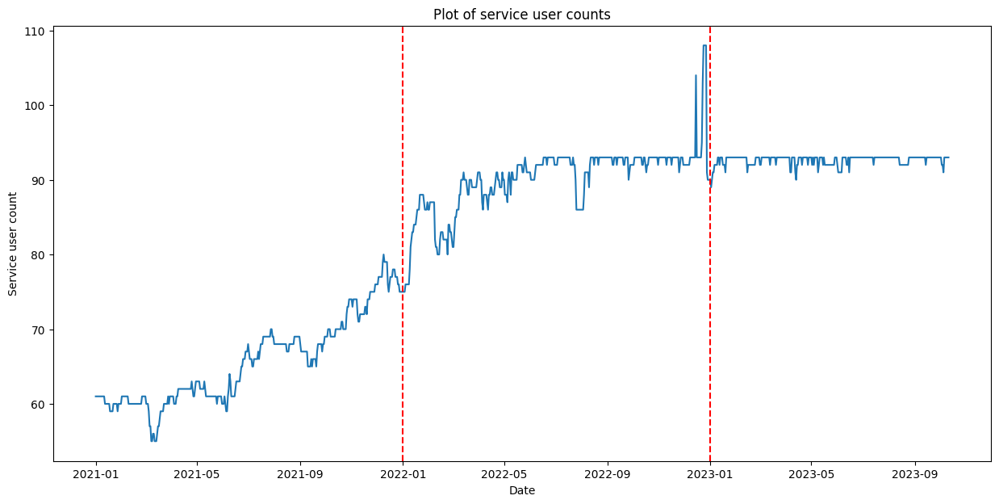

Junction Area


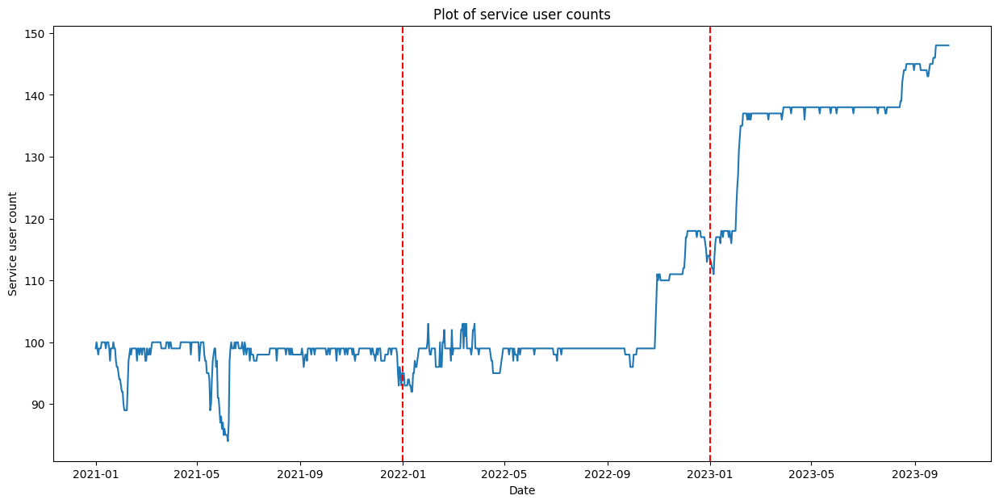

Wellington Place


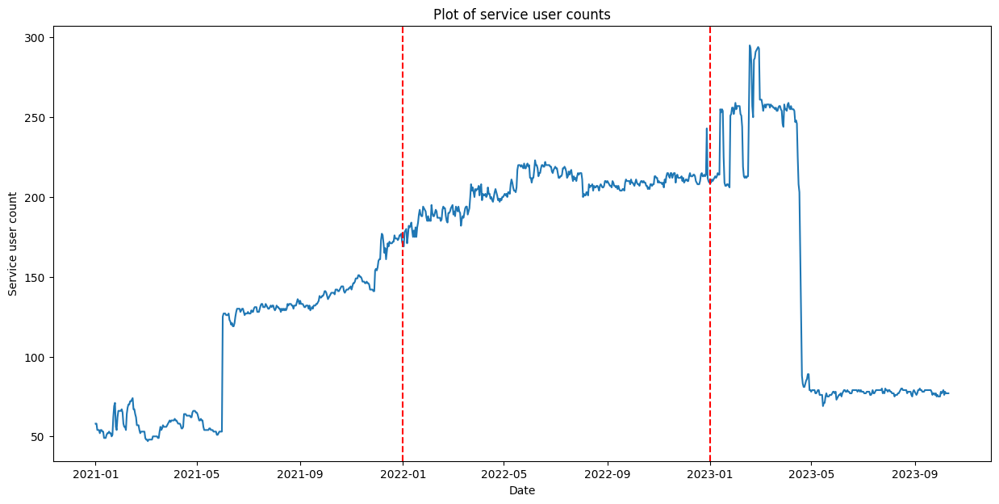

Kensington-Chinatown


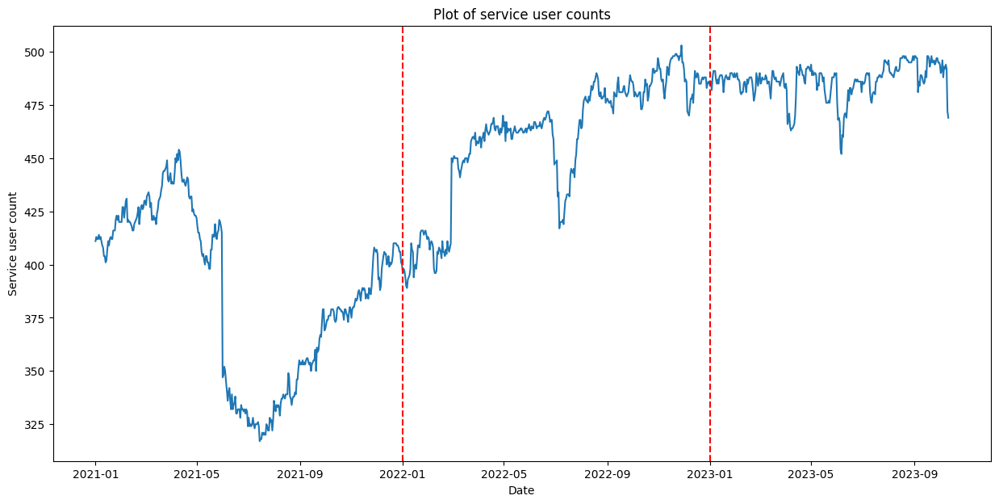

Oakwood Village


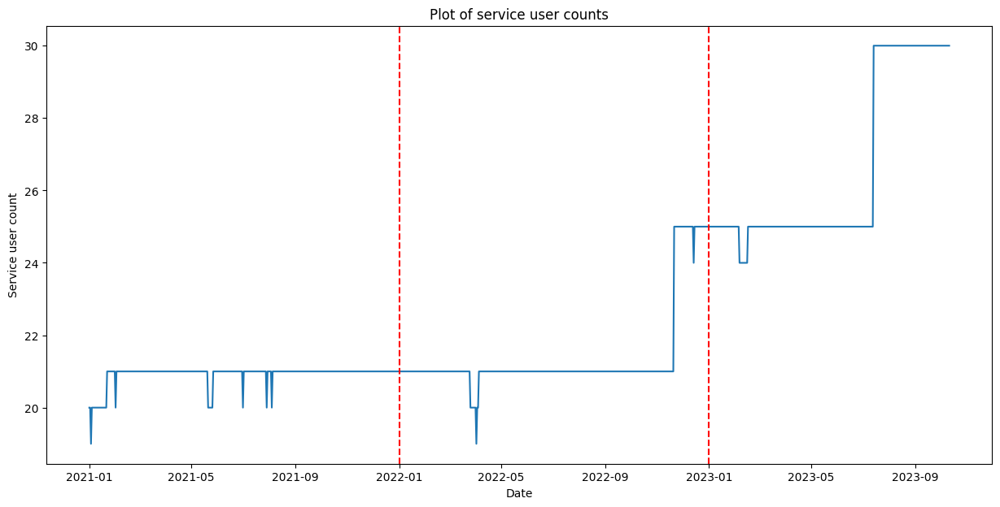

Downtown Yonge East


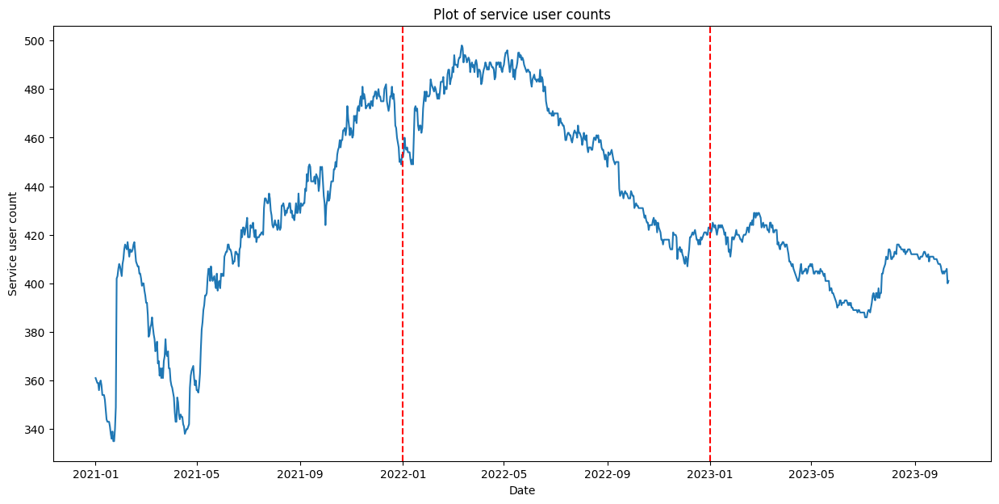

St Lawrence-East Bayfront-The Islands


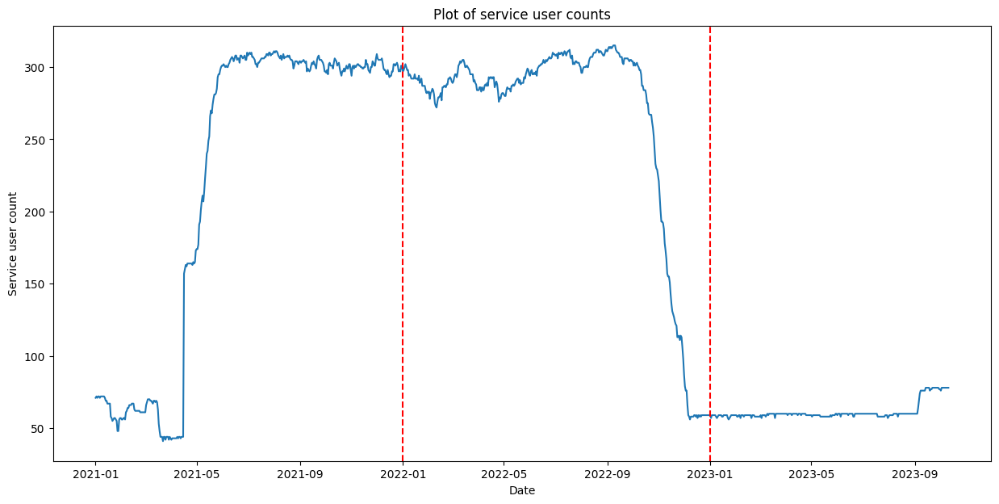

East End-Danforth


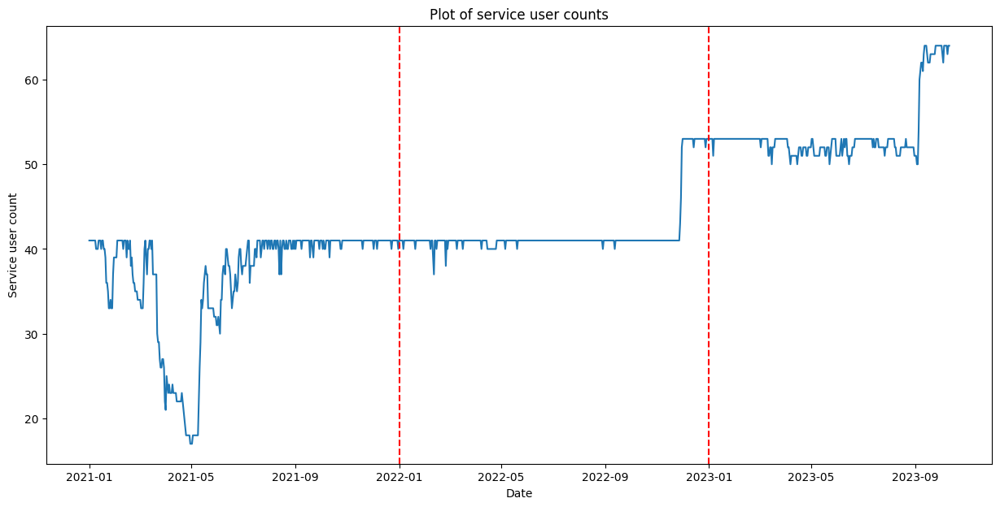

Yonge-Bay Corridor


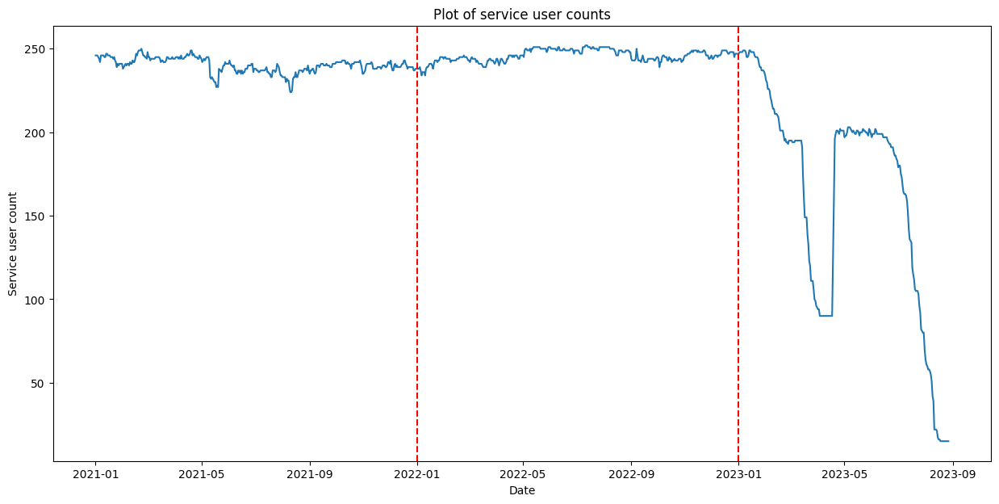

North St.James Town


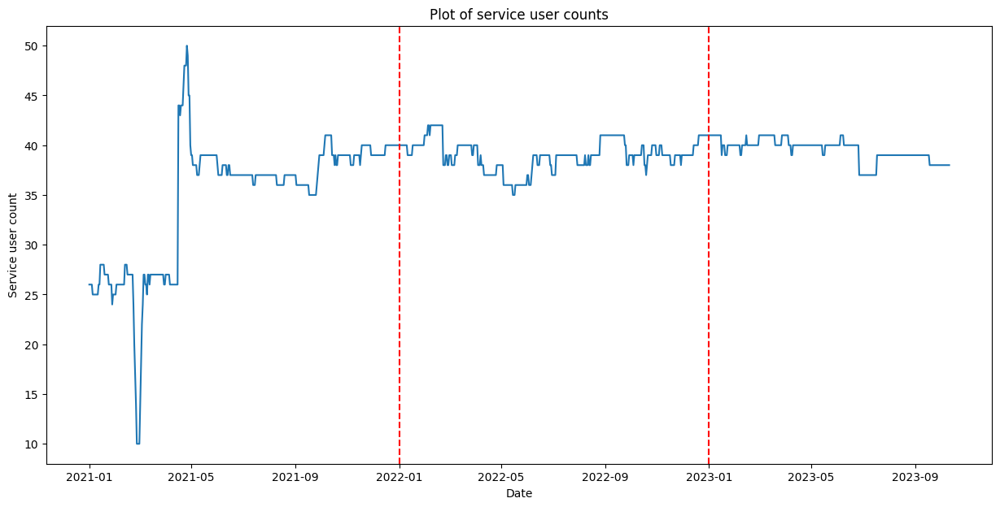

Church-Wellesley


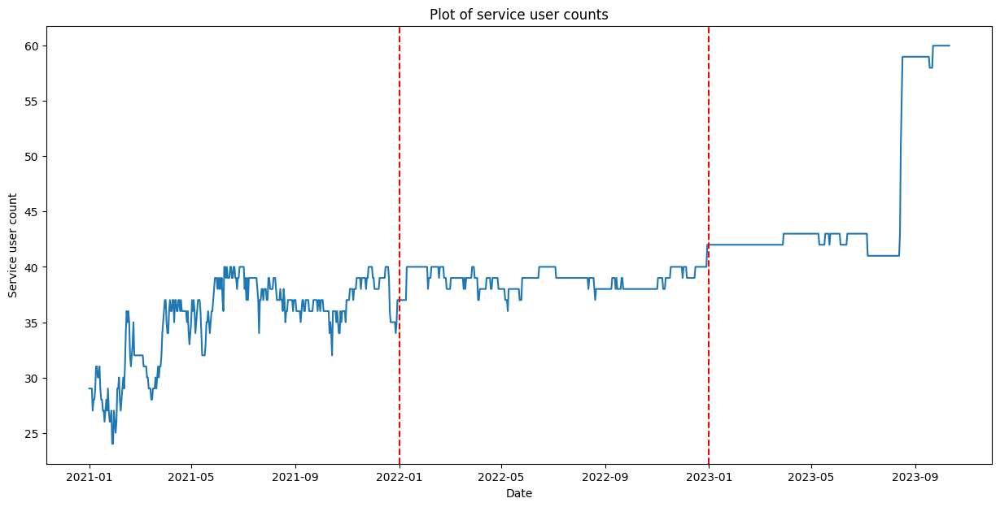

Yorkdale-Glen Park


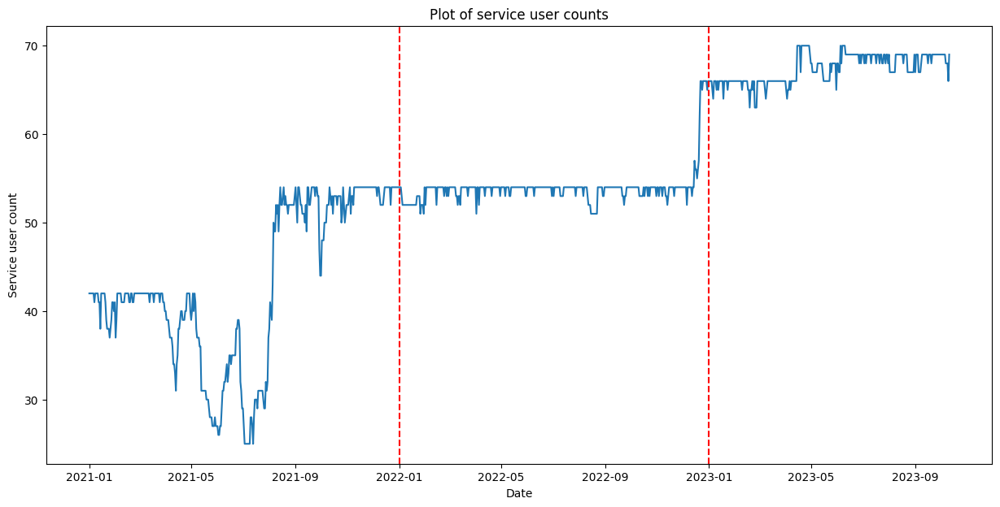

Fort York-Liberty Village


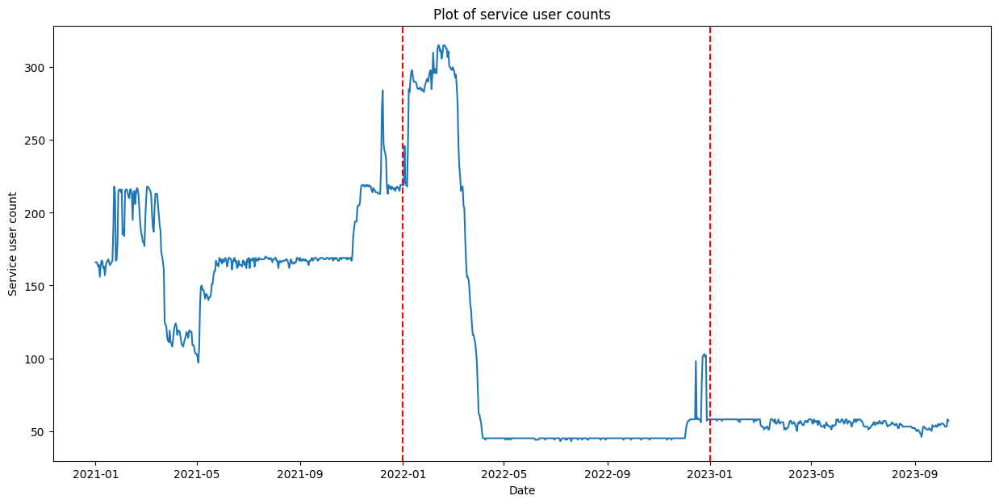

Kennedy Park


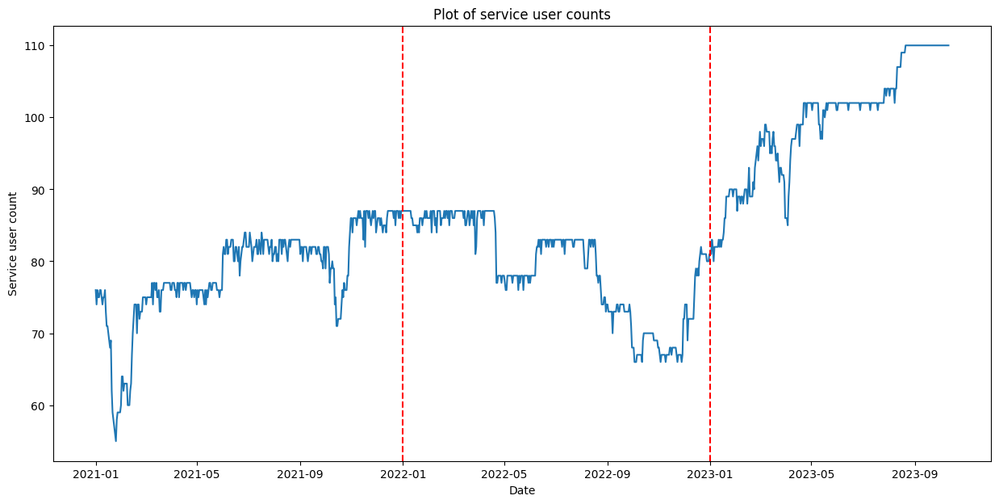

Harbourfront-CityPlace


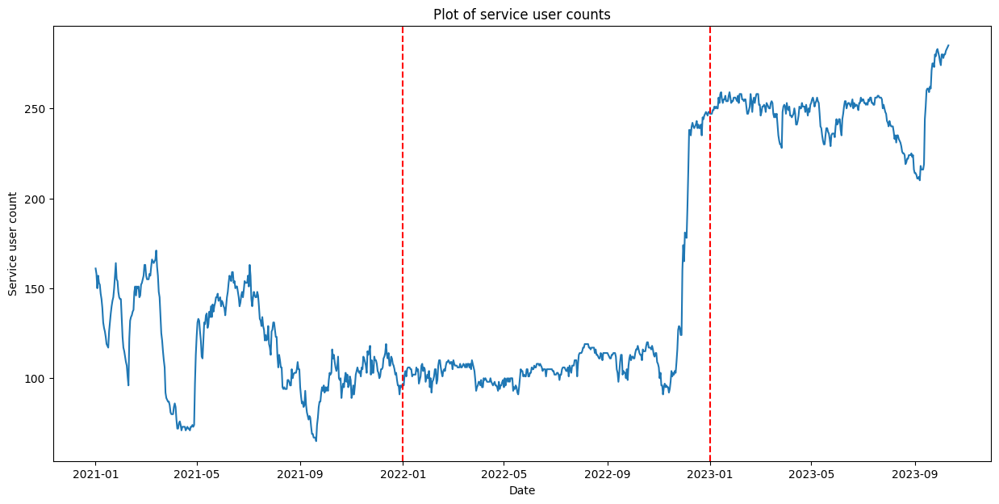

Caledonia-Fairbank


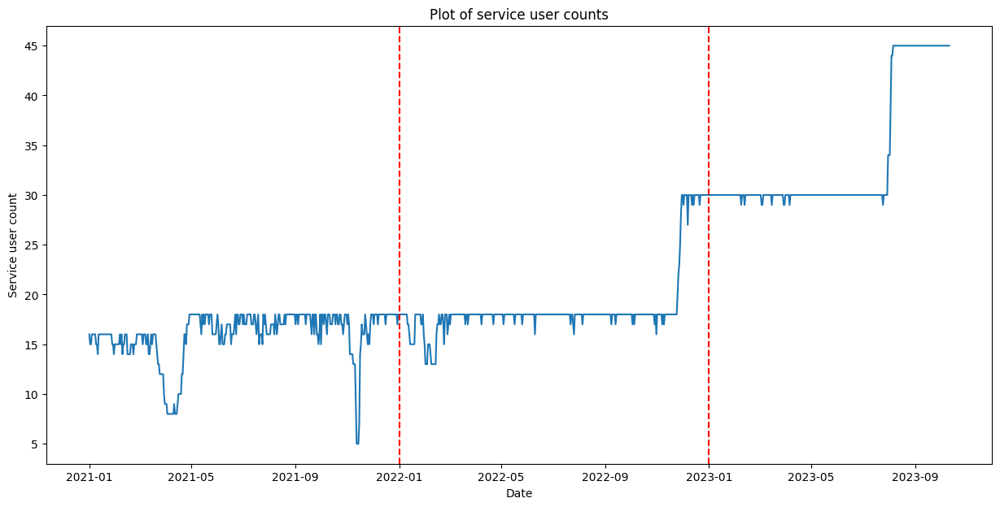

Broadview North


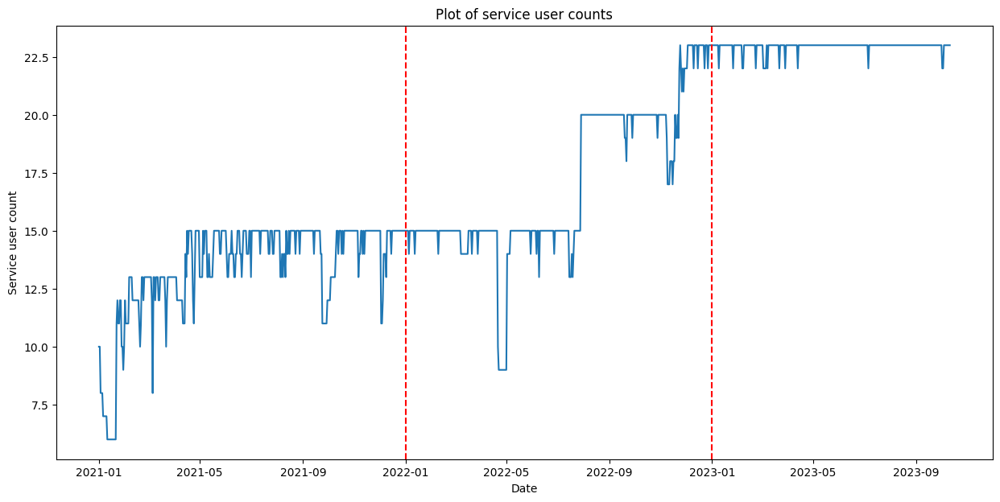

Rosedale-Moore Park


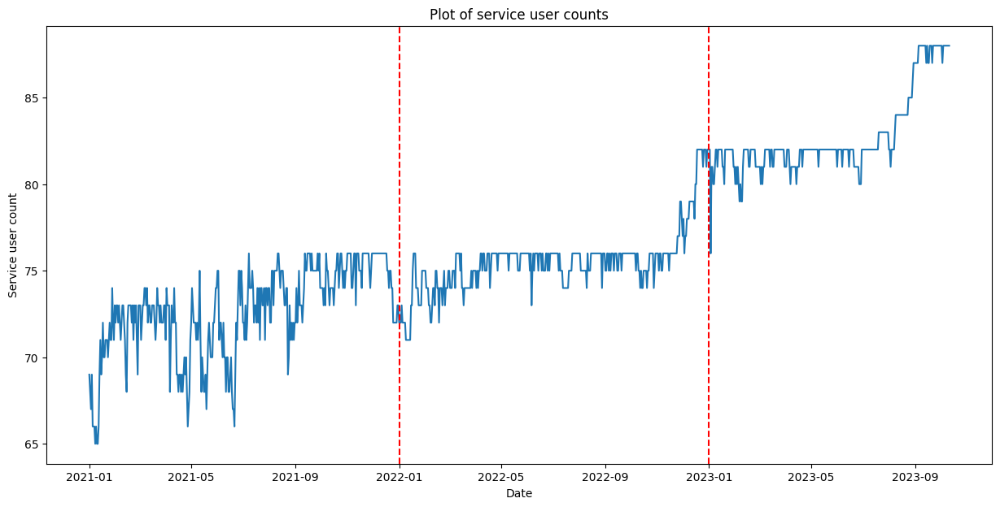

Wychwood


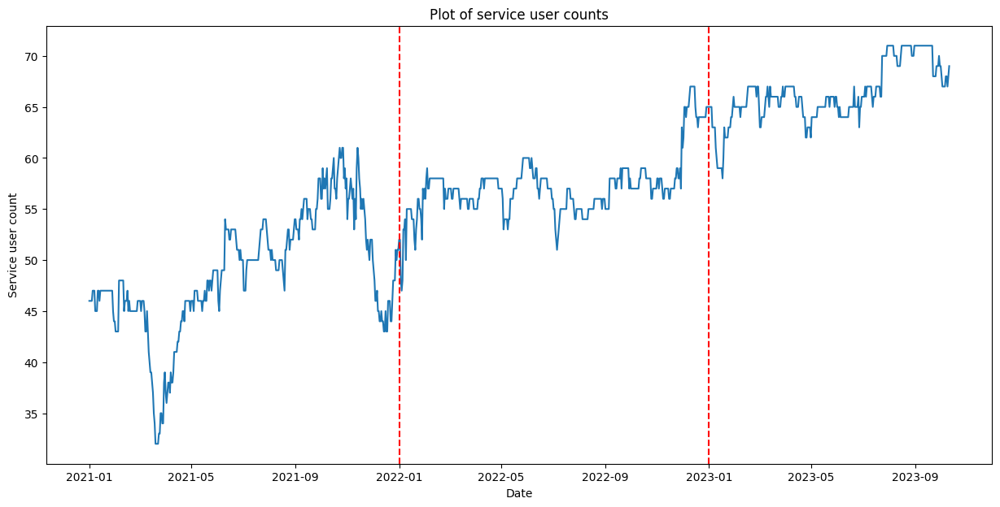

Palmerston-Little Italy


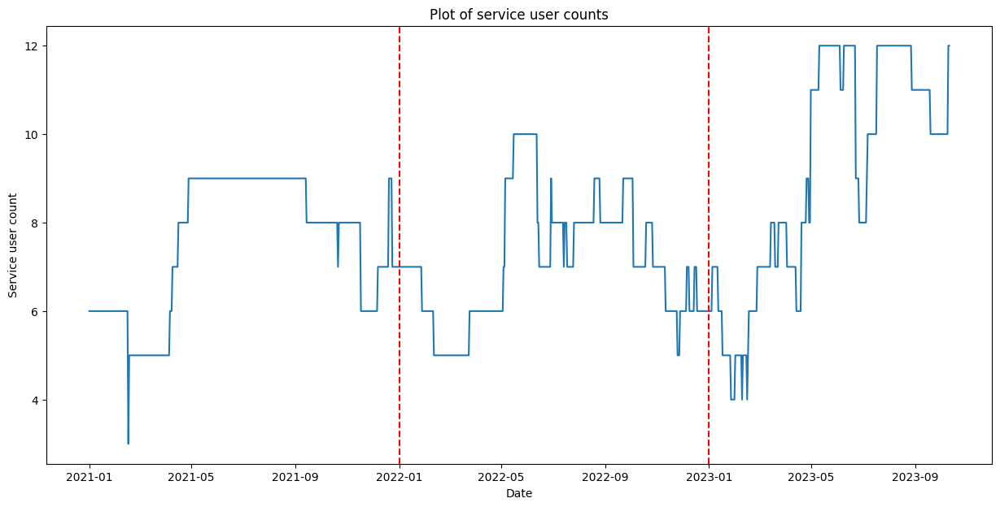

South Riverdale


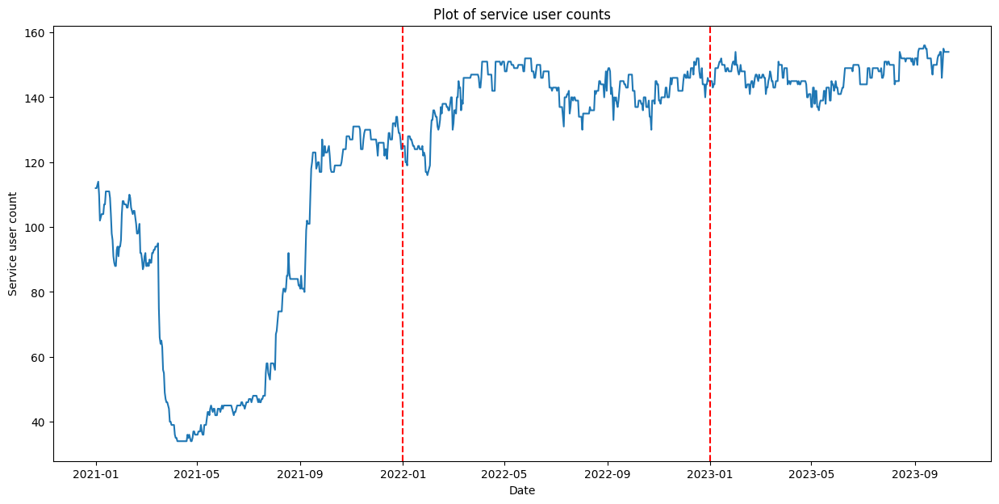

Mimico-Queensway


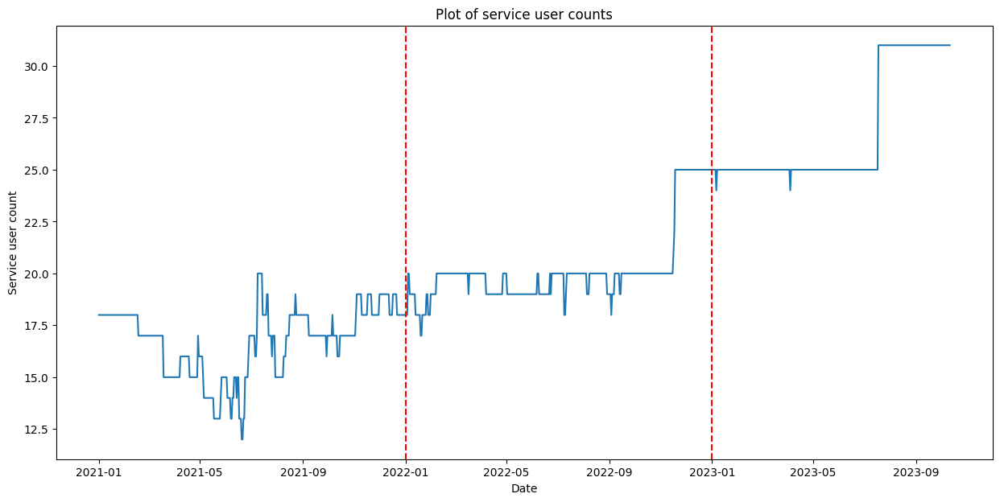

Newtonbrook East


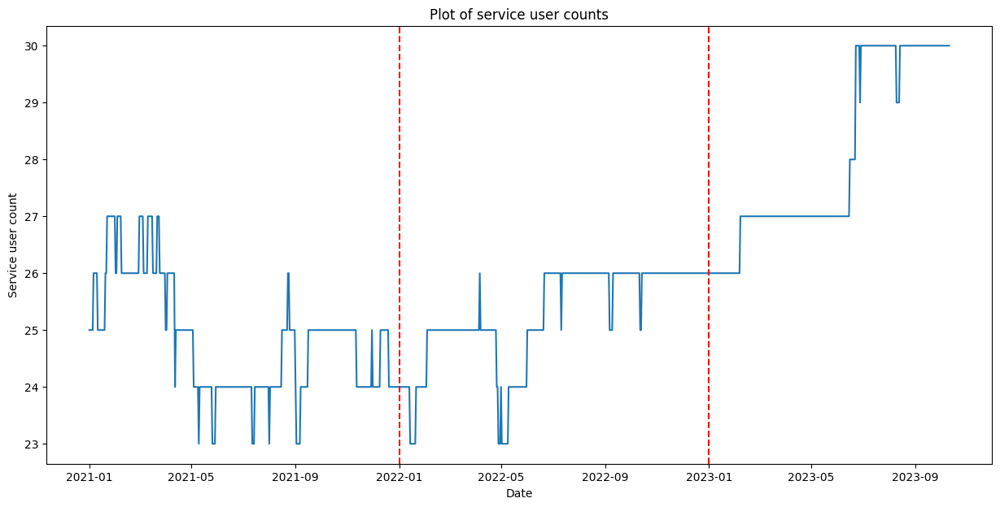

South Parkdale


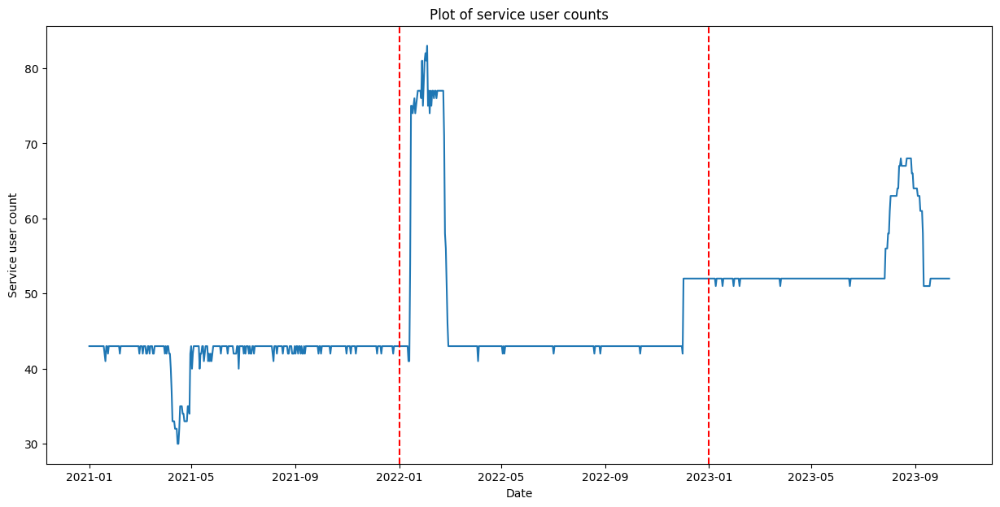

Thistletown-Beaumond Heights


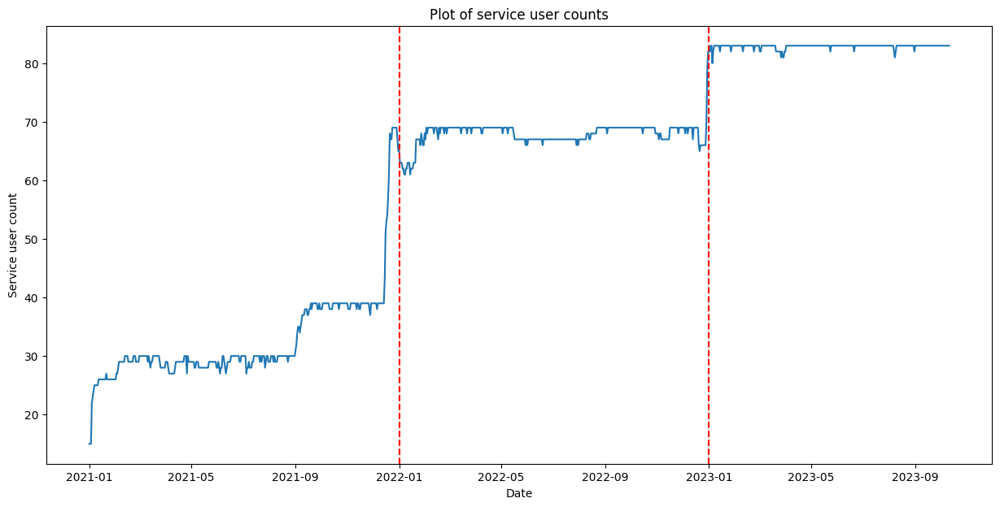

Woburn North


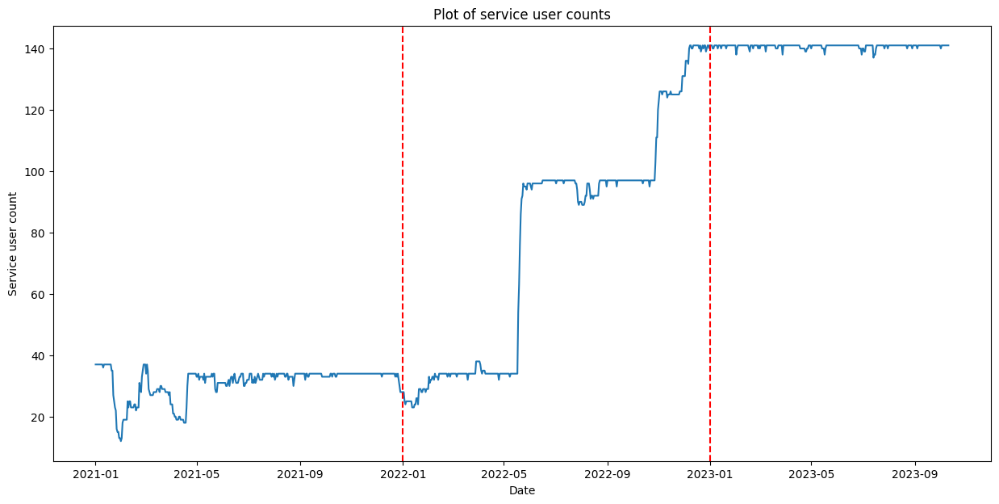

Little Portugal


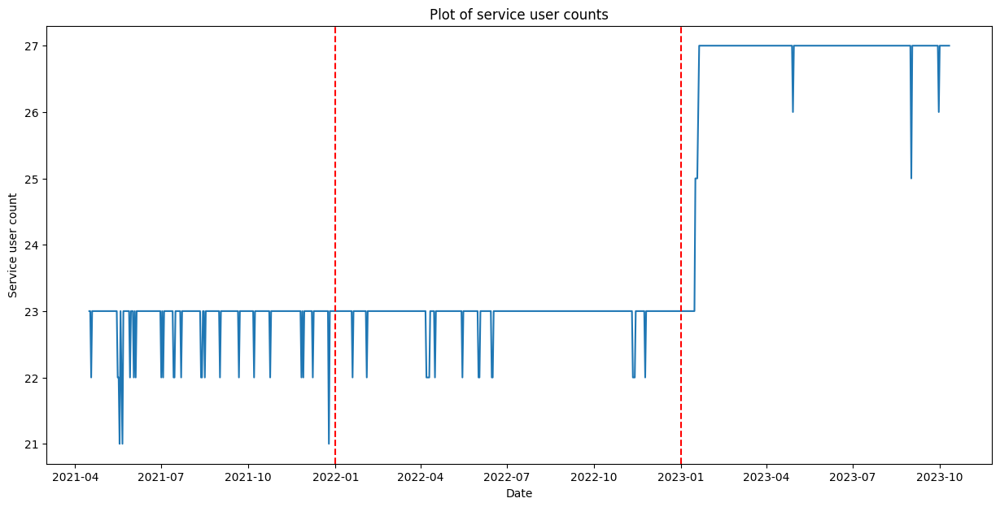

Hillcrest Village


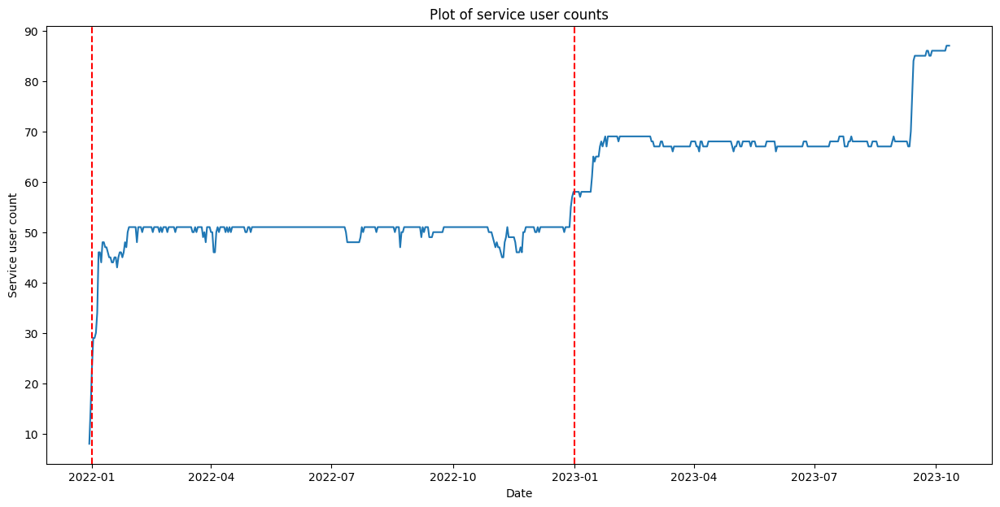

Wexford/Maryvale


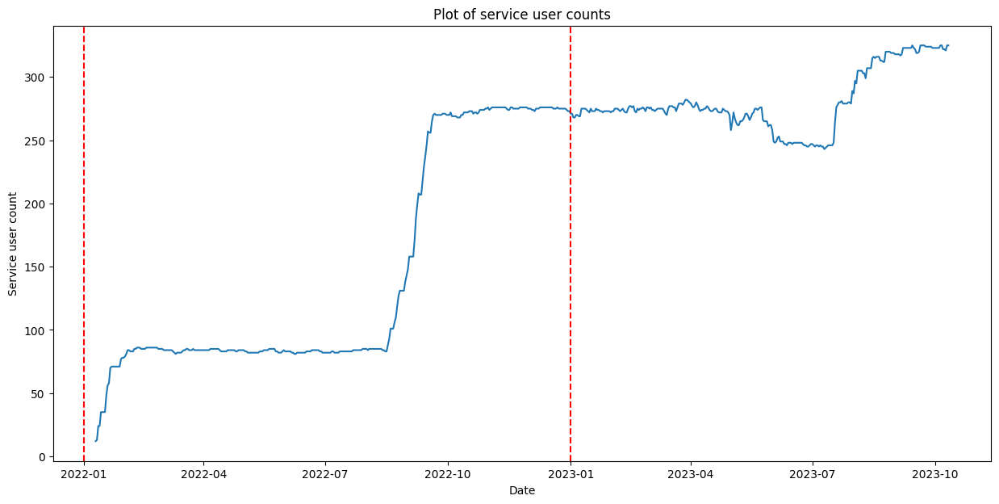

West Humber-Clairville


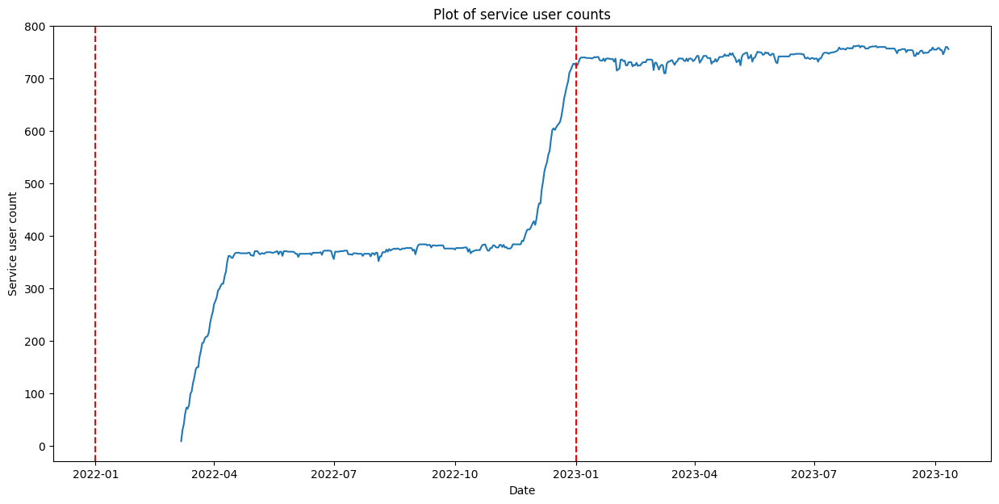

In [148]:
for neighbourhood in neighbourhoods:
    print(neighbourhood)
    dataN, testN, trainN = subsetNeighbourhood(data1_exo, test1, train1, neighbourhood)
    plotData(dataN, testN, trainN)

In [153]:
len(testN["SERVICE_USER_COUNT"])

284

University


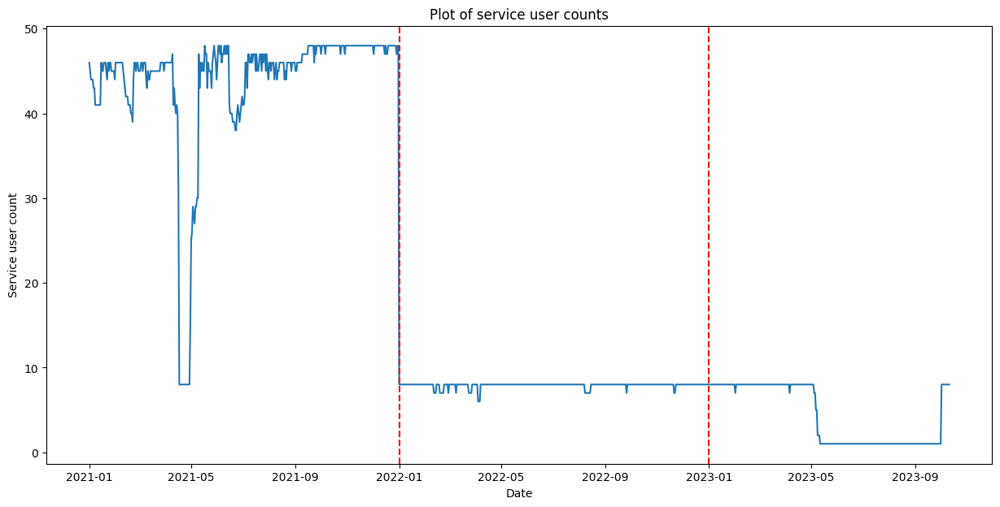

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,2)(2,1,0)[12]          


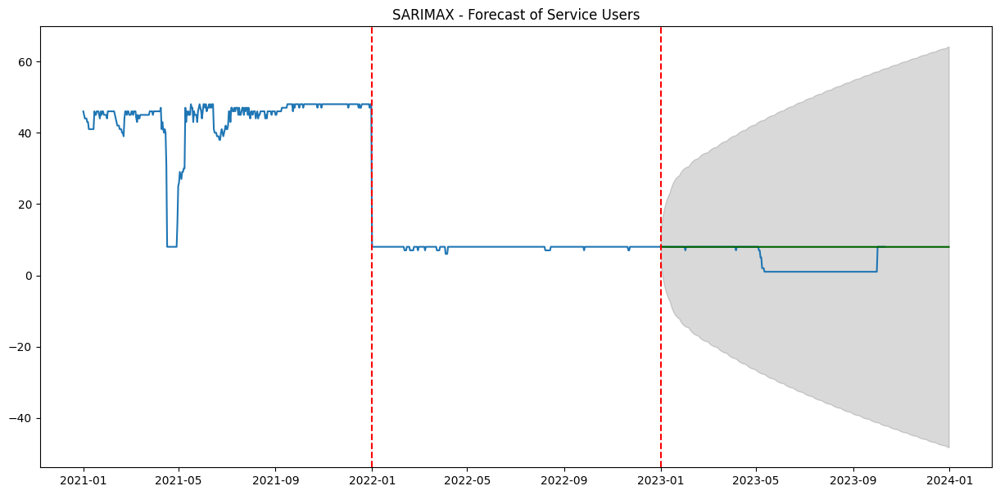

MSE:  24.920800462658757
RMSE:  4.992073763743757
MAE:  3.621389270809865
High Park-Swansea


C:\Users\miche\AppData\Local\Temp\ipykernel_6080\3402357468.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  Eval_values = pd.concat([Eval_values, valueEval])


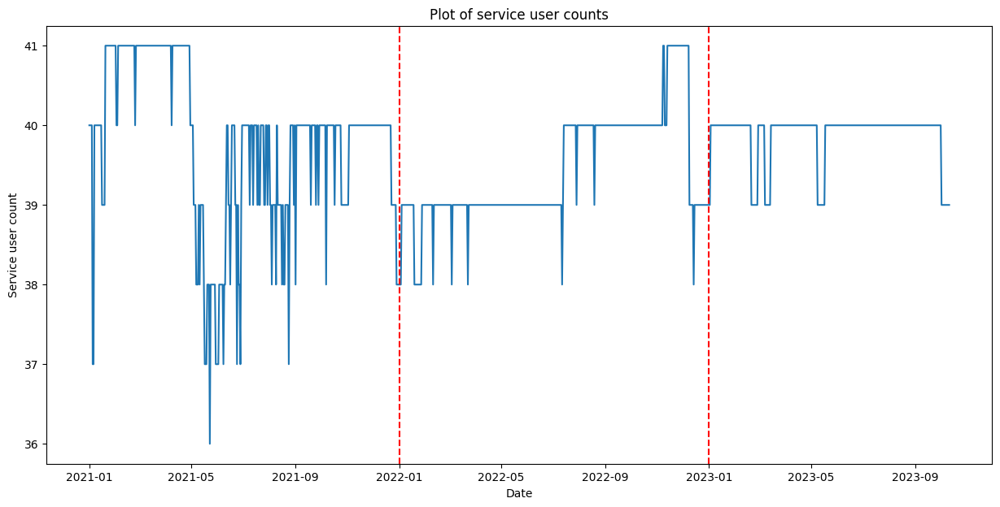

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12]          


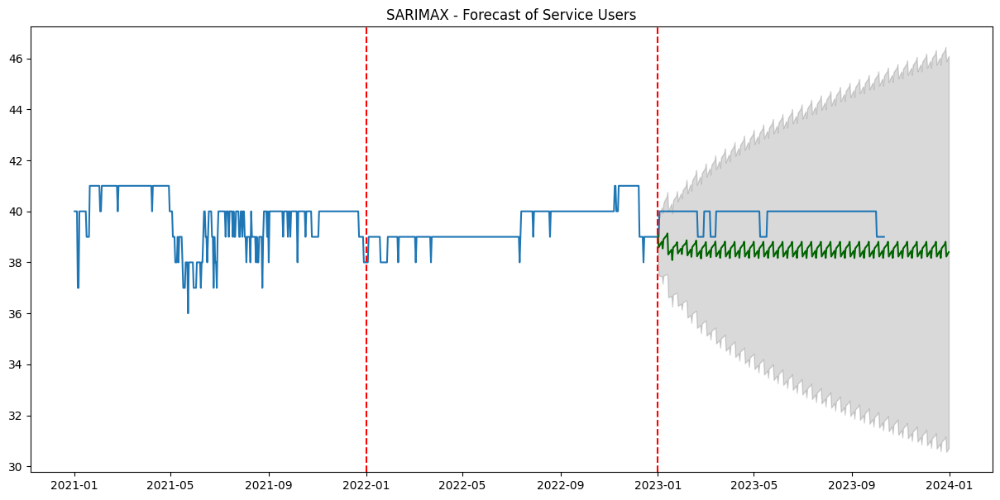

MSE:  2.025324147747874
RMSE:  1.423138836427379
MAE:  1.3679336272463025
Junction-Wallace Emerson


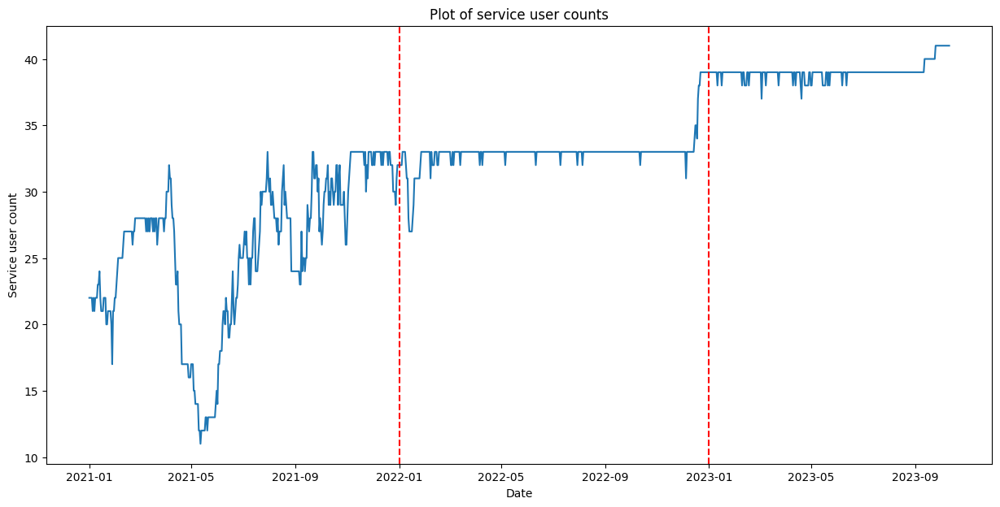

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,2)(2,1,0)[12] intercept


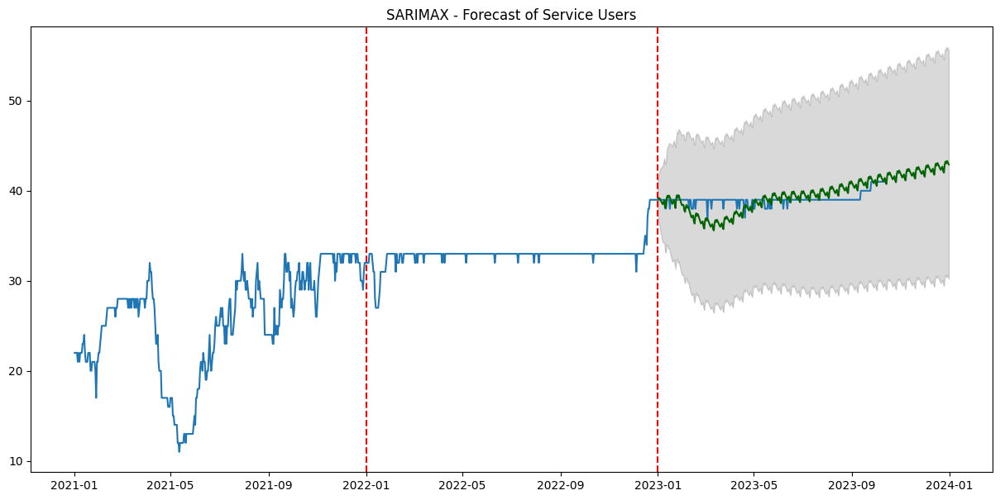

MSE:  1.706358171067989
RMSE:  1.306276452772532
MAE:  1.0226472640520752
Dovercourt Village


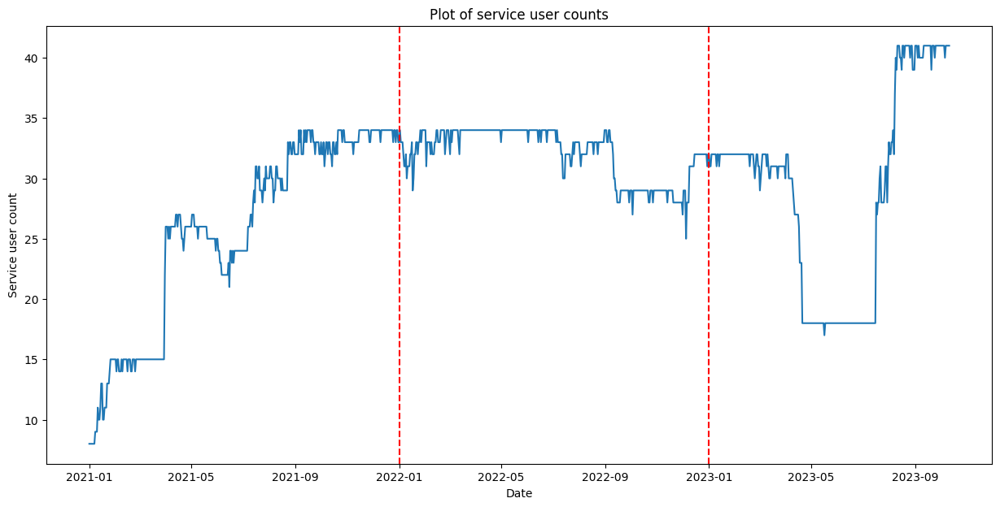

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12]          


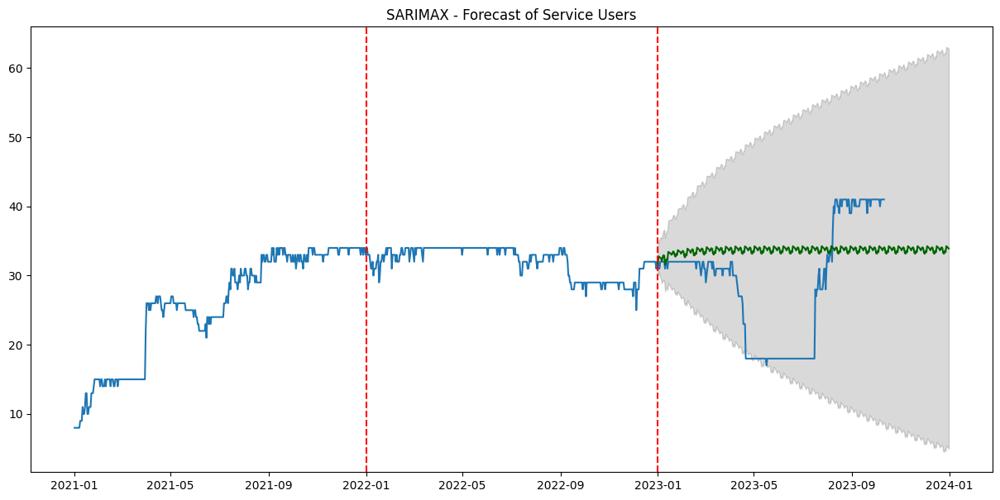

MSE:  92.4339422774444
RMSE:  9.614257240028707
MAE:  7.6298499364496
Annex


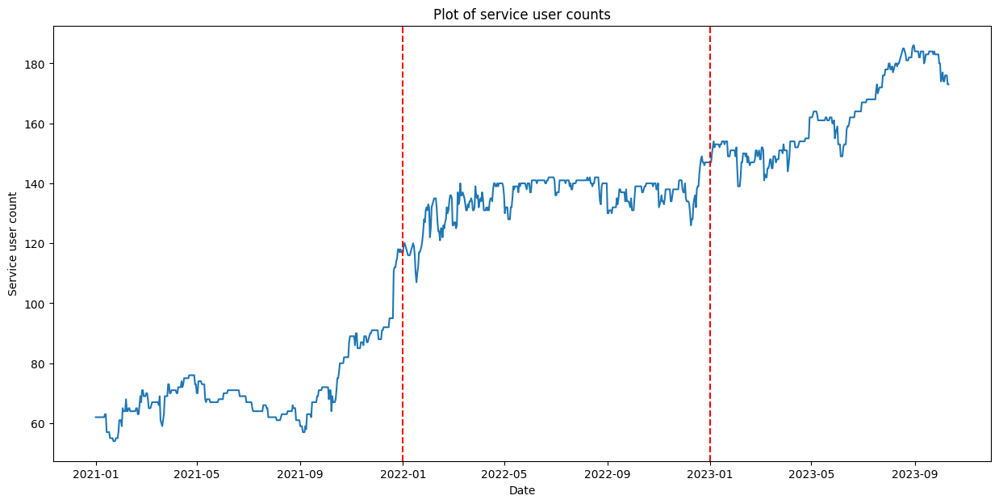

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,0)(2,1,0)[12] intercept


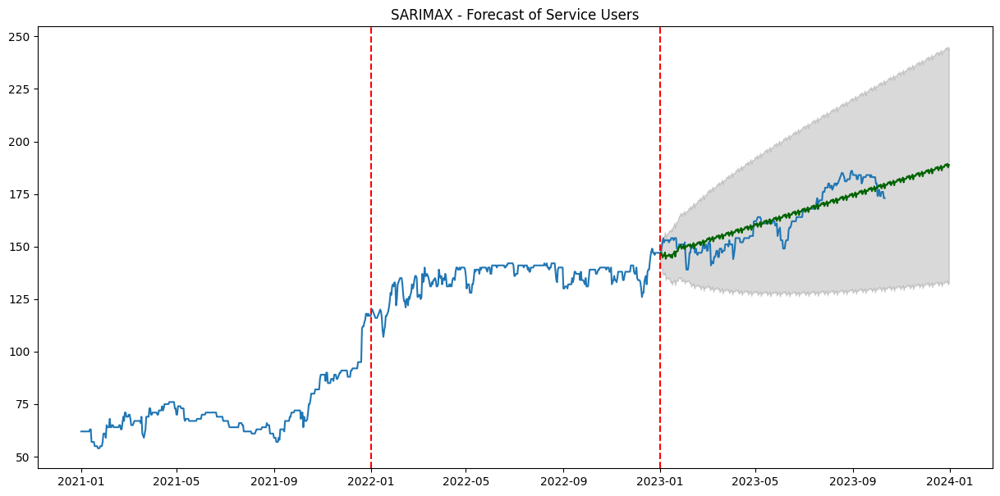

MSE:  39.16337233616495
RMSE:  6.258064583892128
MAE:  5.215893224021603
Bendale-Glen Andrew


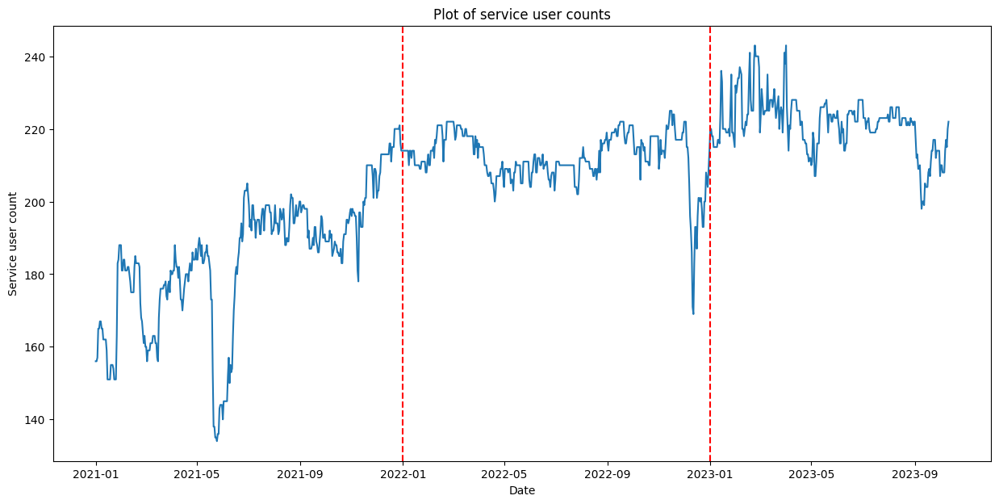

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12] intercept


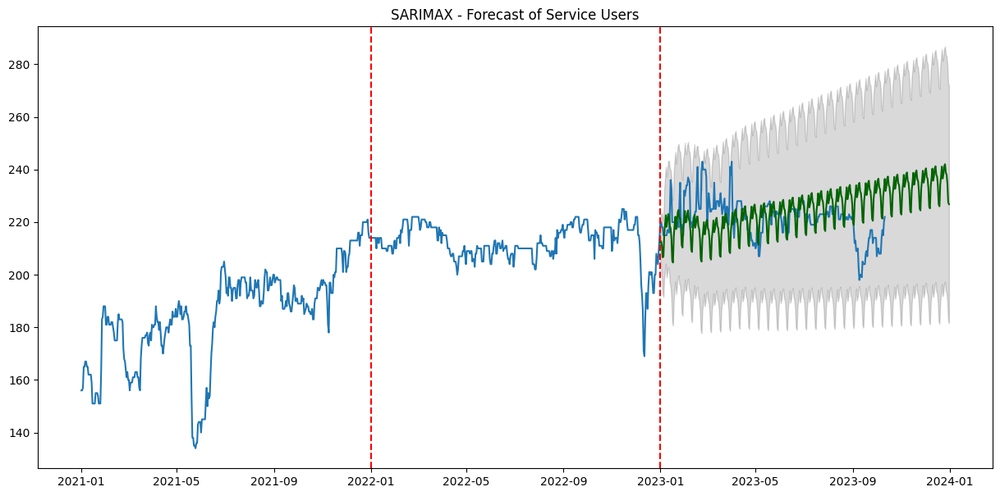

MSE:  143.36907232779646
RMSE:  11.973682488182007
MAE:  9.216240045928448
Regent Park


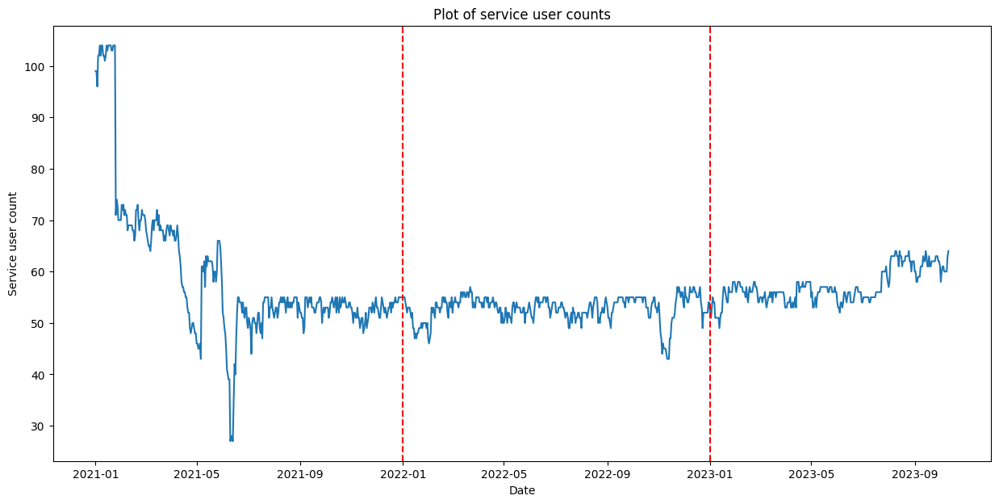

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,3)(2,1,0)[12]          


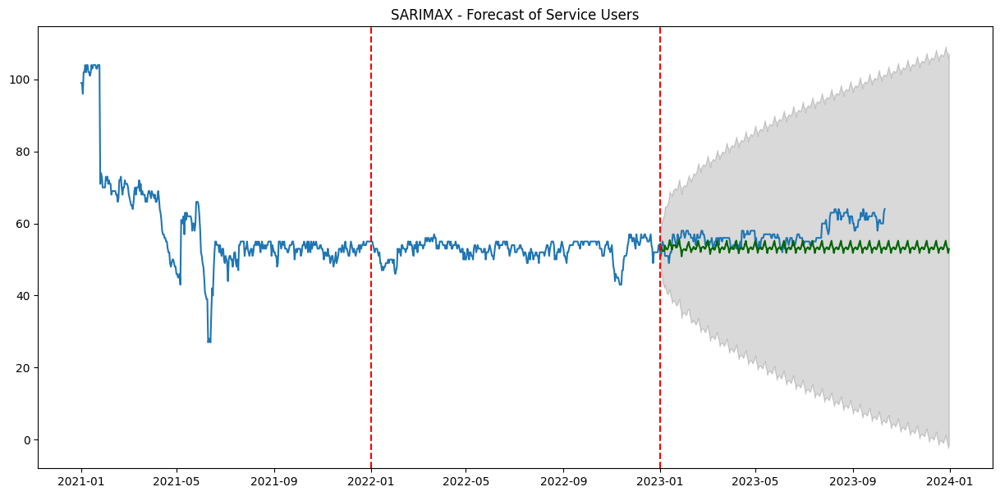

MSE:  24.975446034678512
RMSE:  4.997544000274386
MAE:  4.001442301724592
North Toronto


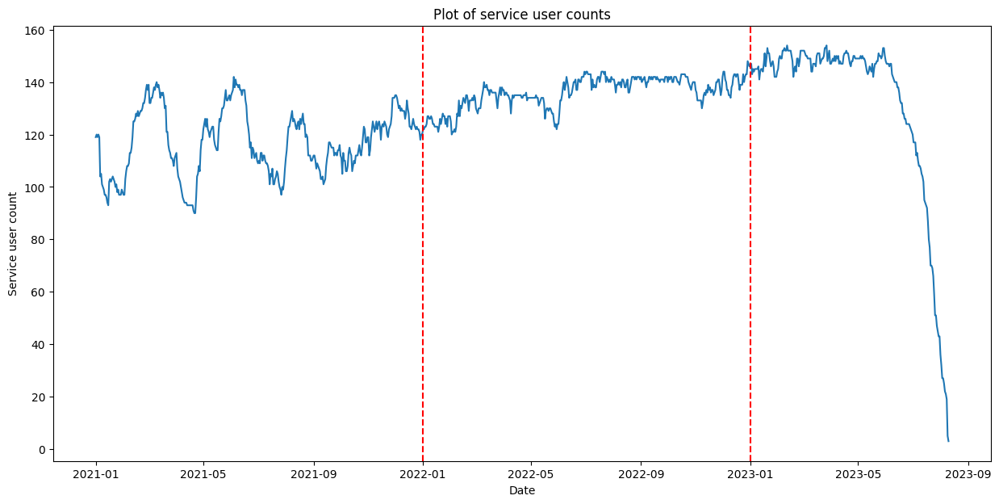

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,0)(2,1,0)[12]          


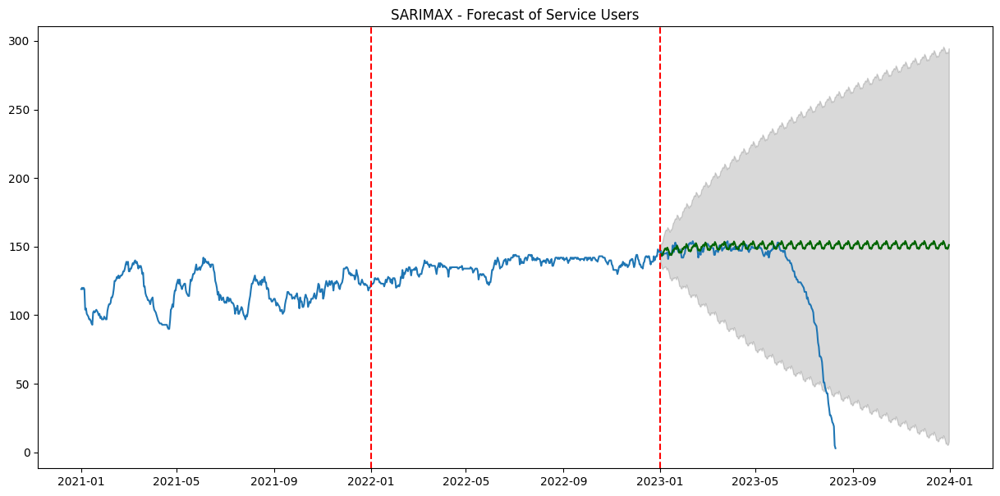

MSE:  1484.2953733829543
RMSE:  38.52655413325923
MAE:  18.96342100754967
West Hill


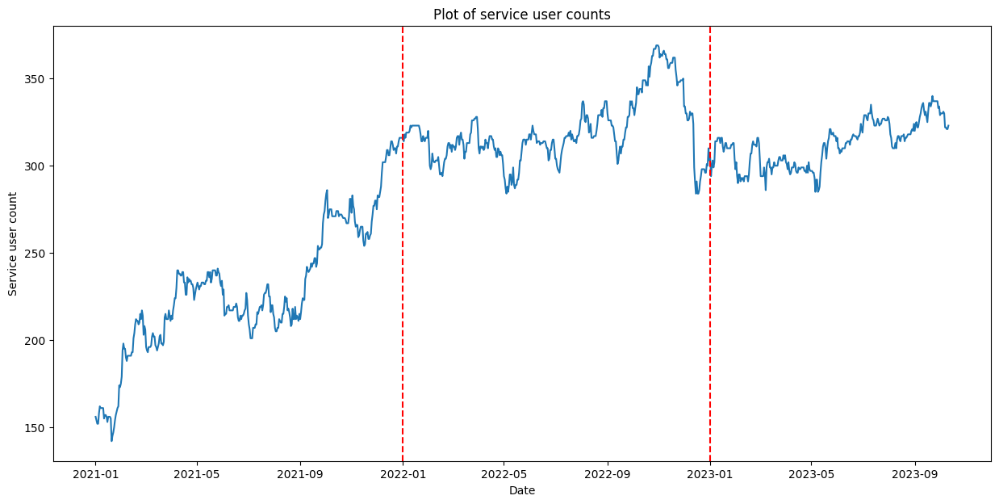

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12] intercept


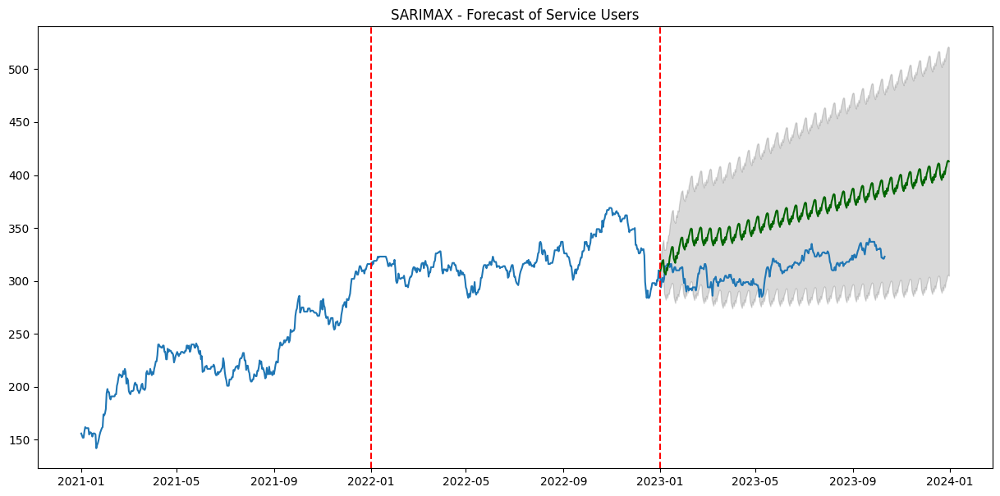

MSE:  2177.045536877142
RMSE:  46.65882056886074
MAE:  44.400979526109204
West Queen West


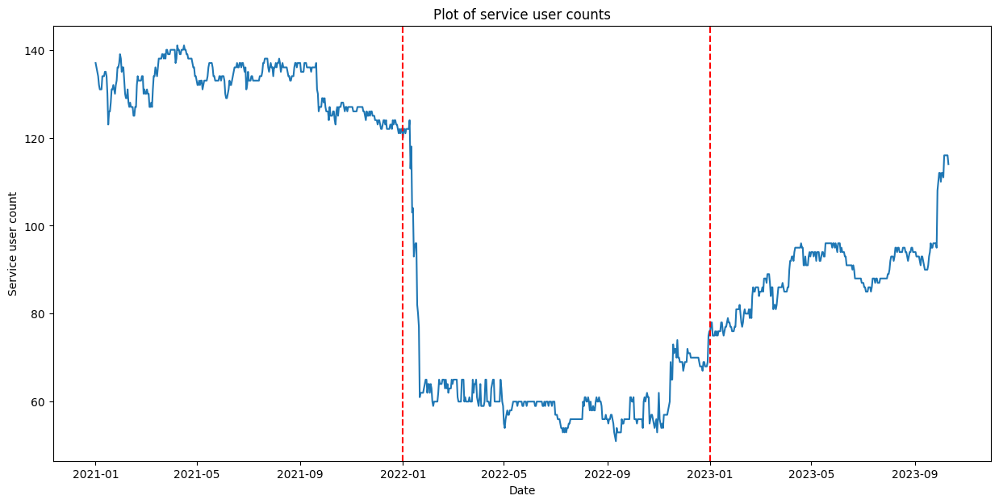

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,1)(2,1,0)[12]          


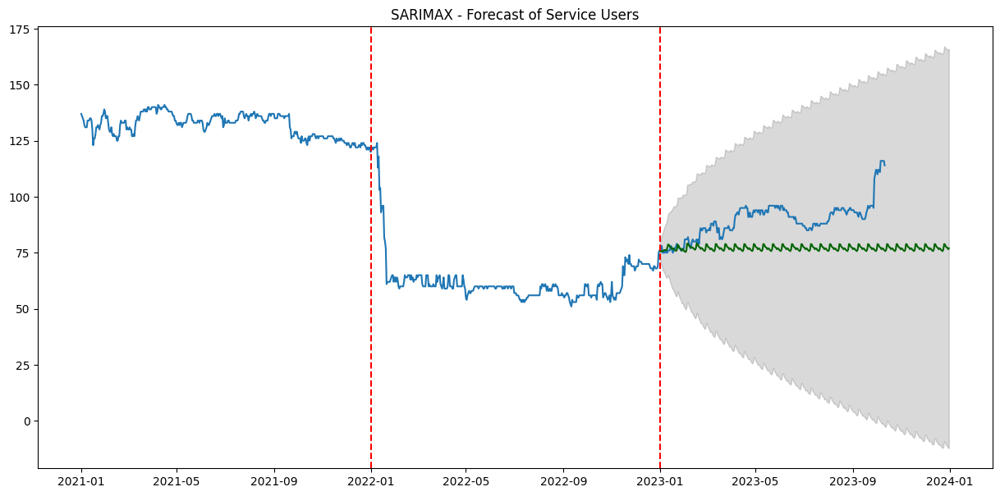

MSE:  221.94652789427496
RMSE:  14.897869911308629
MAE:  12.65856134078047
Moss Park


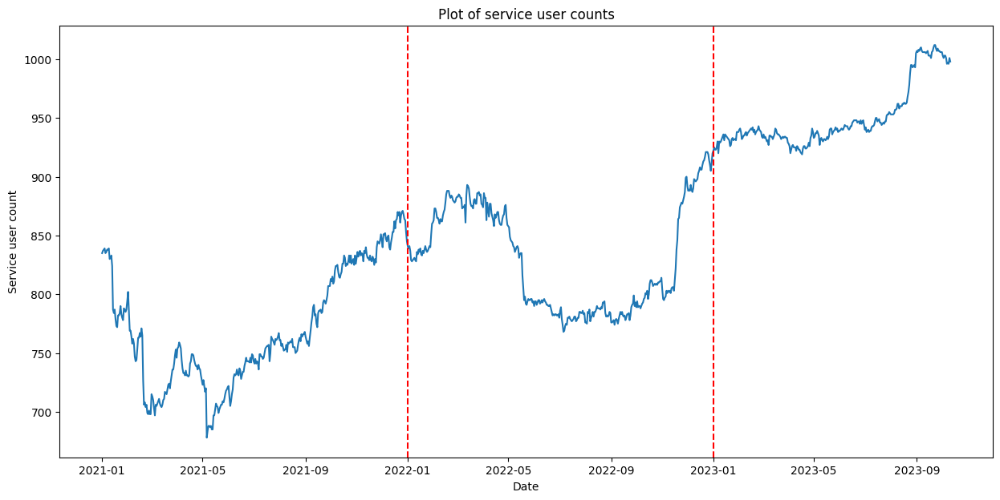

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(2,1,0)[12]          


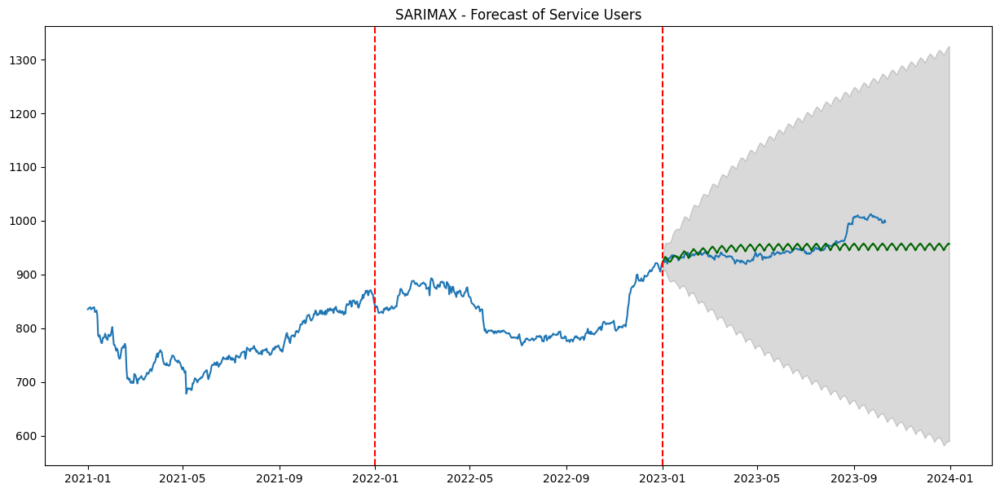

MSE:  611.2491507410243
RMSE:  24.72345345498934
MAE:  17.83068982752754
Scarborough Village


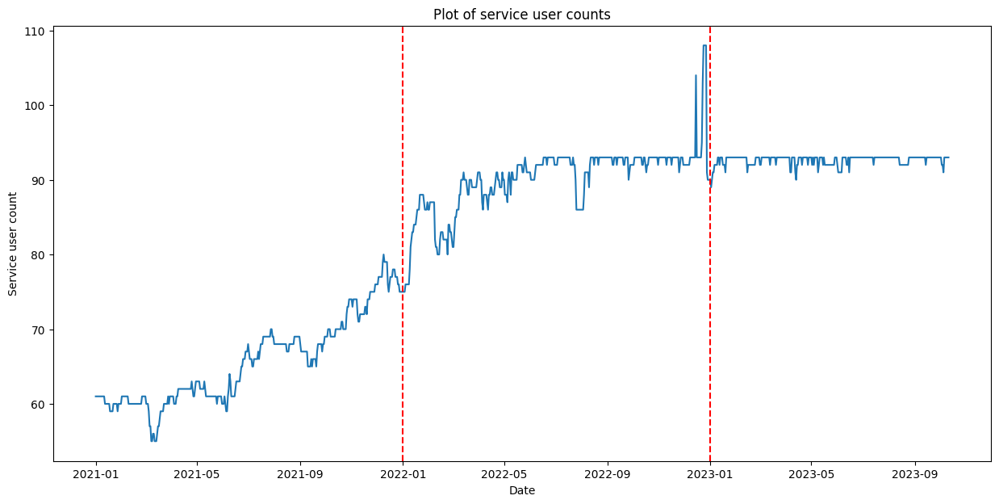

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(2,1,1)[12] intercept


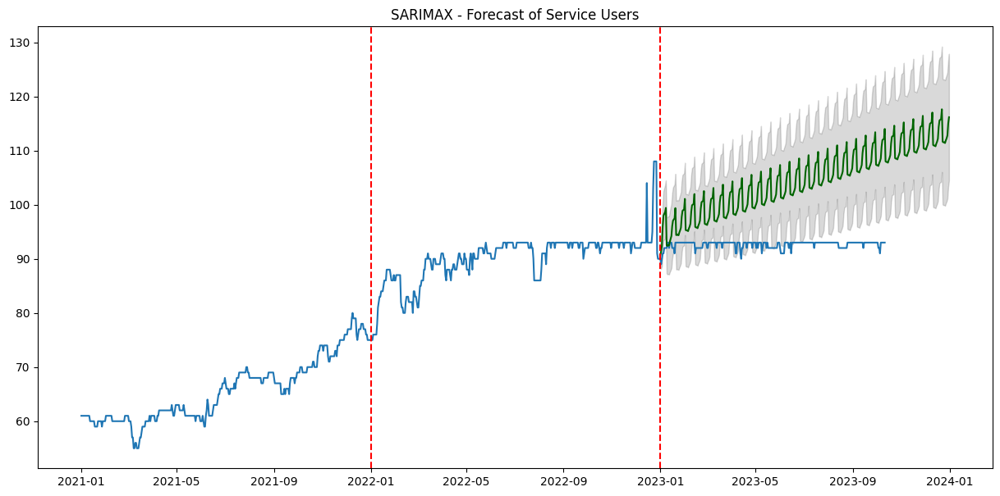

MSE:  121.75254885848297
RMSE:  11.034153744555265
MAE:  9.962600775523413
Junction Area


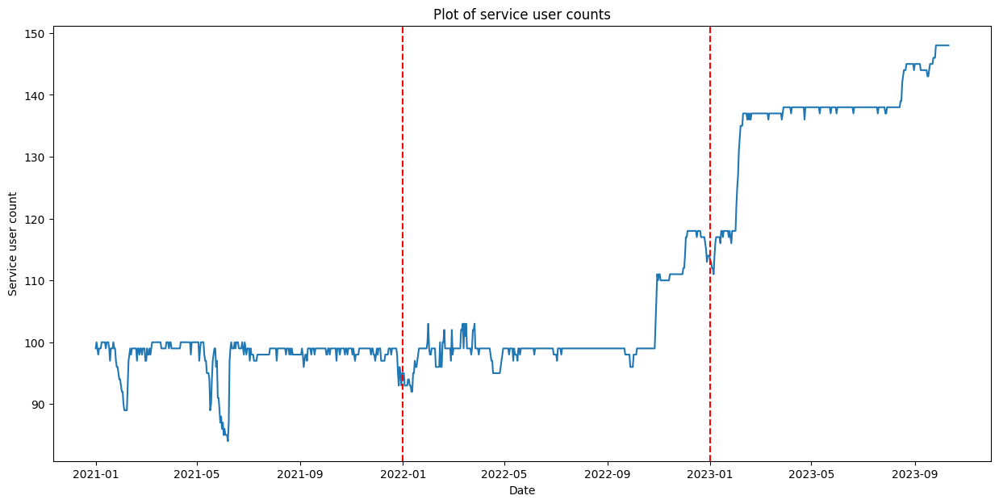

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,0)(2,1,0)[12]          


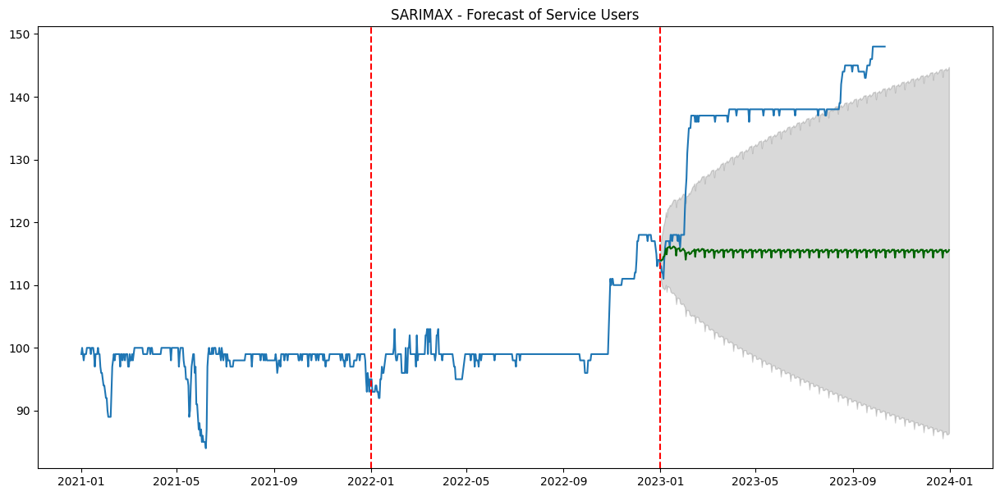

MSE:  518.1776074100283
RMSE:  22.76351482987696
MAE:  21.396068893902747
Wellington Place


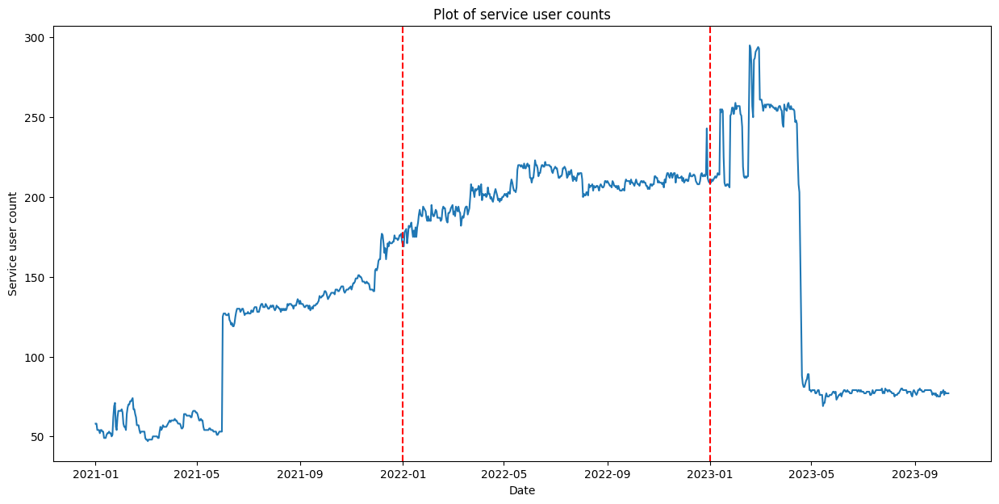

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,0)(2,1,0)[12] intercept


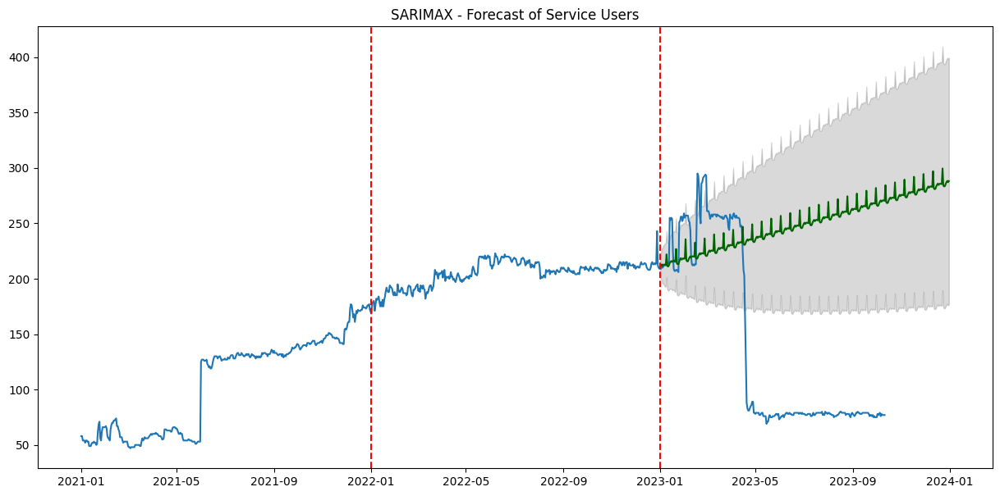

MSE:  19410.57139776504
RMSE:  139.32182670983408
MAE:  118.62339662224868
Kensington-Chinatown


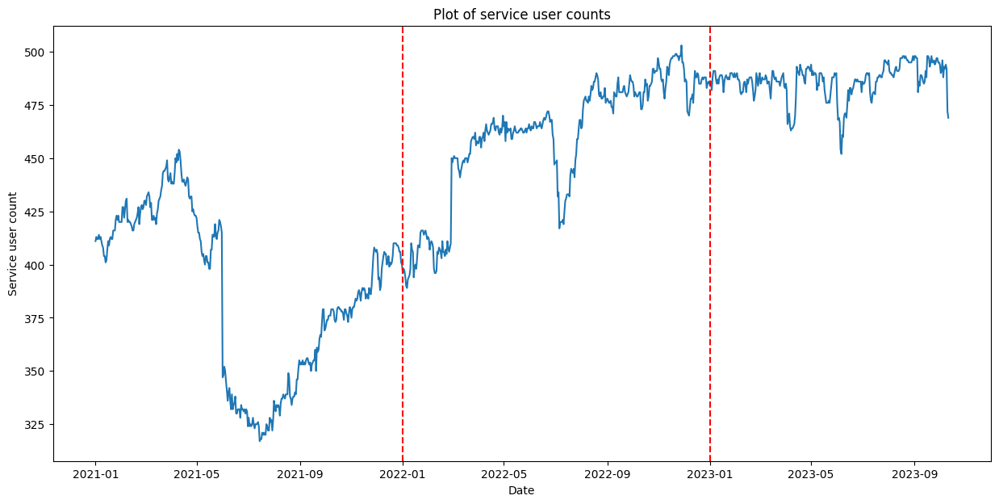

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,0)(2,1,0)[12]          


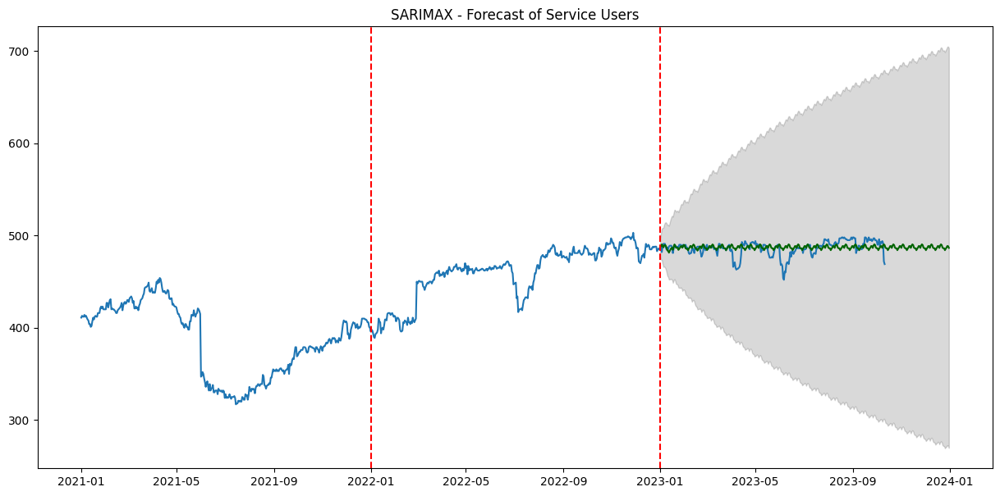

MSE:  67.13282480507391
RMSE:  8.193462320965045
MAE:  5.712852901096741
Oakwood Village


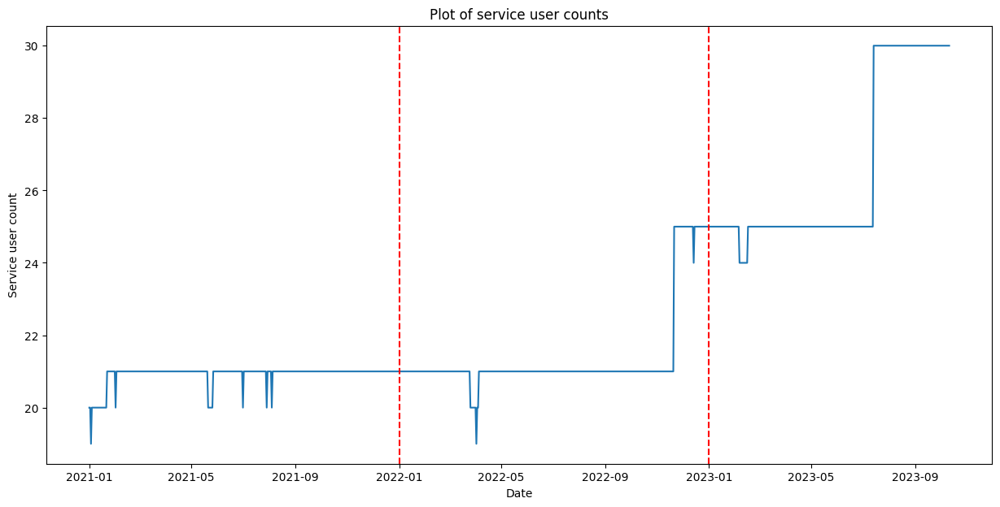

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(1,1,2)[12]          


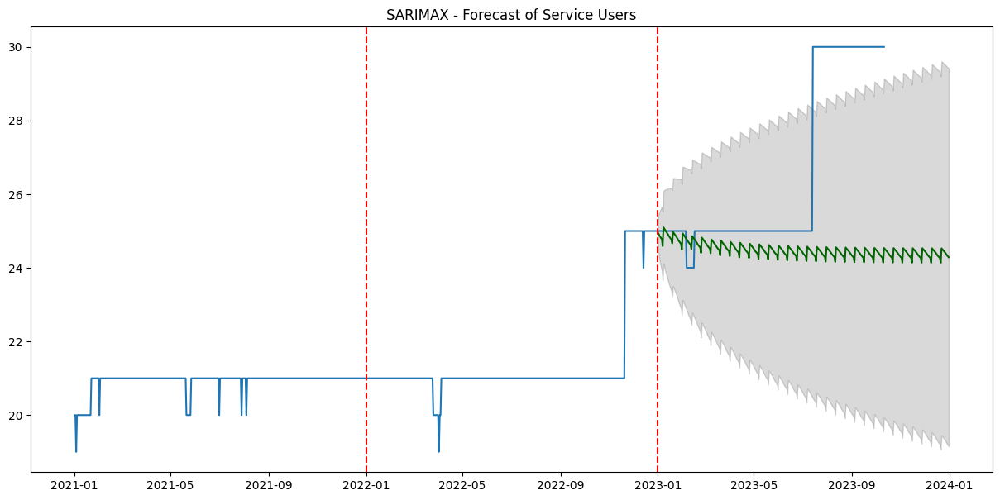

MSE:  10.124327598616873
RMSE:  3.1818748559012926
MAE:  2.075921966716365
Downtown Yonge East


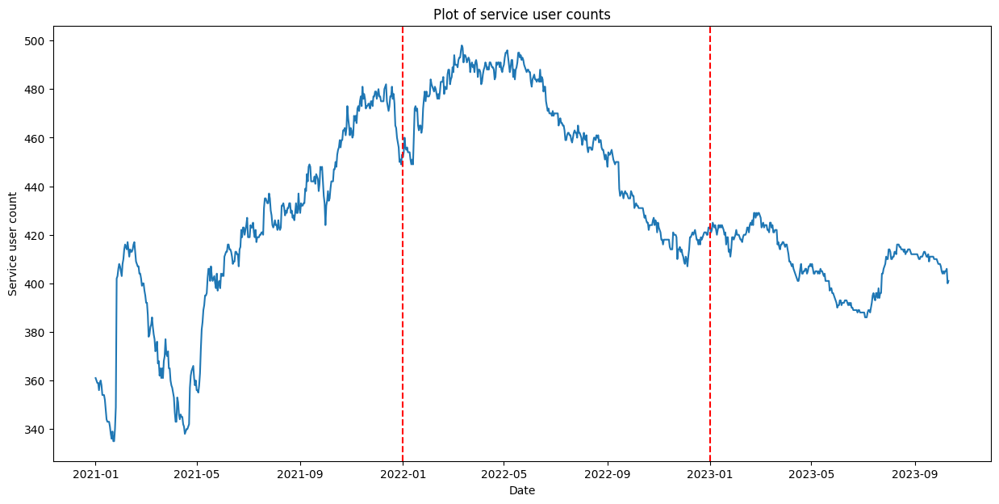

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,0)(2,1,0)[12]          


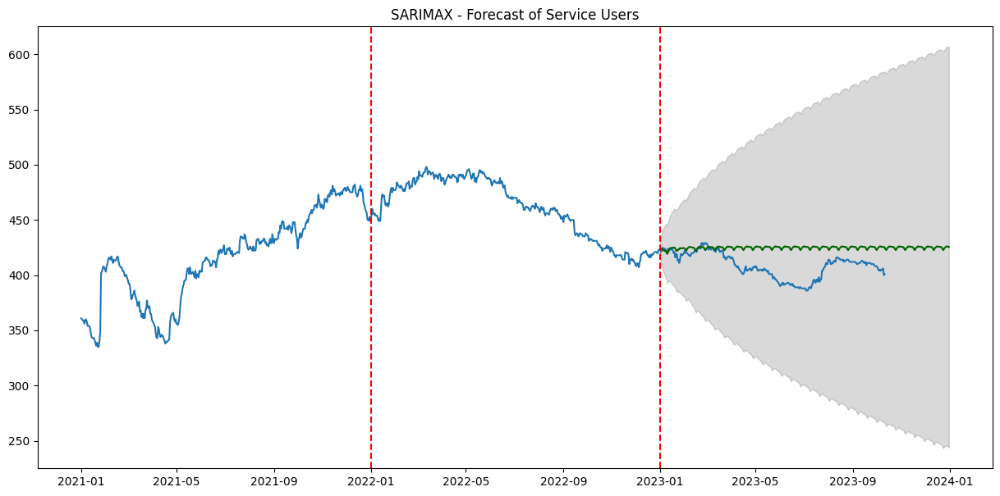

MSE:  386.53989124318343
RMSE:  19.66061777369123
MAE:  16.141252524419542
St Lawrence-East Bayfront-The Islands


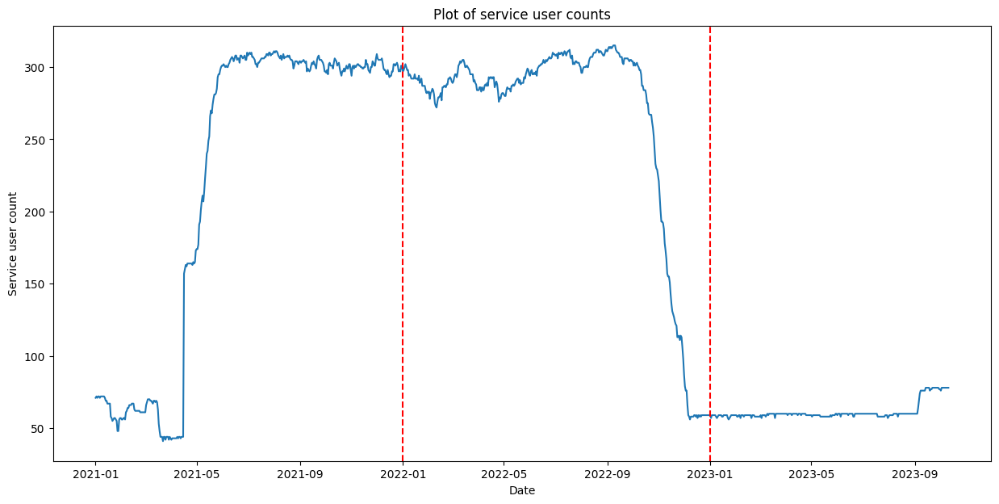

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12]          


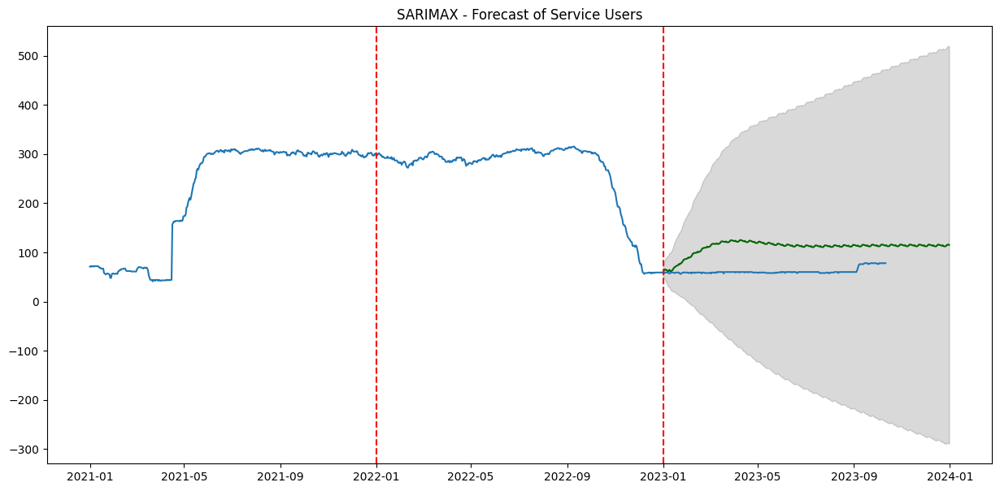

MSE:  2557.7331608222885
RMSE:  50.57403642999329
MAE:  48.22656354987787
East End-Danforth


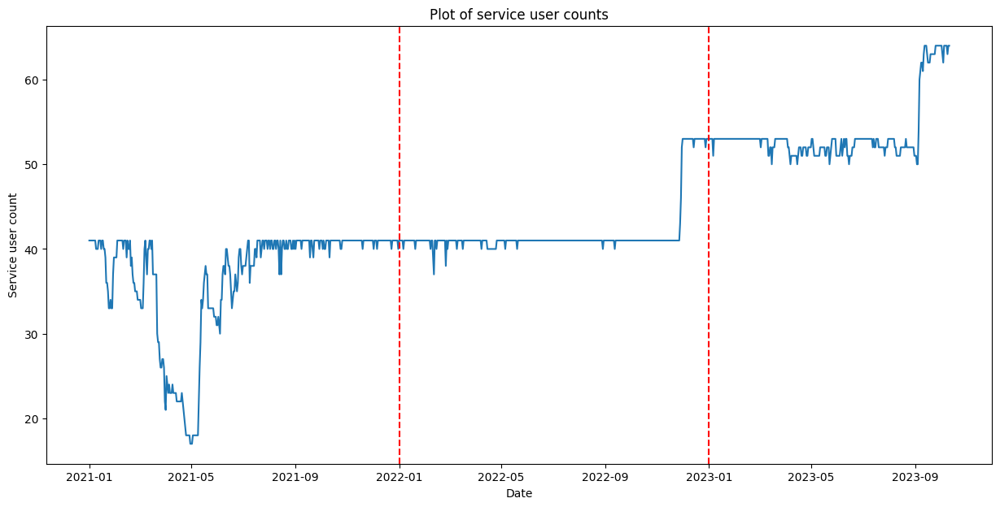

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12] intercept


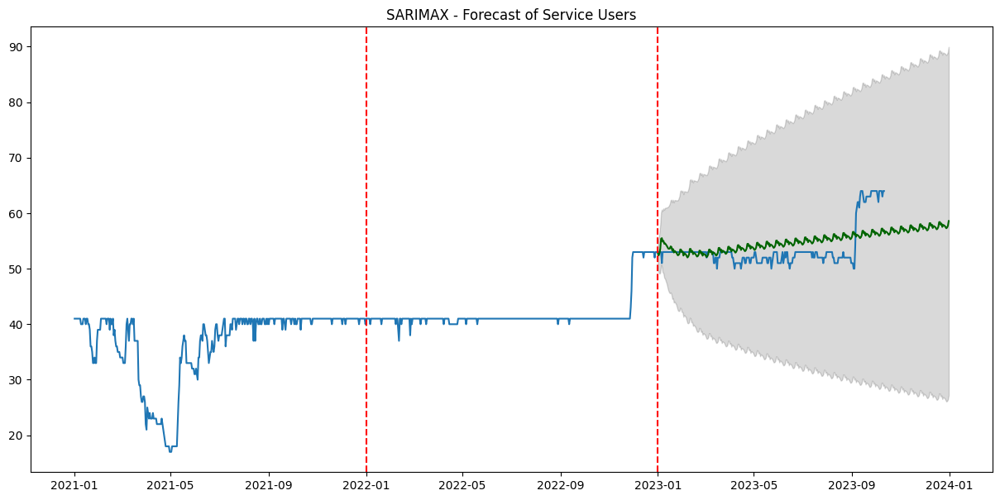

MSE:  11.143983694046172
RMSE:  3.3382605791109494
MAE:  2.593230492583137
Yonge-Bay Corridor


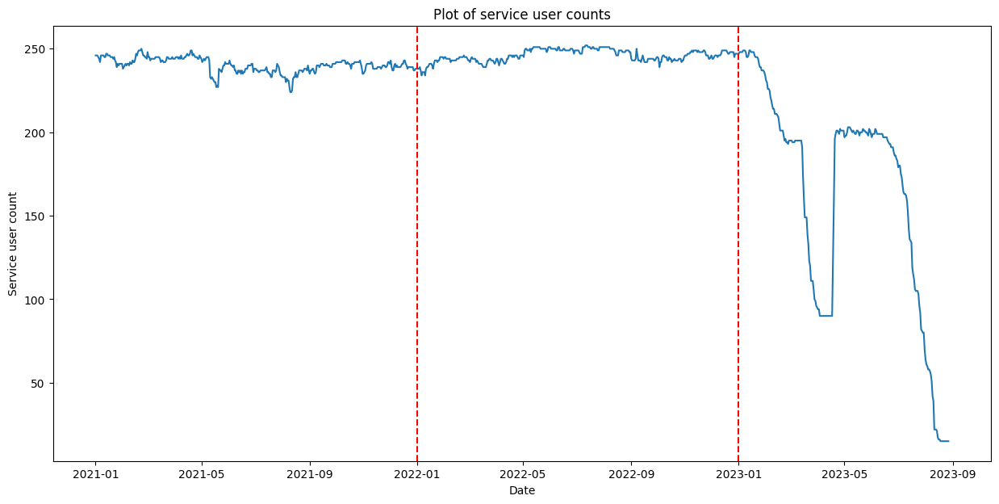

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,0)(2,1,0)[12]          


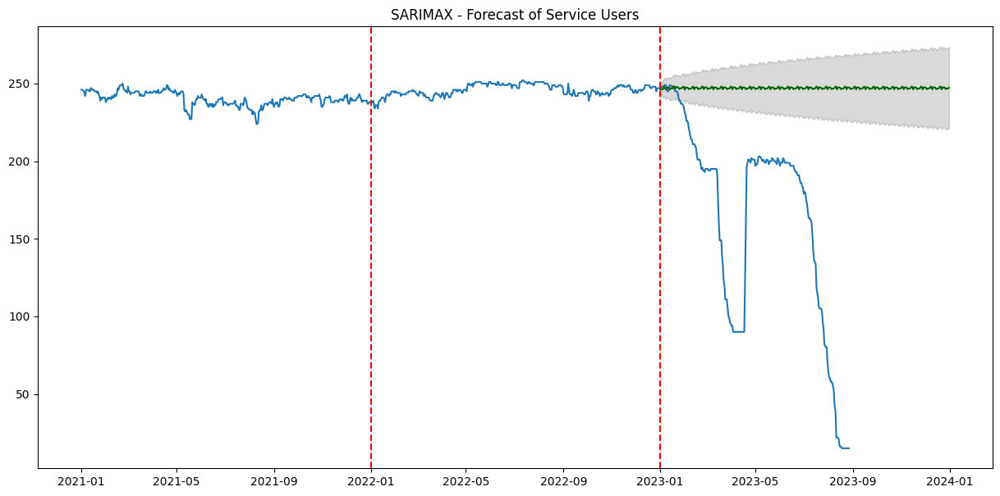

MSE:  11321.699470542882
RMSE:  106.4034748988156
MAE:  83.31224676292165
North St.James Town


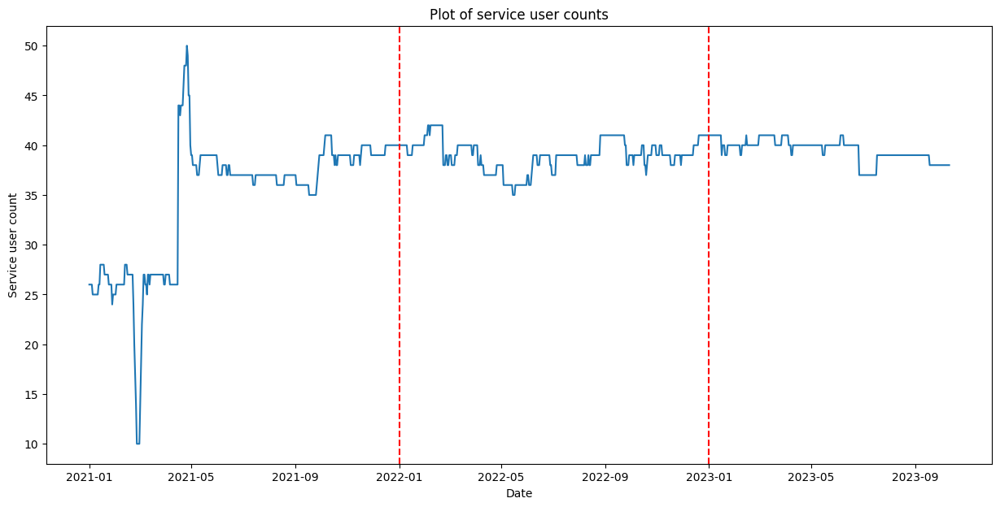

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,3)(2,1,0)[12]          


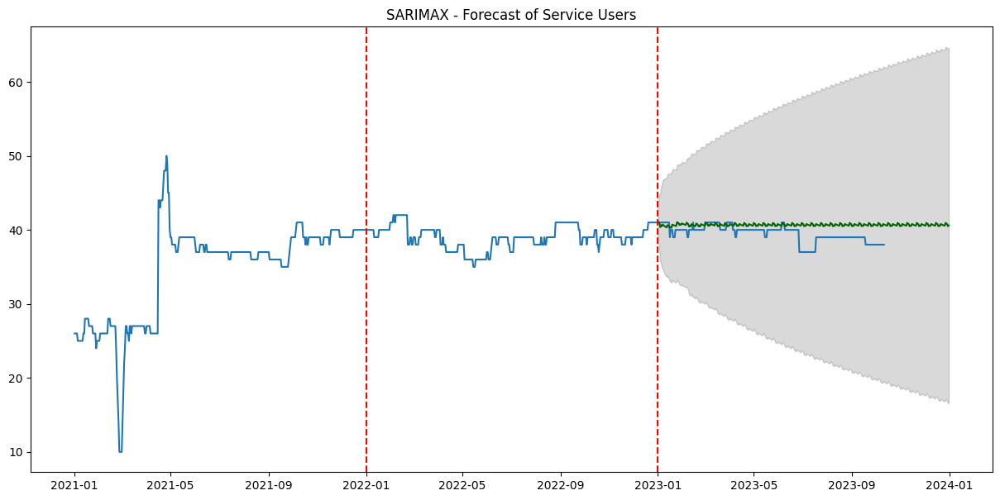

MSE:  2.5609398769943805
RMSE:  1.6002936846074163
MAE:  1.2688377356424207
Church-Wellesley


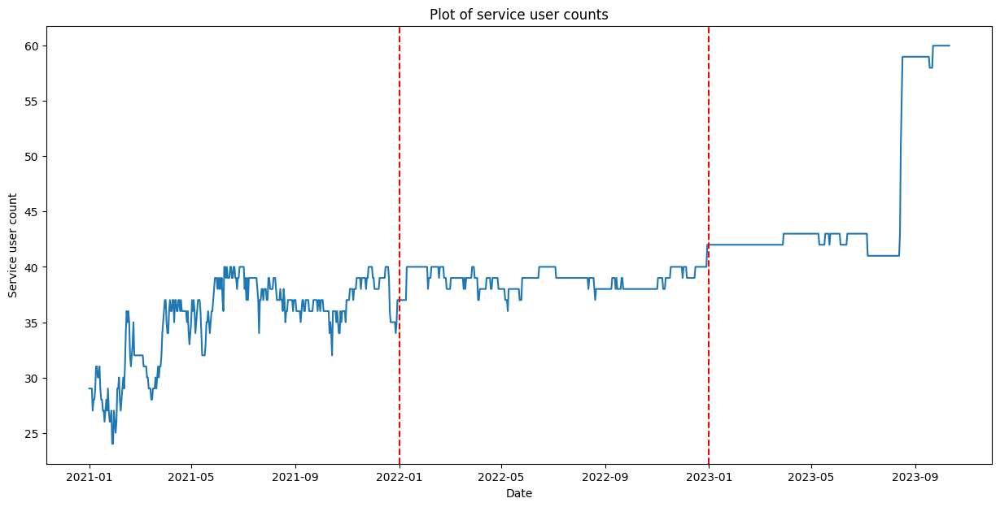

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,0)(2,1,0)[12]          


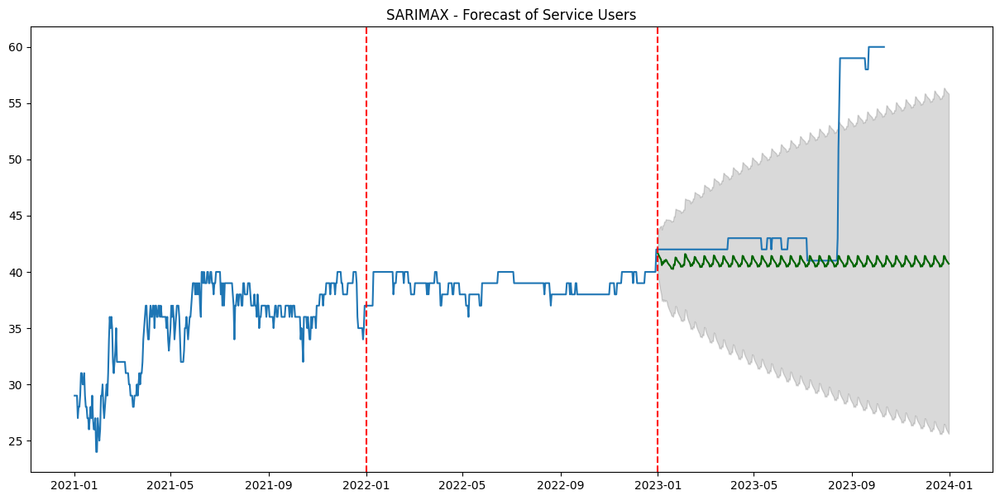

MSE:  69.9901893041678
RMSE:  8.36601394357957
MAE:  4.8039888277998255
Yorkdale-Glen Park


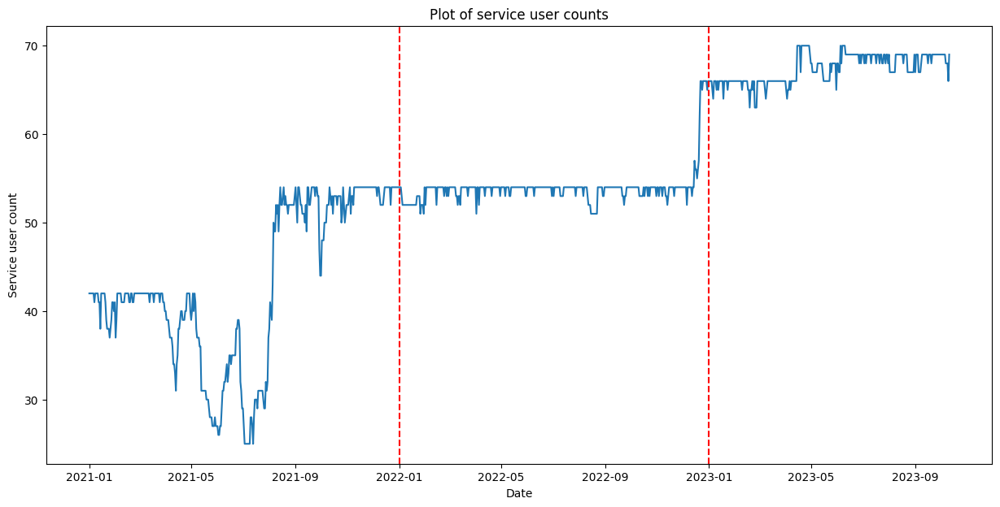

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12]          


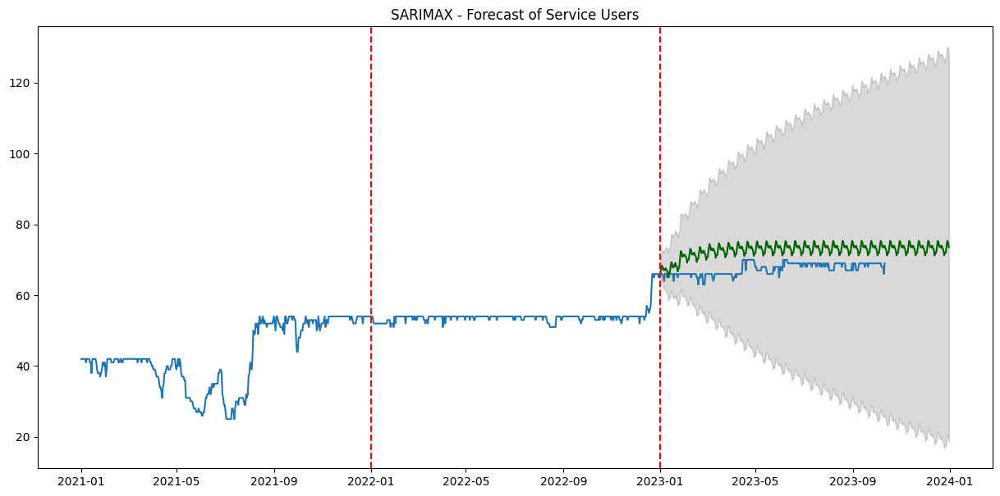

MSE:  29.814445937423777
RMSE:  5.4602606107606055
MAE:  5.1102801110049
Fort York-Liberty Village


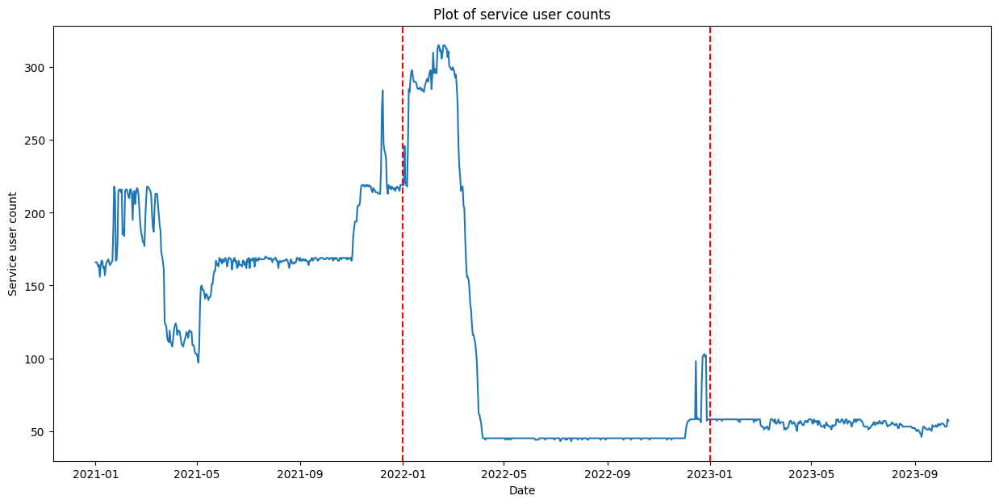

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,0)(2,1,0)[12]          


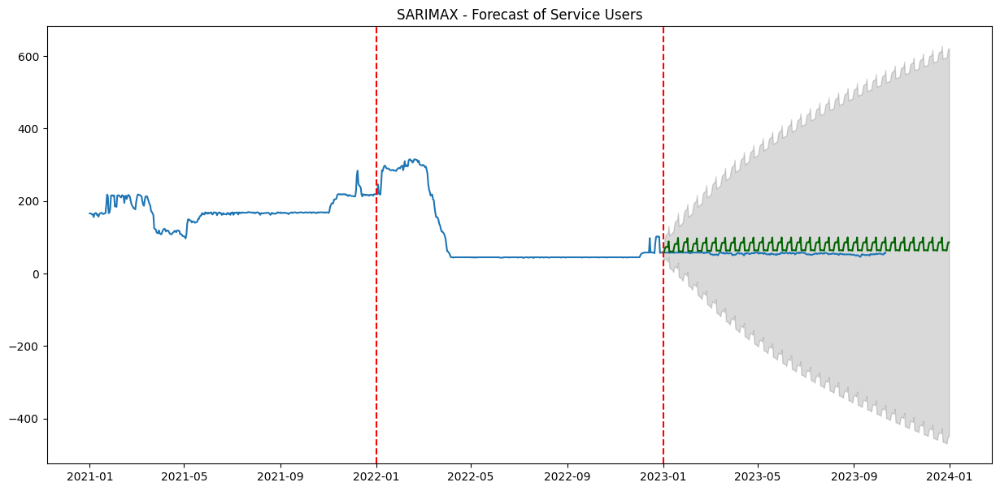

MSE:  551.3568273108239
RMSE:  23.48098863572026
MAE:  19.63482195116703
Kennedy Park


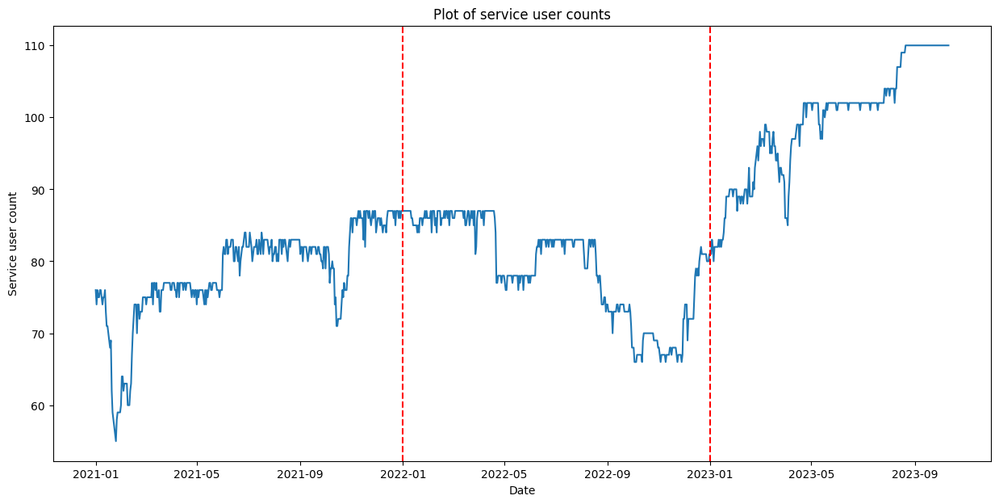

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,1)(2,1,0)[12]          


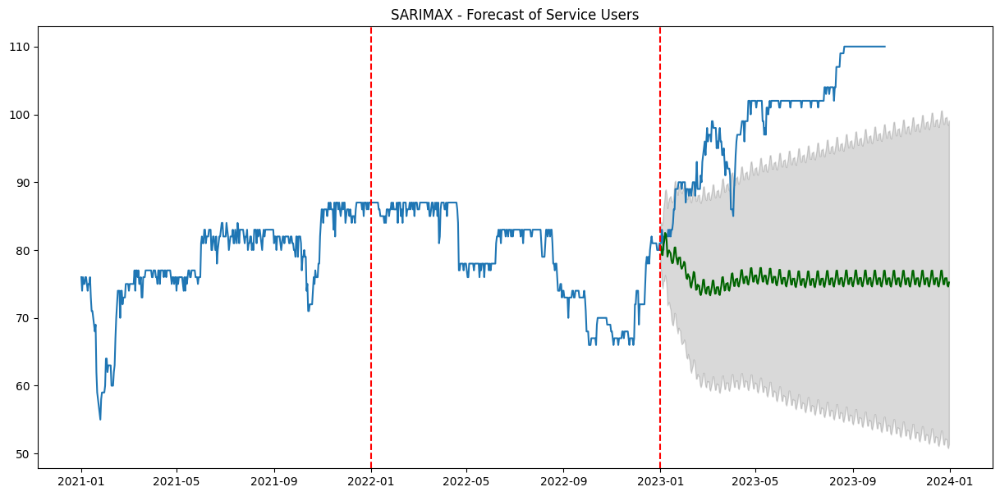

MSE:  629.0821725722891
RMSE:  25.081510571978896
MAE:  23.521049413484754
Harbourfront-CityPlace


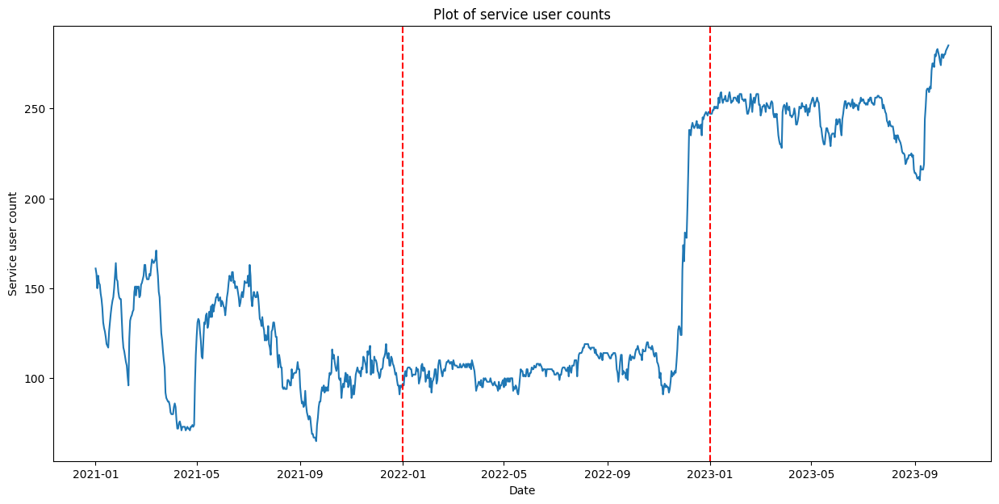

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12]          


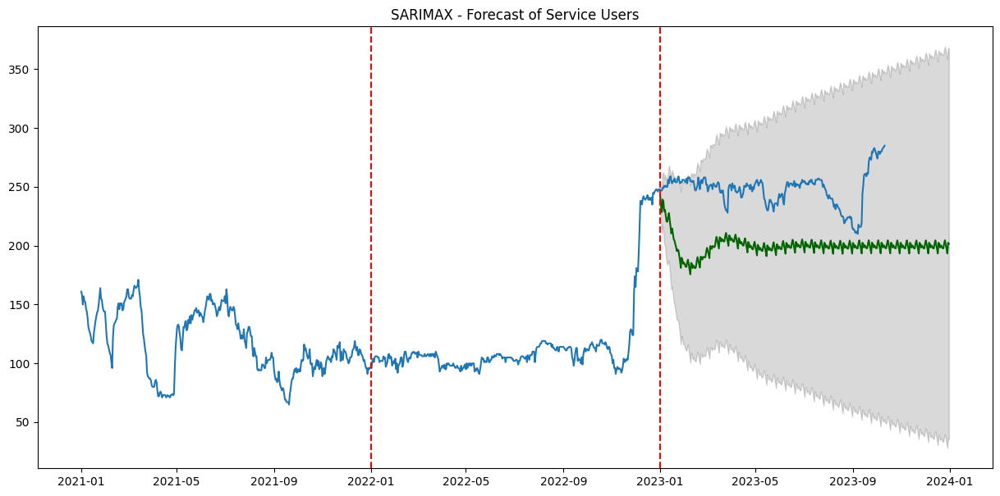

MSE:  2636.989373938877
RMSE:  51.35162484224698
MAE:  48.375288247832
Caledonia-Fairbank


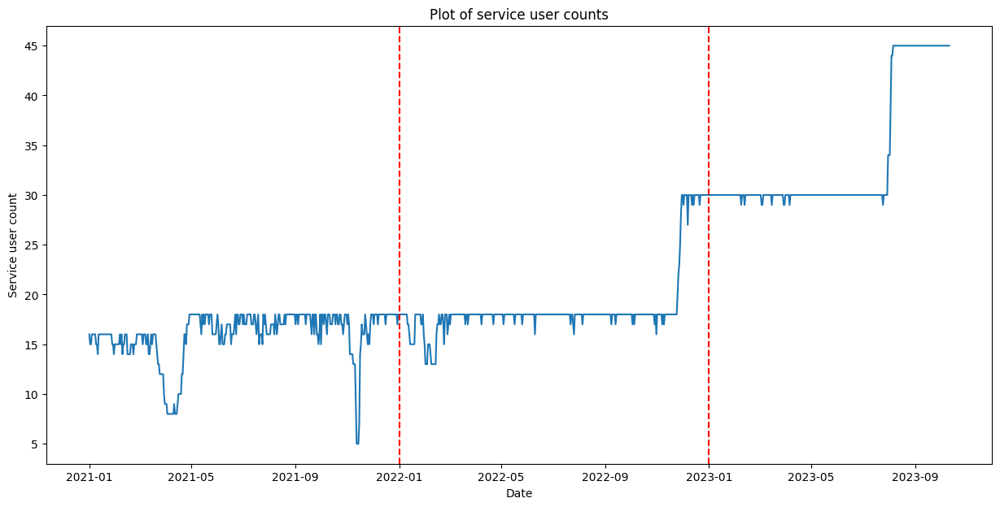

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,1)(2,1,0)[12]          


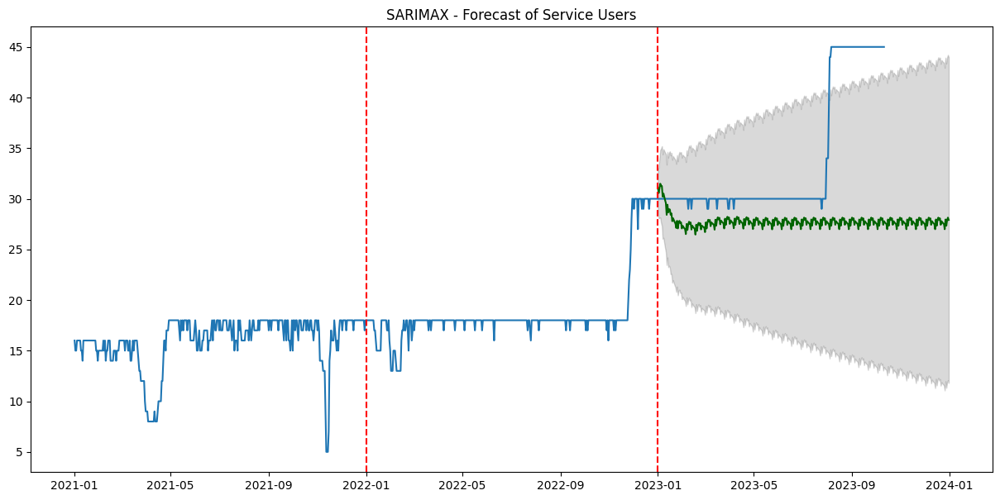

MSE:  77.31642881159658
RMSE:  8.792976106620362
MAE:  5.949109057149671
Broadview North


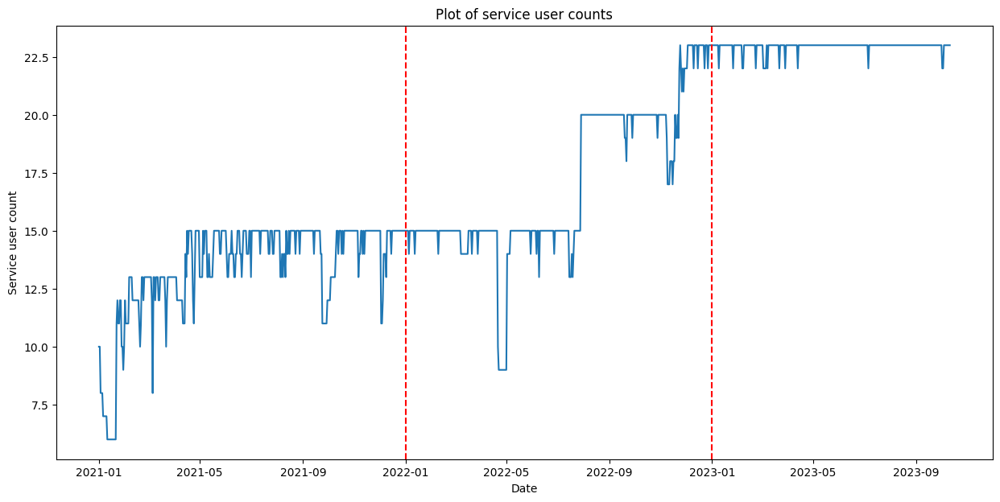

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12] intercept


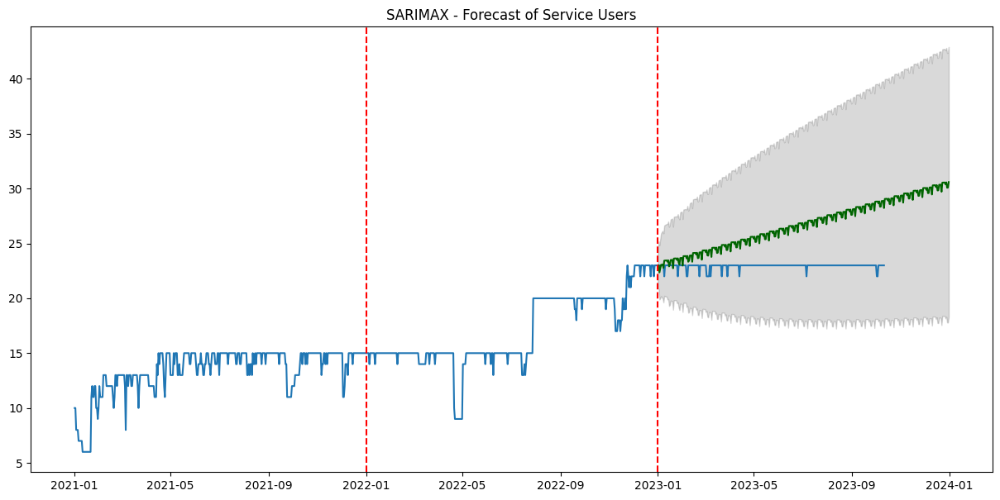

MSE:  11.527077269884655
RMSE:  3.3951549699365207
MAE:  2.955415284169727
Rosedale-Moore Park


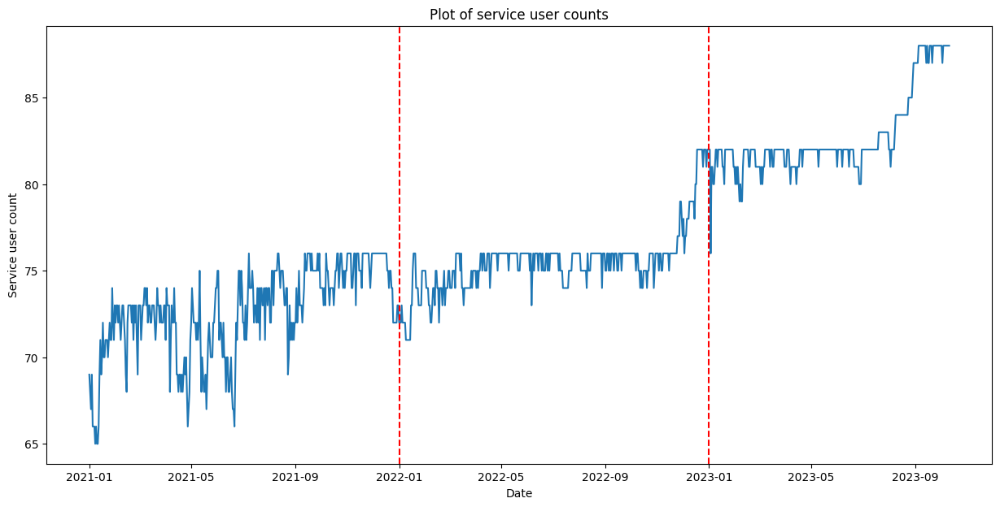

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,2)(2,1,0)[12] intercept


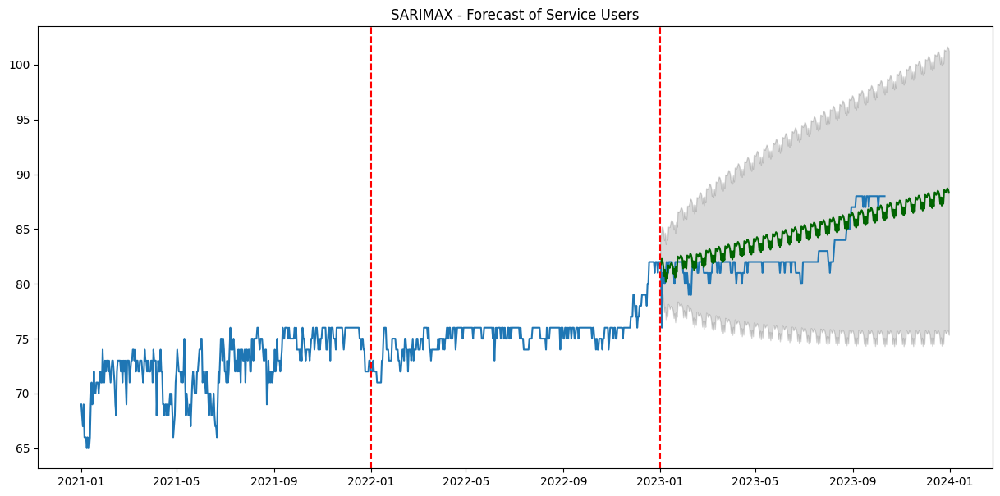

MSE:  4.393970479189031
RMSE:  2.0961799729958854
MAE:  1.8057457822431822
Wychwood


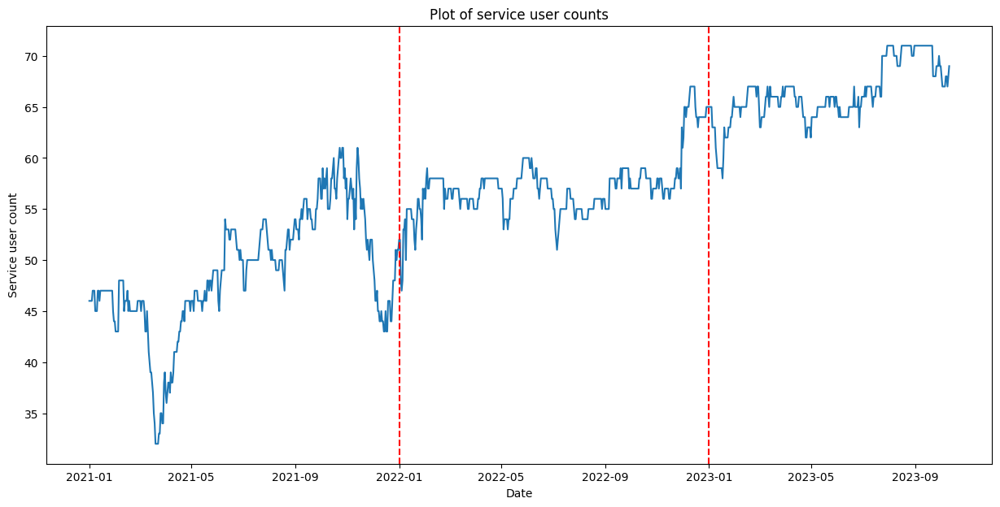

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(2,1,0)[12]          


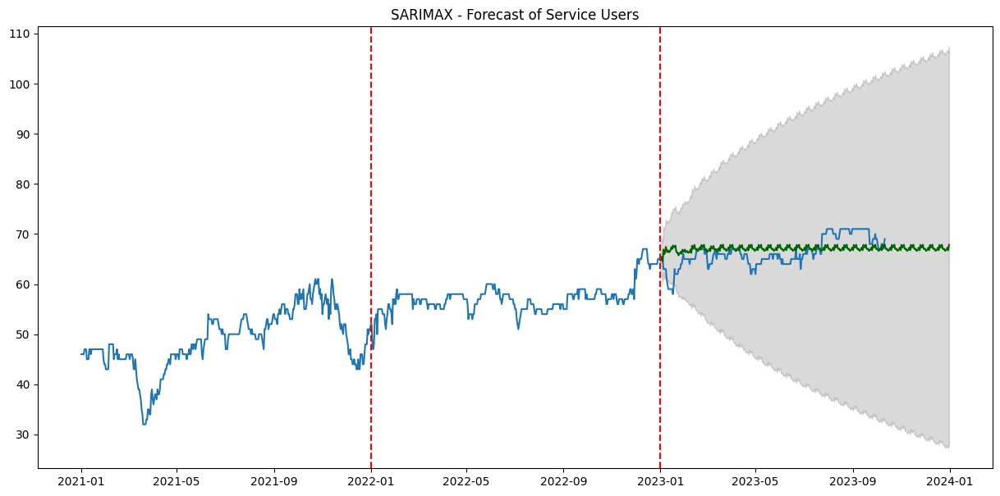

MSE:  8.207051688156163
RMSE:  2.864795226217079
MAE:  2.30812407683314
Palmerston-Little Italy


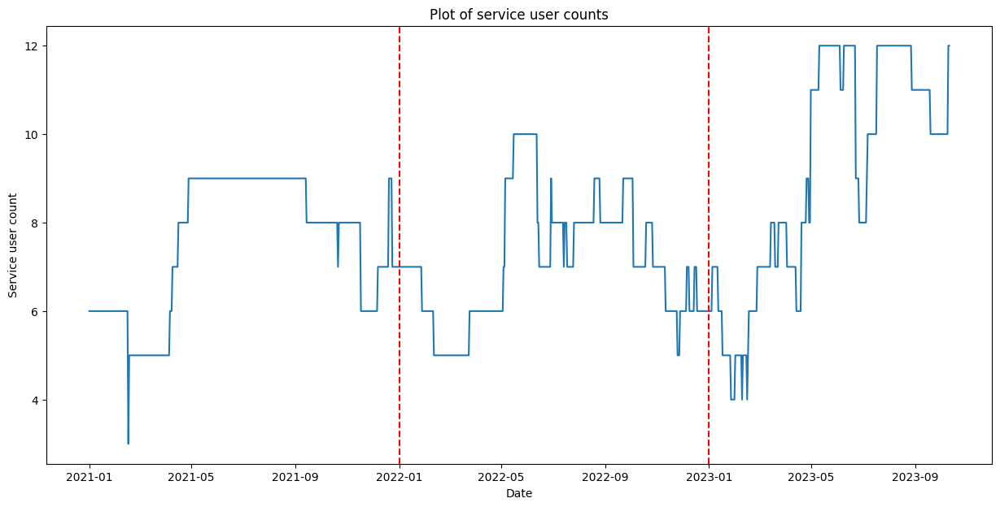

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,0)(2,1,0)[12]          


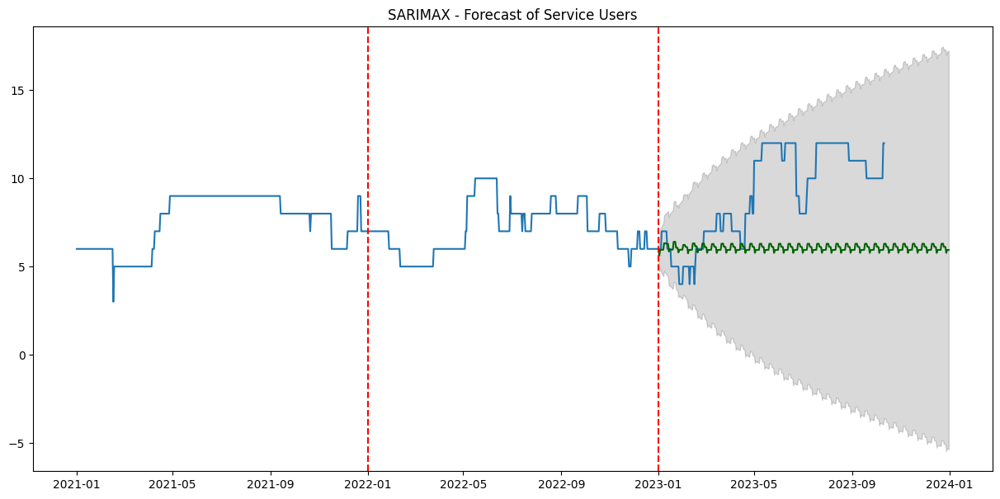

MSE:  16.070152904647692
RMSE:  4.008759521927911
MAE:  3.371553830359914
South Riverdale


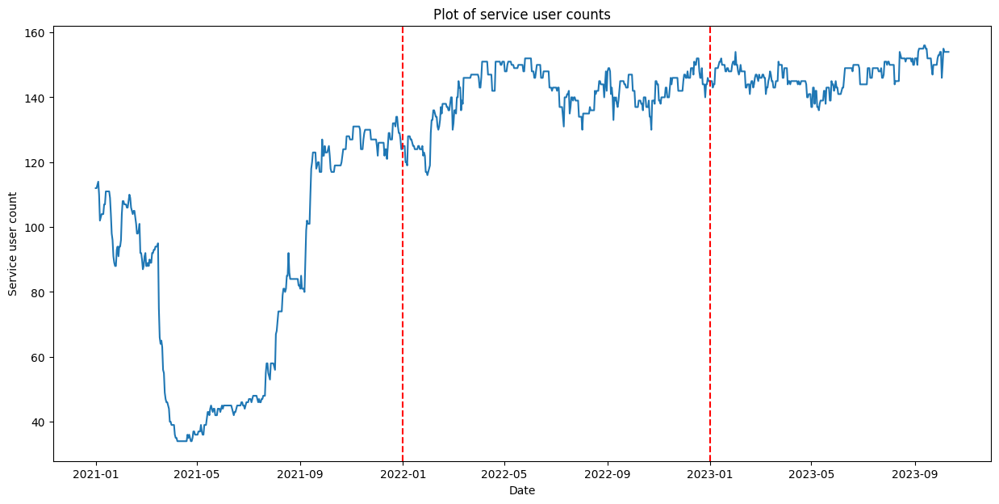

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12]          


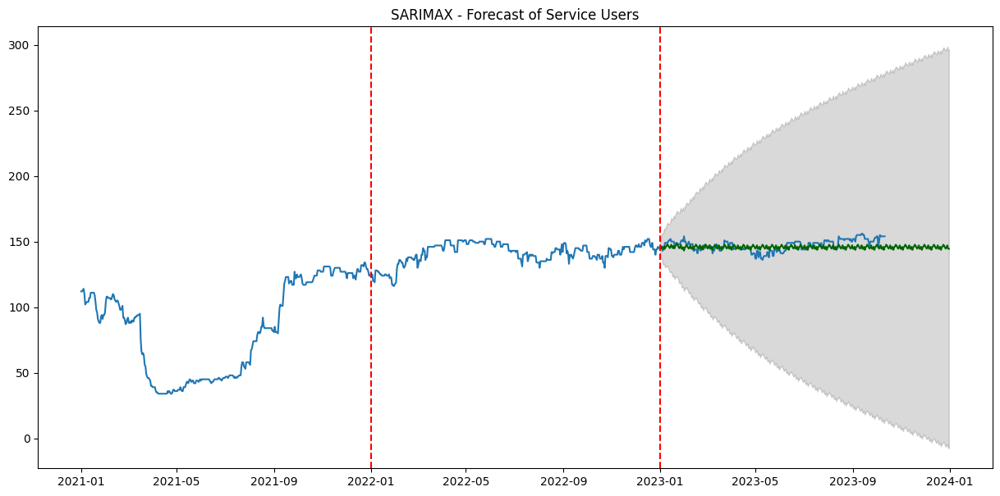

MSE:  21.276566203700657
RMSE:  4.612652837977367
MAE:  3.7406096044096557
Mimico-Queensway


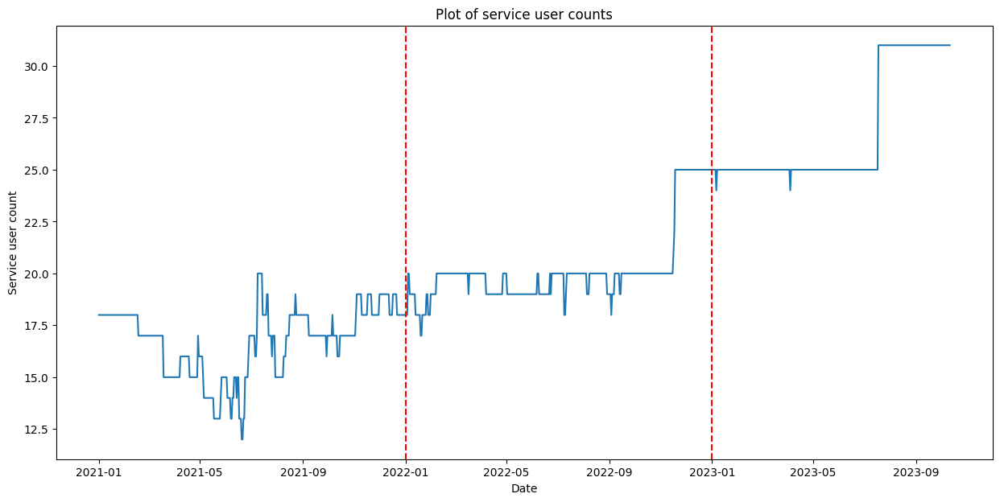

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12]          


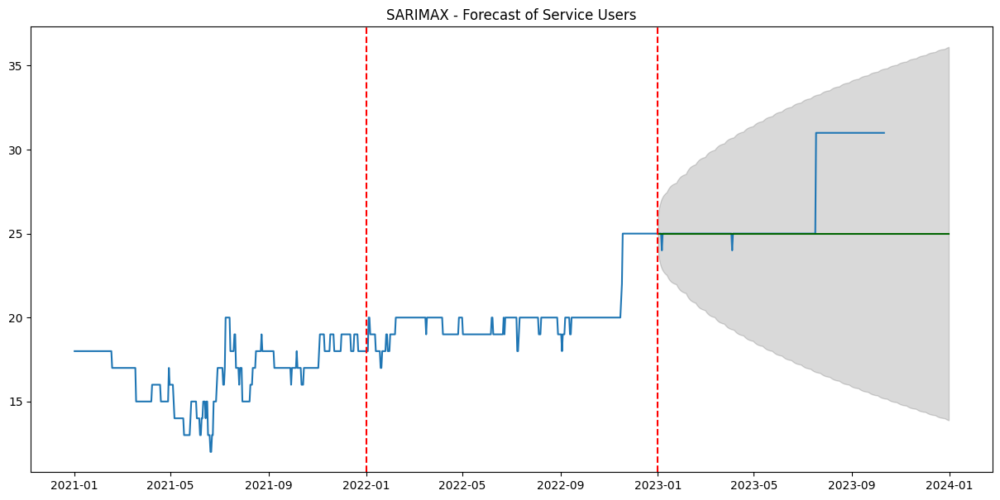

MSE:  10.908450700640376
RMSE:  3.3027943775900392
MAE:  1.8239436623722745
Newtonbrook East


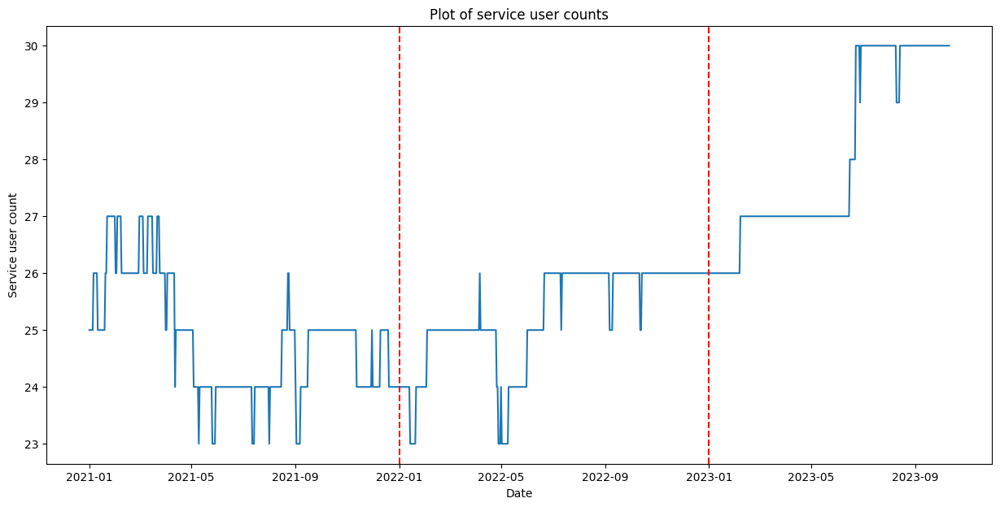

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(1,0,1)(2,1,0)[12]          


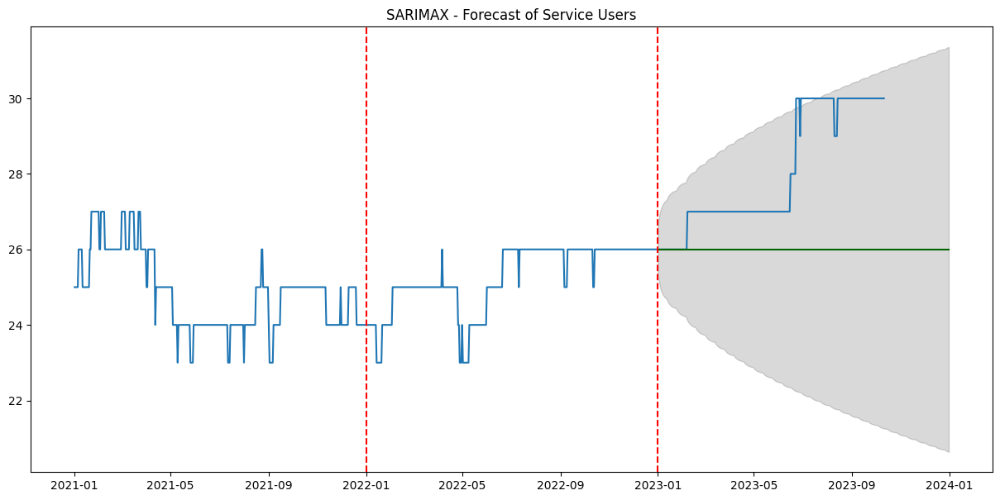

MSE:  6.6830985915492915
RMSE:  2.585168967698106
MAE:  2.049295774647887
South Parkdale


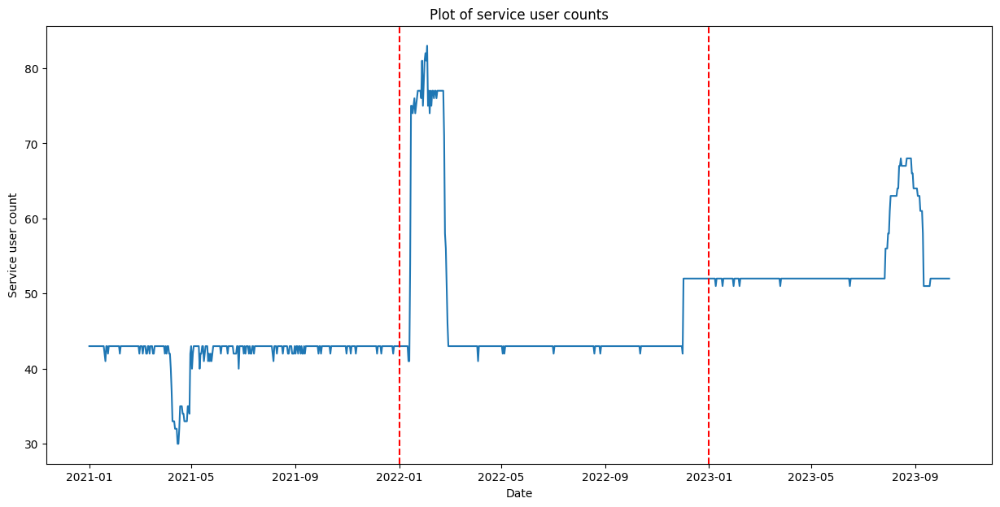

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(3,0,3)(2,1,0)[12] intercept


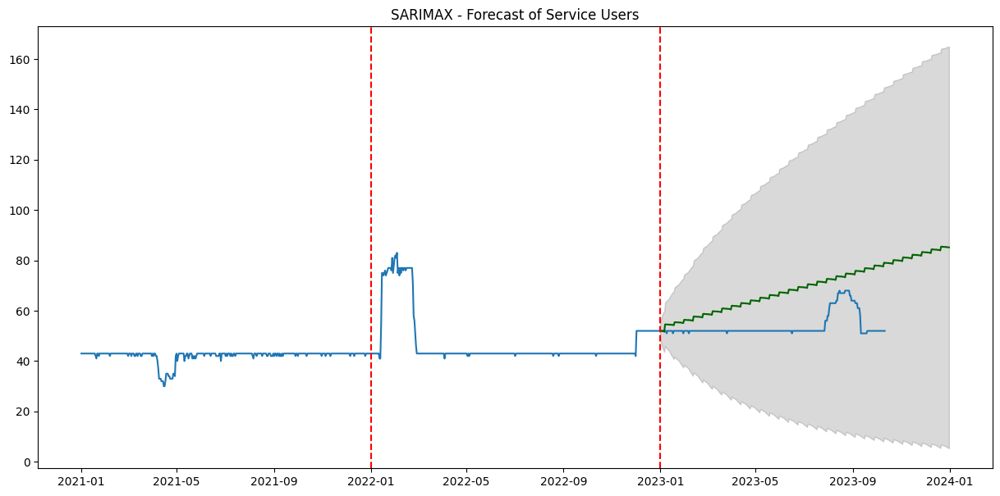

MSE:  190.8039792904638
RMSE:  13.81318136022487
MAE:  12.070684356413922
Thistletown-Beaumond Heights


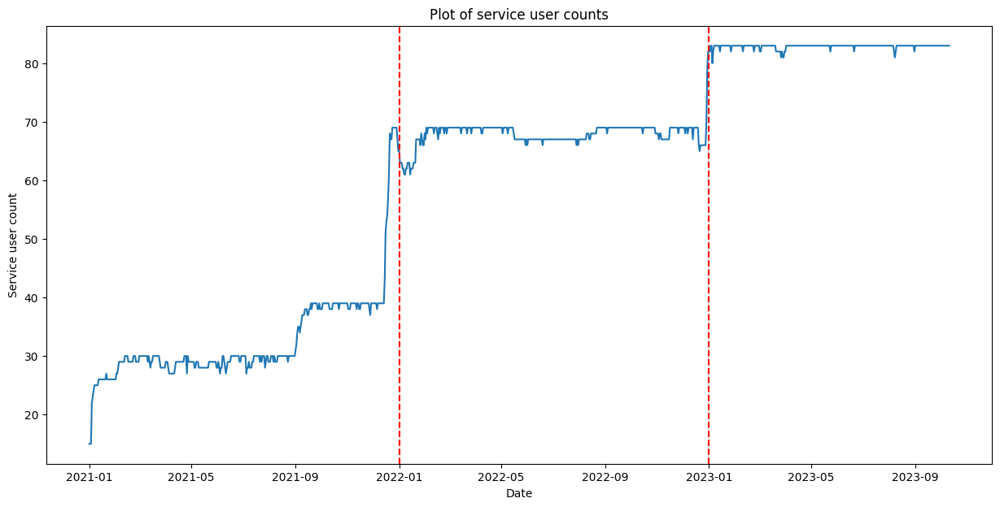

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,1)(2,1,0)[12] intercept


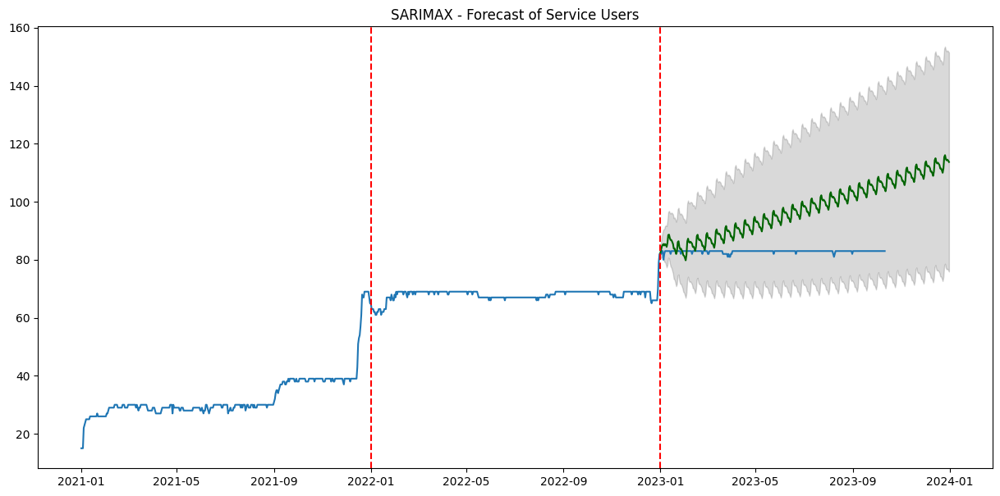

MSE:  177.26489227534526
RMSE:  13.314086235087455
MAE:  11.333344221804003
Woburn North


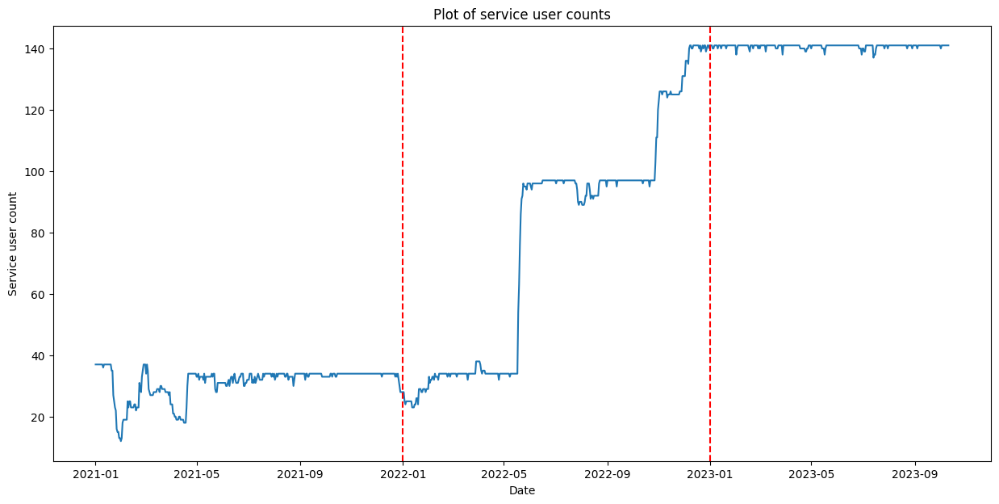

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,2)(2,1,0)[12]          


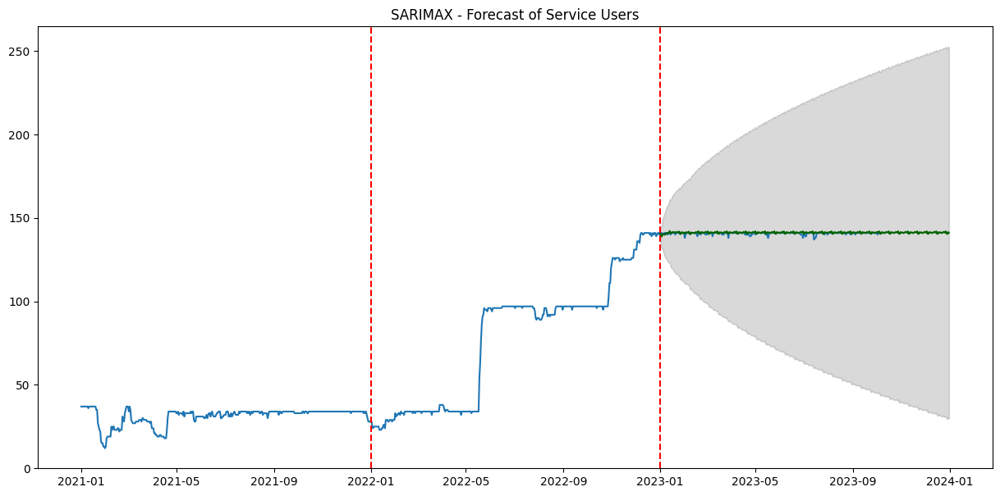

MSE:  0.769130749243336
RMSE:  0.8770009972875379
MAE:  0.6170299732136622
Little Portugal


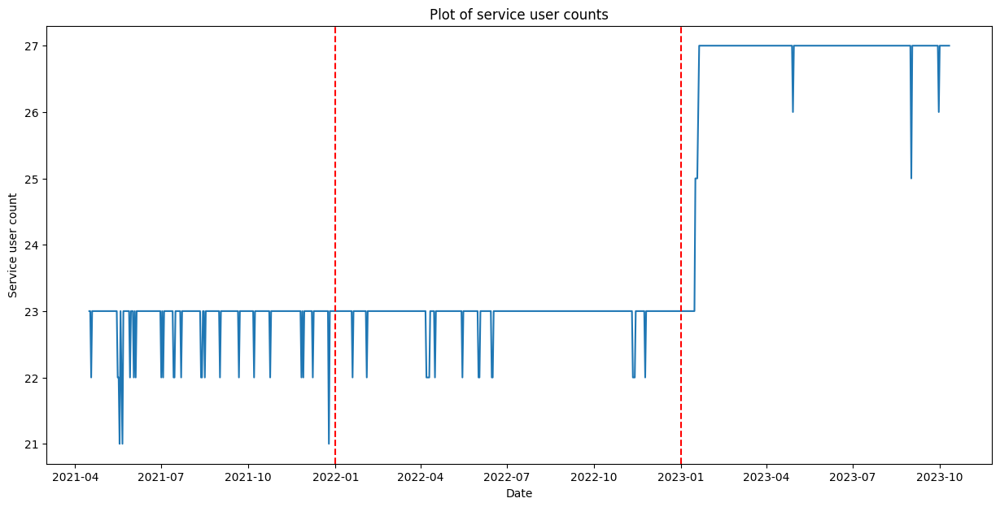

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(2,1,0)[12]          


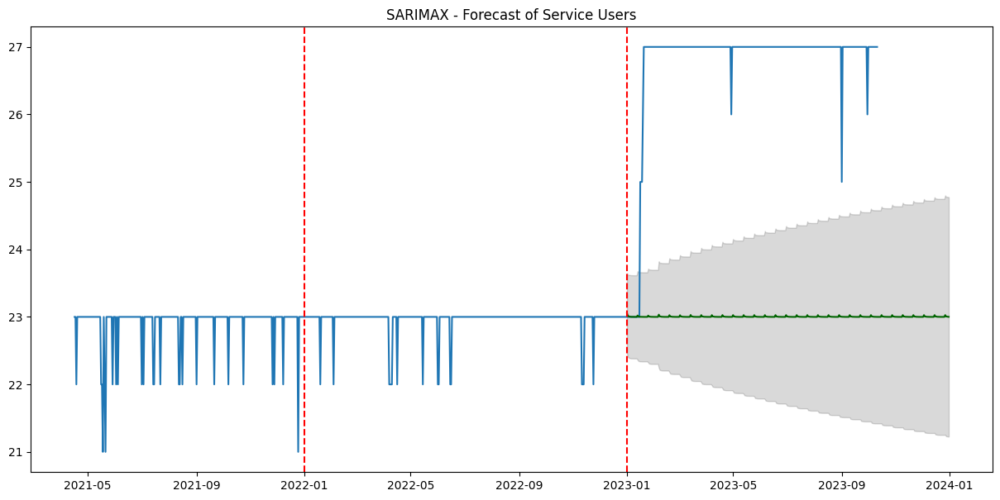

MSE:  14.887015019109972
RMSE:  3.85836947674921
MAE:  3.7472523049848703
Hillcrest Village


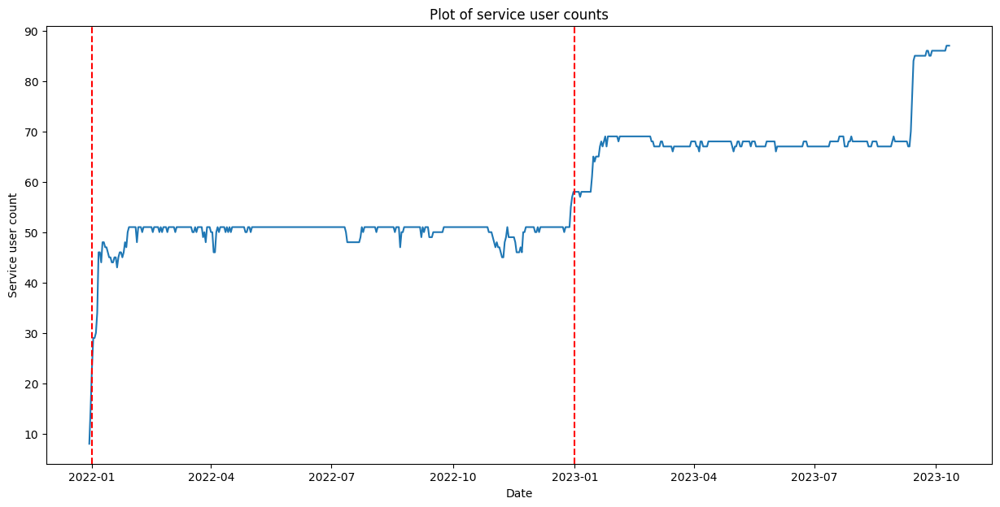

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,0,0)(0,1,1)[12]          


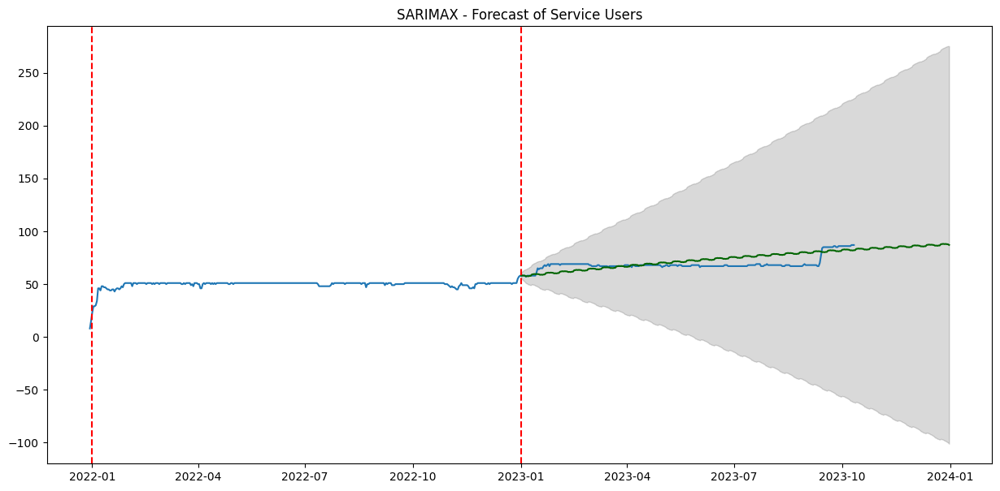

MSE:  45.089307809314775
RMSE:  6.714857244150077
MAE:  5.6214204013092095
Wexford/Maryvale


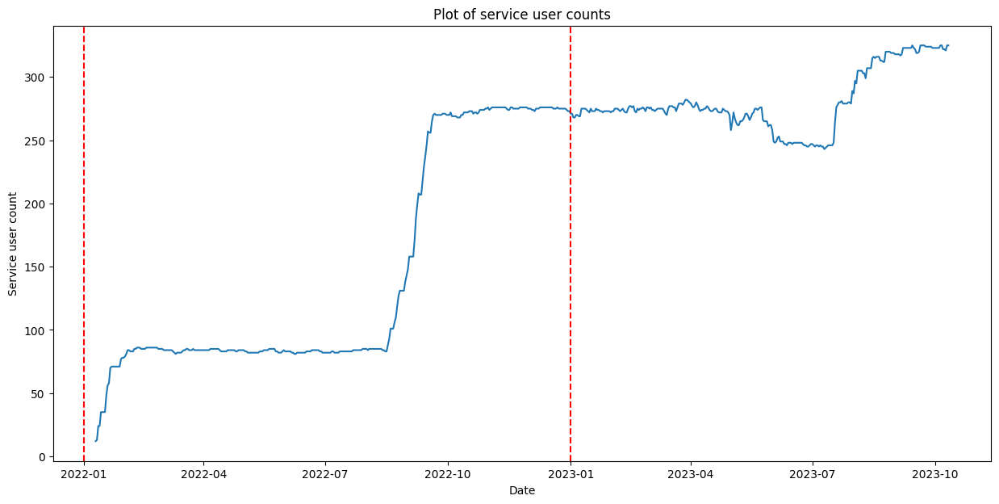

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,2,3)(2,1,0)[12]          


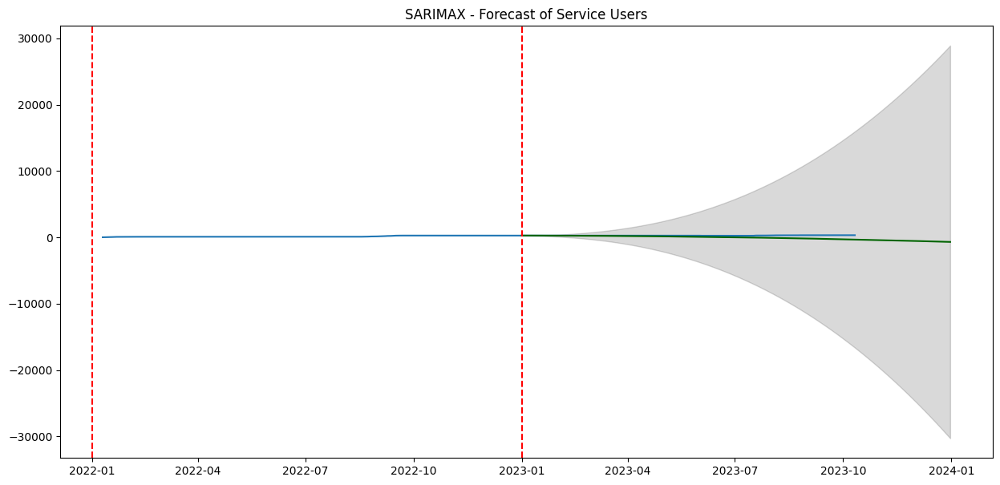

MSE:  86518.1400248079
RMSE:  294.13966074776096
MAE:  220.4295000211356
West Humber-Clairville


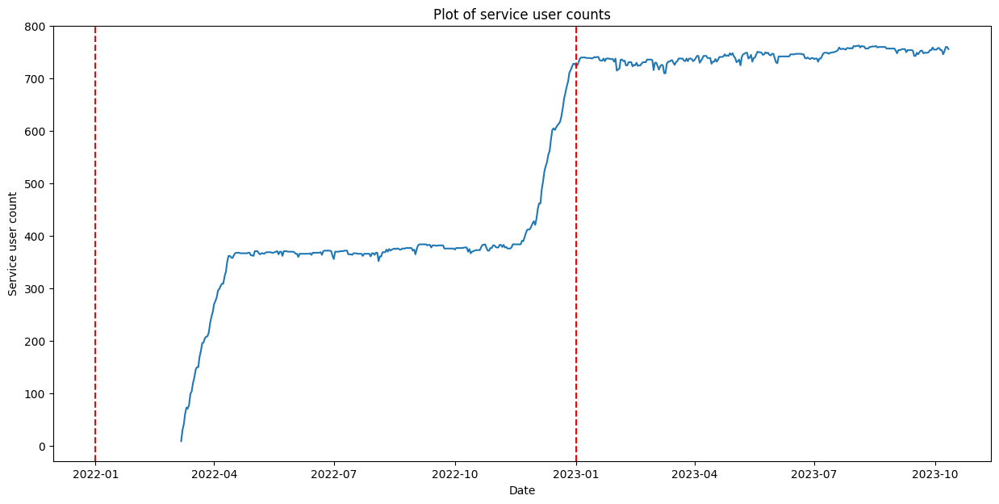

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\pmdarima\arima\_validation.py:76: UserWarning: stepwise model cannot be fit in parallel (n_jobs=1). Falling back to stepwise parameter search.
  warnings.warn('stepwise model cannot be fit in parallel (n_jobs=%i). '


 ARIMA(2,1,1)(0,1,1)[12]          


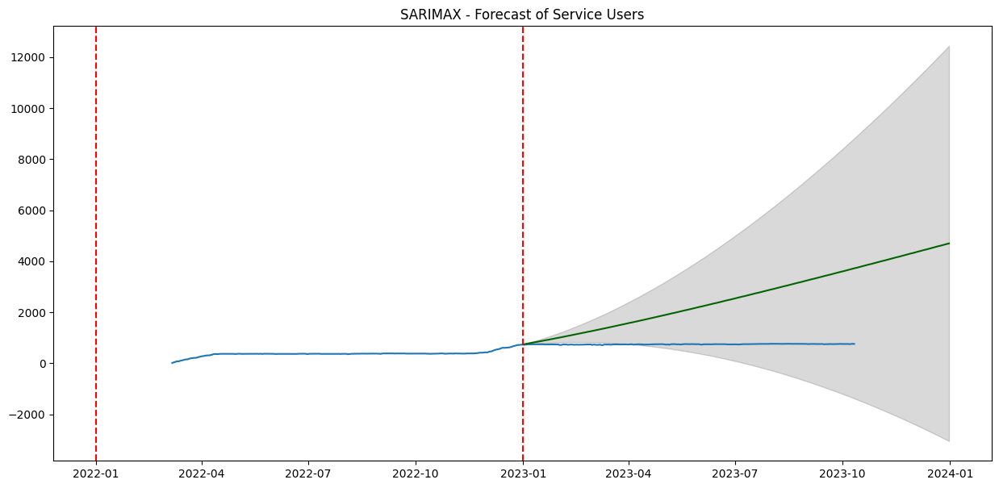

MSE:  2711501.9659208446
RMSE:  1646.6638897846897
MAE:  1402.6144621075457


In [157]:
# List of Neighbourhoods
neighbourhoods = data["Neighbourhood"].unique()
# print(neighbourhoods)

# remove these neighbourhoods as they seem to have shelters removed
neighbourhoodsRemove = np.array(["Downsview", # missing data
                                 "St.Andrew-Windfields", # missing data
                                 "Trinity-Bellwoods", "Willowdale West", "Woodbine Corridor", "East Willowdale" , "Yonge-Doris"])
mask = ~np.isin(neighbourhoods, neighbourhoodsRemove)
neighbourhoods = neighbourhoods[mask]

# Conduct Analysis for each of the neighbourhoods
Eval_values = pd.DataFrame(columns=["Neighbourhood", "MSE", "RMSE" "MAE"])

for neighbourhood in neighbourhoods:
    print(neighbourhood)
    dataN, testN, trainN = subsetNeighbourhood(data1_exo, test1, train1, neighbourhood)
    plotData(dataN, testN, trainN)
    SARIMAX_model = timeseriesModel(trainN)
    fitted_series, lower_series, upper_series = plotTimeseries(SARIMAX_model, dataN, trainN, testN)
    mse, rmse, mae = calcEval(testN["SERVICE_USER_COUNT"], fitted_series)
    dataEval = [[neighbourhood, mse, rmse, mae]]
    valueEval = pd.DataFrame(dataEval, columns=["Neighbourhood", "MSE", "RMSE", "MAE"])
    Eval_values = pd.concat([Eval_values, valueEval])


In [168]:
Eval_values = Eval_values.drop(columns=["RMSEMAE"])
Eval_values

,Neighbourhood,MSE,RMSE,MAE
0,University,2.492080e+01,4.992074,3.621389
0,High Park-Swansea,2.025324e+00,1.423139,1.367934
0,Junction-Wallace Emerson,1.706358e+00,1.306276,1.022647
0,Dovercourt Village,9.243394e+01,9.614257,7.629850
0,Annex,3.916337e+01,6.258065,5.215893
0,Bendale-Glen Andrew,1.433691e+02,11.973682,9.216240
0,Regent Park,2.497545e+01,4.997544,4.001442
0,North Toronto,1.484295e+03,38.526554,18.963421
0,West Hill,2.177046e+03,46.658821,44.400980
0,West Queen West,2.219465e+02,14.897870,12.658561


In [164]:
# Find the average MSE, RMSE and MAE
print("MSE :", np.mean(Eval_values["MSE"]))
print("RMSE :", np.mean(Eval_values["RMSE"]))
print("MAE", np.mean(Eval_values["MAE"]))

MSE : 69311.05129594581
RMSE : 64.78593116322656
MAE 54.0762180148052


In [172]:
Eval_exc = Eval_values[Eval_values["Neighbourhood"] != "West Humber-Clairville"]  # less than 1 year testing data and huge jump present - from 0 - 700 users
Eval_exc = Eval_exc[Eval_exc["Neighbourhood"] != "Wexford/Maryvale"]  # less than 1 year of data present and huge jump present - from 0 - 300+
Eval_exc

,Neighbourhood,MSE,RMSE,MAE
0,University,24.920800,4.992074,3.621389
0,High Park-Swansea,2.025324,1.423139,1.367934
0,Junction-Wallace Emerson,1.706358,1.306276,1.022647
0,Dovercourt Village,92.433942,9.614257,7.629850
0,Annex,39.163372,6.258065,5.215893
0,Bendale-Glen Andrew,143.369072,11.973682,9.216240
0,Regent Park,24.975446,4.997544,4.001442
0,North Toronto,1484.295373,38.526554,18.963421
0,West Hill,2177.045537,46.658821,44.400980
0,West Queen West,221.946528,14.897870,12.658561


In [173]:
# Find the average MSE, RMSE and MAE
print("MSE :", np.mean(Eval_exc["MSE"]))
print("RMSE :", np.mean(Eval_exc["RMSE"]))
print("MAE", np.mean(Eval_exc["MAE"]))

MSE : 1121.3589022596416
RMSE : 18.344093004098426
MAE 15.232845550726452


TESTING FUNCTIONS

In [ ]:
# Generate a date range with the expected frequency
for neighbourhood in neighbourhoods: 
    dataN, testN, trainN = subsetNeighbourhood(data1_exo, test1, train1, neighbourhood)
    df = trainN
    expected_date_range = pd.date_range(start=df.index.min(), end=df.index.max(), freq='D')

    # Find missing dates
    missing_dates = expected_date_range[~expected_date_range.isin(df.index)]

    # Display missing dates
    if not missing_dates.empty:
        print(neighbourhood, missing_dates)
        # else:
        #     print("No missing dates.")

In [ ]:
neighbourhood = "Downsview"
dataN, testN, trainN = subsetNeighbourhood(data1_exo, test1, train1, neighbourhood)
plotData(dataN, testN, trainN)
SARIMAX_model = timeseriesModel(trainN)
fitted_series, lower_series, upper_series = plotTimeseries(SARIMAX_model, dataN, trainN, testN)
print(fitted_series)
mse, rmse, mae = calcEval(testN["SERVICE_USER_COUNT"], fitted_series)
dataEval = [[neighbourhood, mse, rmse, mae]]
valueEval = pd.DataFrame(dataEval, columns=["Neighbourhood", "MSE", "RMSE", "MAE"])
# Eval_values = pd.concat([Eval_values, valueEval])

In [128]:
# Forecast
df = trainN
all = dataN
n_periods = 365

# get indices for new dataframe
forecast_df = pd.DataFrame({"day_index":pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D').day},
                index = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D'))


index_of_fc = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D')

# get predictions and confidence intervals
fitted, confint = SARIMAX_model.predict(n_periods=n_periods, 
                                        return_conf_int=True,
                                        index = index_of_fc
                                        )

# make series for plotting purpose
fitted_series = pd.Series(fitted, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\miche\AppData\Local\Programs\Python\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


Extract for 1 City - test Annex

In [10]:
# extract city specific data
data_Annex = data1_exo[data1_exo["Neighbourhood"] == "Annex"] 
test_Annex = test1[test1["Neighbourhood"] == "Annex"]
train_Annex = train1[train1["Neighbourhood"] == "Annex"]

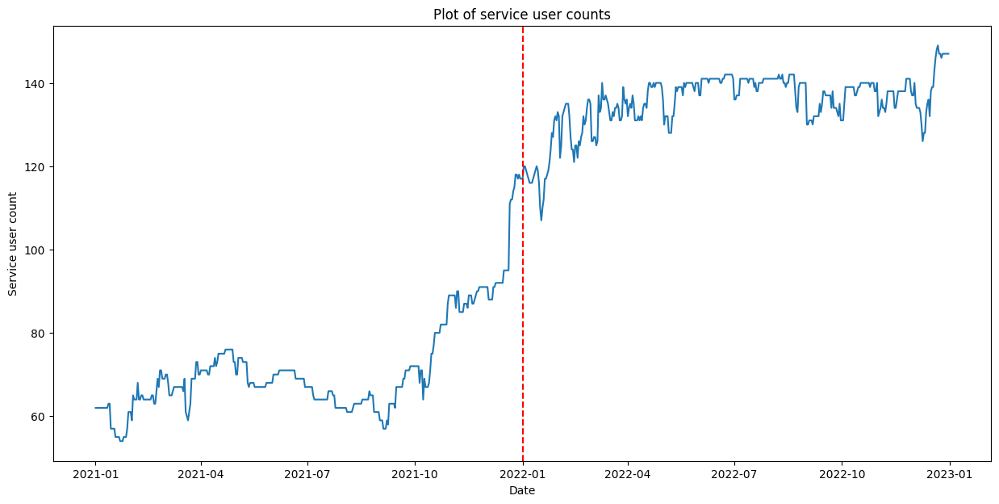

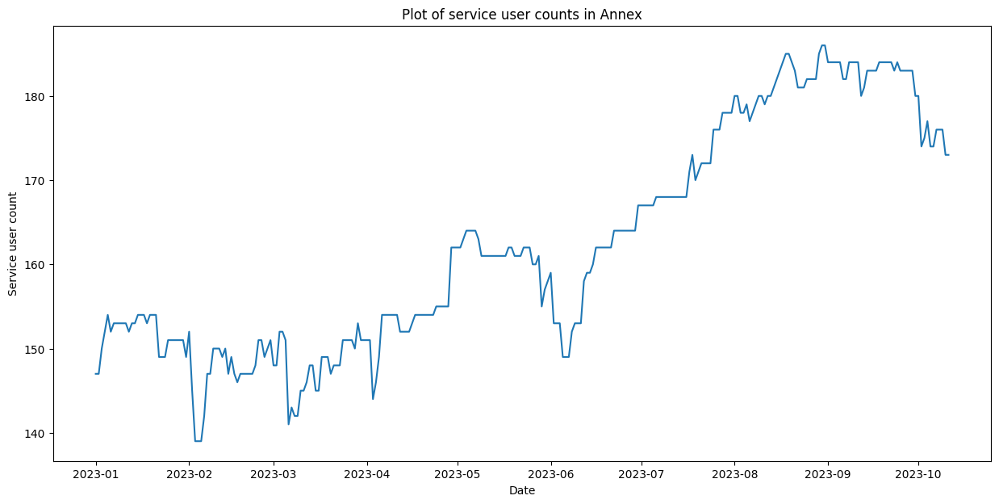

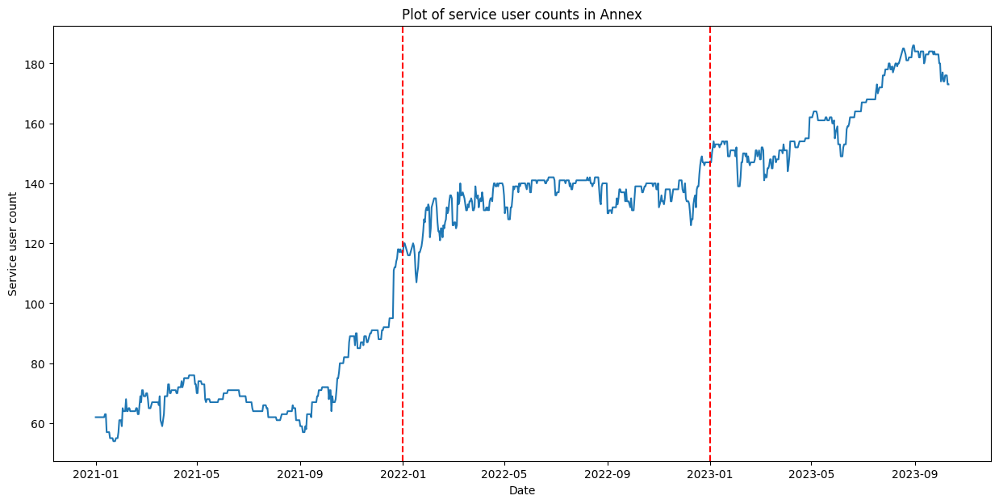

In [14]:
# plot for Annex 
# plot train 
plt.figure(figsize=(15,7))
plt.title("Plot of service user counts")
plt.xlabel('Date')
plt.ylabel('Service user count')
plt.plot(train_Annex["SERVICE_USER_COUNT"])
plt.plot()
plt.axvline(x=pd.to_datetime("2022-01-01"), color="red", linestyle="--")
plt.show()

# plot test
plt.figure(figsize=(15,7))
plt.title("Plot of service user counts in Annex")
plt.xlabel('Date')
plt.ylabel('Service user count')
plt.plot(test_Annex["SERVICE_USER_COUNT"])
plt.plot()

plt.show()

# plot all  
plt.figure(figsize=(15,7))
plt.title("Plot of service user counts in Annex")
plt.xlabel('Date')
plt.ylabel('Service user count')
plt.plot(data_Annex["SERVICE_USER_COUNT"])
plt.plot()
plt.axvline(x=pd.to_datetime("2022-01-01"), color="red", linestyle="--")
plt.axvline(x=pd.to_datetime("2023-01-01"), color="red", linestyle="--")
plt.show()

In [49]:
# perform the Dickey Fuller Test
import statsmodels.api as stats

result = stats.tsa.adfuller(train_Annex[['SERVICE_USER_COUNT']])
print("ADF Statistic:", result[0])
print("p-value:", result[1])
print("Critical Values:", result[4])

ADF Statistic: -0.7587962378434954
p-value: 0.8309268485478227
Critical Values: {'1%': -3.4393520240470554, '5%': -2.8655128165959236, '10%': -2.5688855736949163}


From above, we know that the data is non-stationary

In [ ]:
#adding exogenous variable

# SARIMAX Model
SARIMAX_model = pm.auto_arima(train_Annex[['SERVICE_USER_COUNT']], 
                            #   exogenous=data_Annex.iloc[:, 2:],
                           start_p=1, 
                           start_q=1,
                           test='adf',
                           max_p=3, 
                           max_q=3, 
                           m=365,
                           seasonal_test=True,
                           seasonal=True,
                           # d=None, 
                           start_P = 1,
                           max_P = 3,
                           D=1,
                           error_action='ignore',  
                           suppress_warnings=False, 
                           stepwise=True,
                           n_jobs= -1,
                           stationary= True,
                           trace=True,
                           scoring='mse')

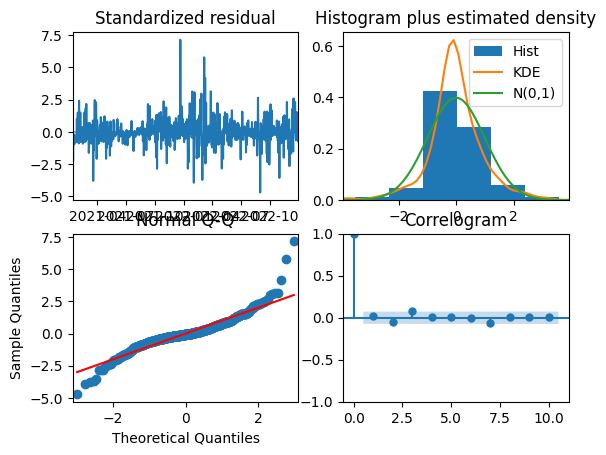

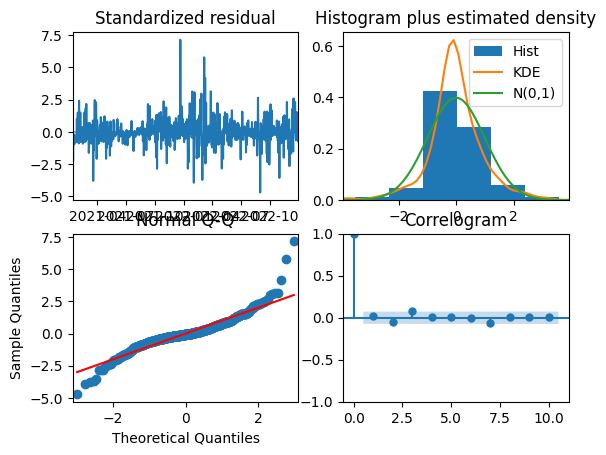

In [59]:
SARIMAX_model.plot_diagnostics()


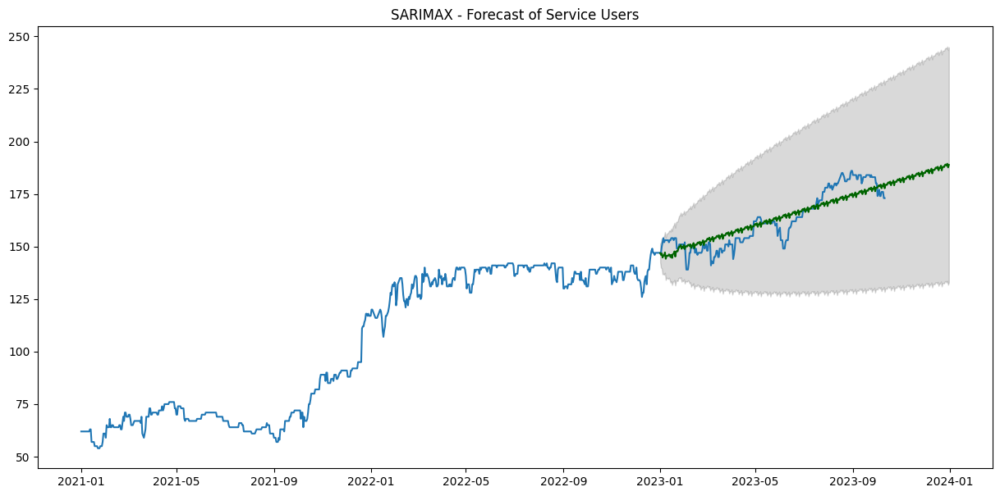

In [45]:
# Forecast
df = train_Annex
all = data_Annex
n_periods = 365

# get inices for new dataframe
forecast_df = pd.DataFrame({"month_index":pd.date_range(df.index[-1], periods = n_periods, freq='D').day},
                index = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D'))

# get predictions and confidence intervals
fitted, confint = SARIMAX_model.predict(n_periods=n_periods, 
                                        return_conf_int=True,
                                        exogenous=forecast_df.iloc[:, 2:]
                                        )
index_of_fc = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D')

# make series for plotting purpose
fitted_series = pd.Series(fitted, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.figure(figsize=(15,7))
plt.plot(all['SERVICE_USER_COUNT'], color='#1f76b4')
plt.plot(fitted_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                lower_series, 
                upper_series, 
                color='k', alpha=.15)

plt.title("SARIMAX - Forecast of Service Users")
plt.show()

In [ ]:
# show the predictions
def sarimax_forecast(SARIMAX_model, train, all , periods=365):
    # Forecast
    train = train
    all = all
    n_periods = periods

    # get inices for new dataframe
    forecast_df = pd.DataFrame({"month_index":pd.date_range(train.index[-1], periods = n_periods, freq='D').month},
                    index = pd.date_range(train.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D'))

    # get predictions and confidence intervals
    fitted, confint = SARIMAX_model.predict(n_periods=n_periods, 
                                            return_conf_int=True,
                                            exogenous=forecast_df.iloc[:, 2:])
    index_of_fc = pd.date_range(train.index[-1] + pd.DateOffset(days=1), periods = n_periods, freq='D')

    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
    plt.figure(figsize=(15,7))
    plt.plot(all['SERVICE_USER_COUNT'], color='#1f76b4')
    plt.plot(fitted_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                    lower_series, 
                    upper_series, 
                    color='k', alpha=.15)

    plt.title("SARIMAX - Forecast of Service Users")
    plt.show()